In [1]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import itertools
import warnings
warnings.simplefilter("ignore")


In [2]:
df= pd.read_csv('c:/python/SINO_Provinces.csv',sep=';',decimal=',')
df.head()

,Criteria,Province,1970,1971,1972,1973,1974,1975,1976,1977,...,2021,2022,2023,2024,2025,2026,2027,2028,2029,2030
0,Highway density,Beijing,17.636905,17.994048,18.708333,19.202381,20.136905,34.535714,37.750000,39.851190,...,135.688095,136.541071,137.394048,138.247024,139.100000,139.952976,140.805952,141.658929,142.511905,143.364881
1,Highway density,Tianjin,28.270758,28.632345,28.993932,29.355519,29.717106,30.078693,30.440280,30.801867,...,164.431858,167.523009,170.614159,173.705310,176.796460,179.887611,182.978761,186.069911,189.161062,192.252212
2,Highway density,Hebei,16.965370,17.805008,19.057006,18.384656,18.595099,18.962706,19.412360,20.229622,...,121.851785,125.652051,129.452317,133.252584,137.052850,140.853117,144.653383,148.453649,152.253916,156.054182
3,Highway density,Shanxi,17.986564,17.776711,17.900832,18.115803,18.399872,18.737684,19.225208,19.696097,...,96.389635,97.347345,98.305054,99.262764,100.220473,101.178183,102.135893,103.093602,104.051312,105.009021
4,Highway density,Inner Mongolia,2.333474,2.650465,2.931192,2.455030,2.561961,2.651057,2.824514,3.082925,...,16.711107,17.025241,17.339374,17.653508,17.967642,18.281775,18.595909,18.910042,19.224176,19.538309


In [3]:
Criteria=list(df[['Criteria']].groupby('Criteria').size().index)
Provinces=list(df[['Province']].groupby('Province').size().index)
Years=list(df.columns[2:])
Years2018=list(map(lambda x: str(x),range(1970,2019)))
abbr_Cr=['GA','DW','Dis','EPC','EPG','EPO','EC','GDP','HD','HL','MA','P','PWA','RL','RPWA','RWA','TIEPC','WW','WC','UR','Wet_A','WA','Wood_A','LA','WAP','CG']


In [4]:
parameters = list(itertools.product(Provinces,Years))
df_p=pd.DataFrame(parameters,columns=['Province','Year'])
df_p.Year=np.int32(df_p.Year)
for el in abbr_Cr:
    df_p[el]=0
for a1,el in enumerate(Criteria):
    df_p[abbr_Cr[a1]]=list(map(lambda a2: np.array(df[(df.Province==a2[0]) & (df.Criteria==el)])[0][int(a2[1])-1968],
                               parameters))
df_p.head(5)

,Province,Year,GA,DW,Dis,EPC,EPG,EPO,EC,GDP,...,TIEPC,WW,WC,UR,Wet_A,WA,Wood_A,LA,WAP,CG
0,Anhui,1970,1485.18,38.0,0.0,1148.0,0.0,0.9,338.000349,186.42,...,201.560395,17626.50781,178.56,3.0,1865.712613,4561.0,499.194474,139700.0,3.369797,2247.0
1,Anhui,1971,1485.20,38.0,0.0,1148.0,0.0,0.9,366.337349,199.65,...,249.854473,17631.05716,178.56,3.1,1850.345693,4547.0,494.798630,139700.0,3.249939,2247.0
2,Anhui,1972,1485.20,38.0,0.0,1148.0,0.0,0.9,429.501707,207.64,...,215.633087,17795.35196,178.56,3.1,1847.237334,4533.0,491.532894,139700.0,3.143129,2247.0
3,Anhui,1973,1485.20,38.0,0.0,1148.0,0.0,0.9,535.284138,216.49,...,196.435005,17844.90035,178.56,3.2,1842.380815,4520.0,488.172299,139700.0,3.047950,2247.0
4,Anhui,1974,1485.18,38.0,0.0,1148.0,0.0,0.9,554.601659,209.58,...,190.468387,17983.98395,178.56,3.2,1824.935726,4506.0,486.961794,139700.0,2.975505,2247.0


In [5]:
df_p['PWA/WA']=df_p['PWA']/df_p['WA']
df_p['WA/LA']=df_p['WA']/df_p['LA']
df_p['LA/(RL+HL)']=df_p['LA']/(df_p['RL']+df_p['HL'])
df_p['(RL+HL)/GDP']=(df_p['RL']+df_p['HL'])/df_p['GDP']
df_p['GDP/EC']=df_p['GDP']/df_p['EC']
df_p['EC/WW']=df_p['EC']/df_p['WW']
df_p['WW/TIEPC']=df_p['WW']/df_p['TIEPC']
df_p['TIEPC/P']=df_p['TIEPC']/df_p['P']
Cr1=['PWA','PWA/WA','WA/LA','LA/(RL+HL)','(RL+HL)/GDP','GDP/EC','EC/WW','WW/TIEPC','TIEPC/P','P']
df_p[Cr1].head()

,PWA,PWA/WA,WA/LA,LA/(RL+HL),(RL+HL)/GDP,GDP/EC,EC/WW,WW/TIEPC,TIEPC/P,P
0,1574.0,0.345100,0.032649,7.641396,98.068877,0.551538,0.019176,87.450254,0.051157,3940.0
1,1574.0,0.346162,0.032548,7.085616,98.752817,0.544989,0.020778,70.565305,0.061344,4073.0
2,1574.0,0.347231,0.032448,7.070912,95.150260,0.483444,0.024136,82.526073,0.051353,4199.0
3,1574.0,0.348230,0.032355,6.892979,93.616333,0.404439,0.029996,90.843790,0.045503,4317.0
4,1574.0,0.349312,0.032255,6.861156,97.151446,0.377893,0.030839,94.419784,0.043200,4409.0


In [6]:
Cr1f=['Protected wilderness area','Protected wilderness area / Wilderness area','Wilderness area / Land area',
     'Land area / (Railway length + Highway length)','(Railway length + Highway length) / GDP','GDP / Energy consumption',
     'Energy consumption / Total wastewater discharge','Total wastewater discharge / Total investment in enviornmental pollution control',
     'Total investment in enviornmental pollution control / Population','Population']


In [7]:
df_p[Cr1].max()

PWA            348790.000000
PWA/WA              0.613870
WA/LA               0.829547
LA/(RL+HL)       6081.650230
(RL+HL)/GDP       306.316832
GDP/EC             21.386813
EC/WW               5.350600
WW/TIEPC       439957.556755
TIEPC/P             6.564183
P               99056.000000
dtype: float64

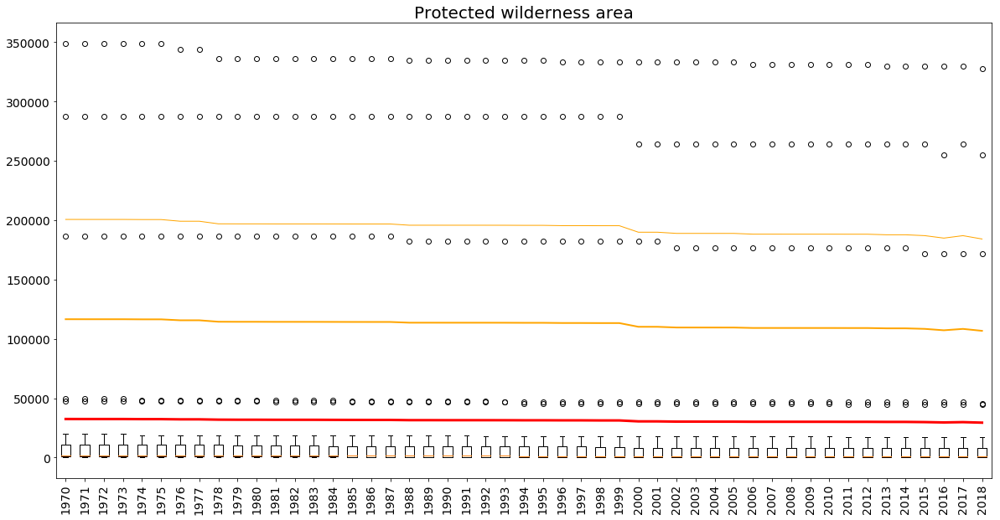

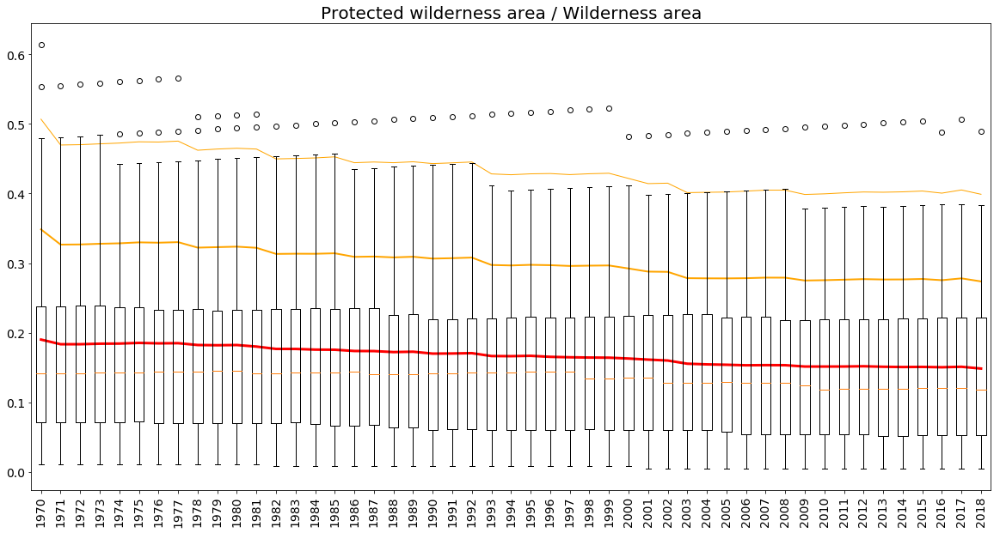

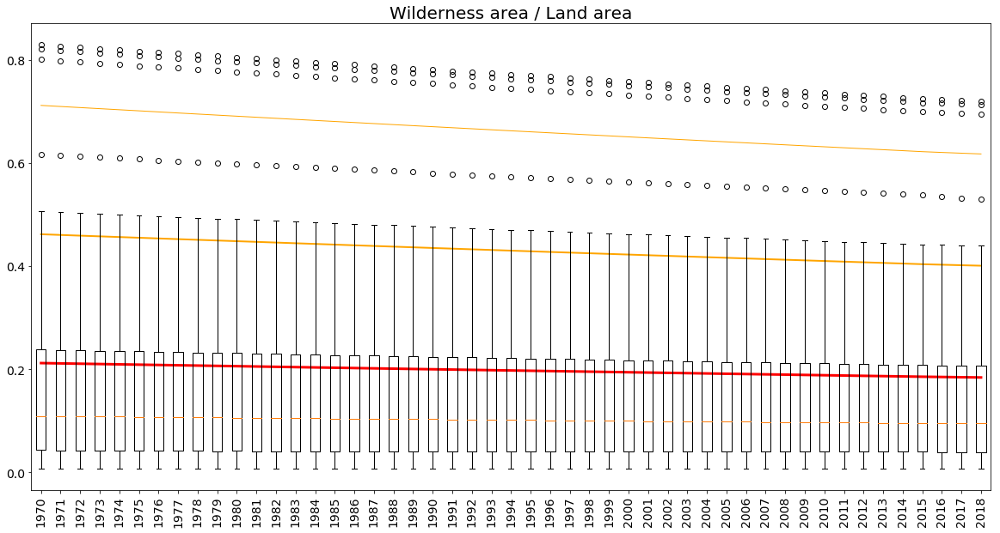

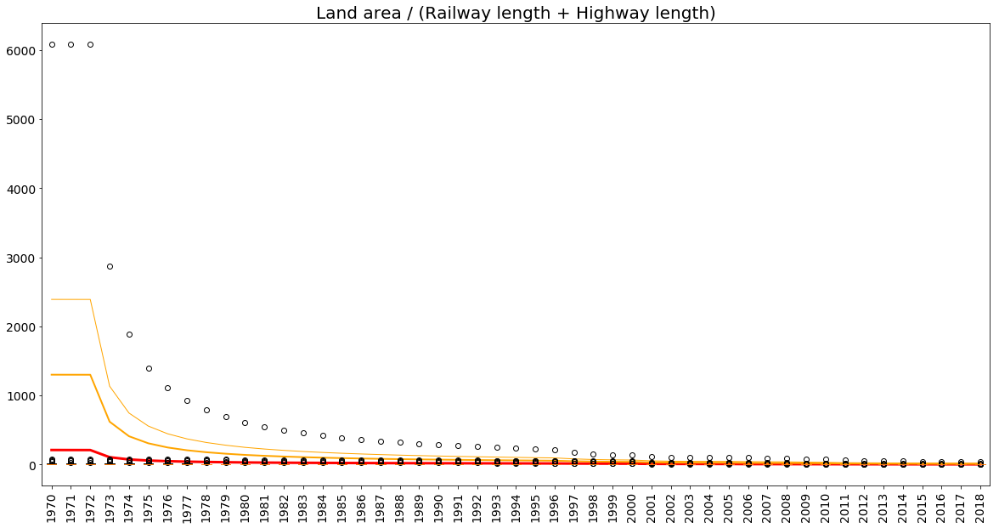

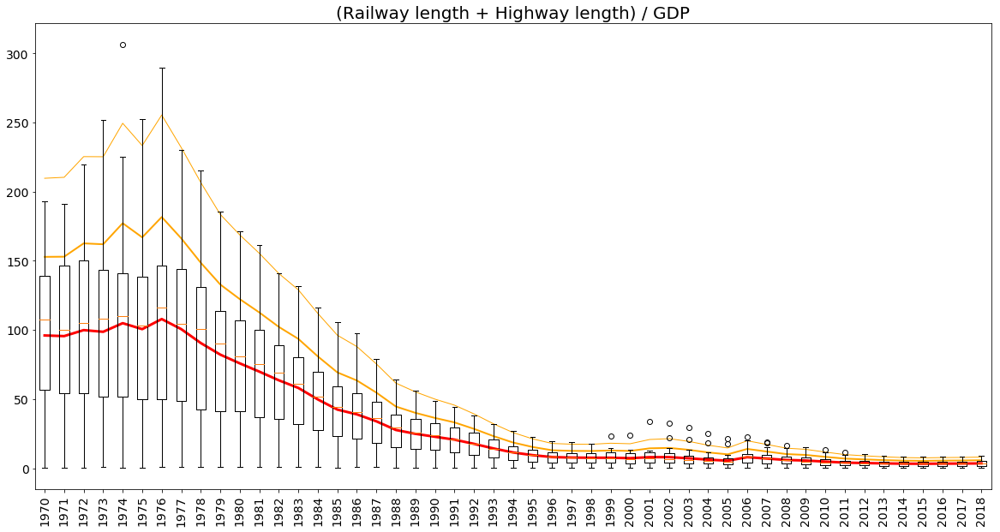

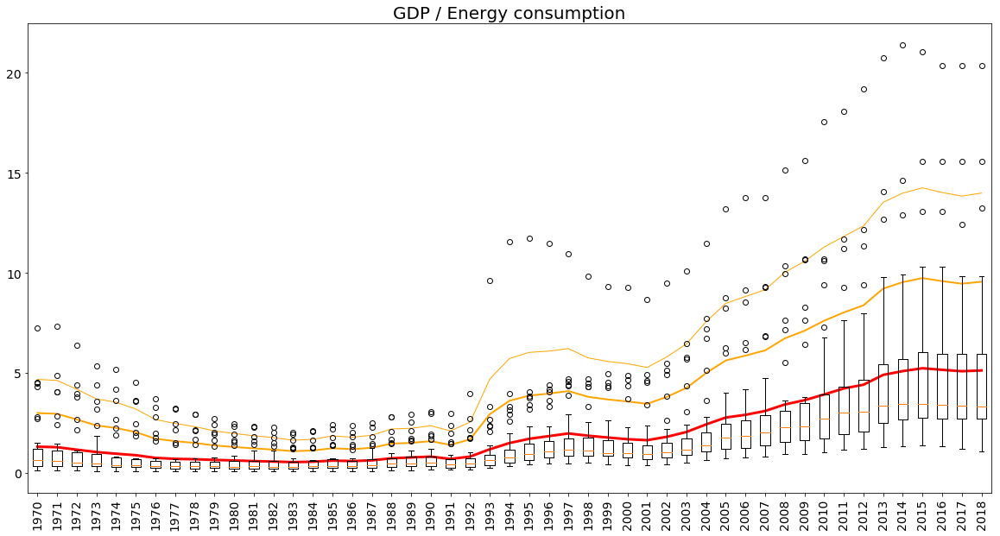

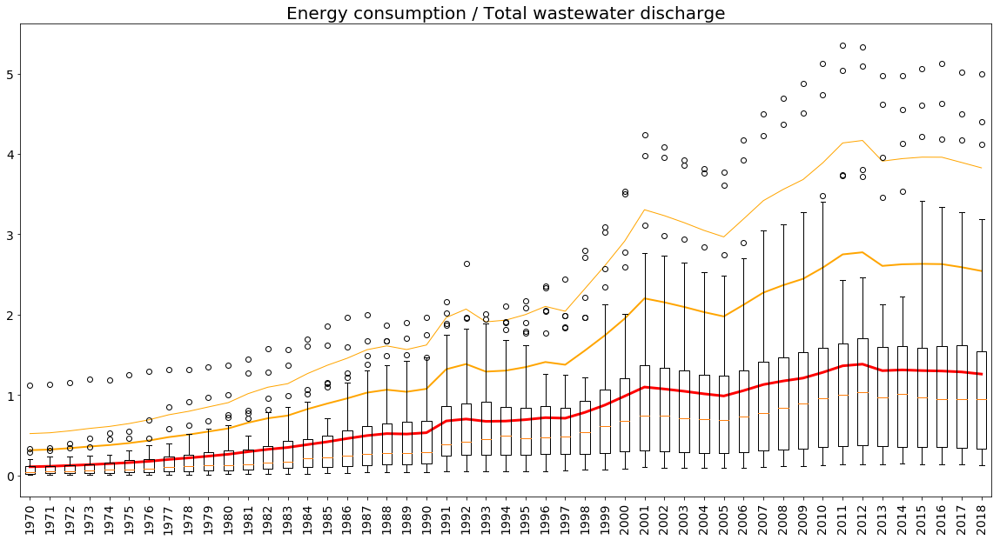

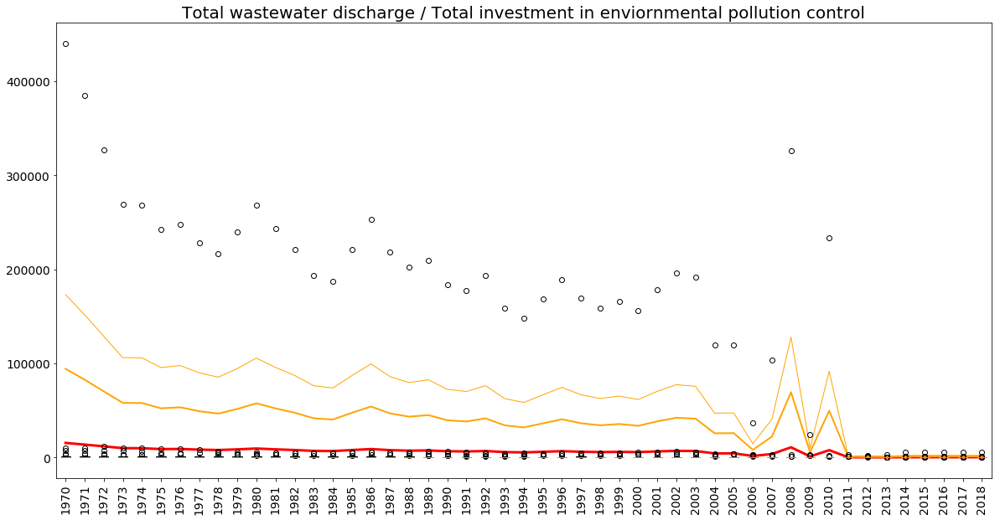

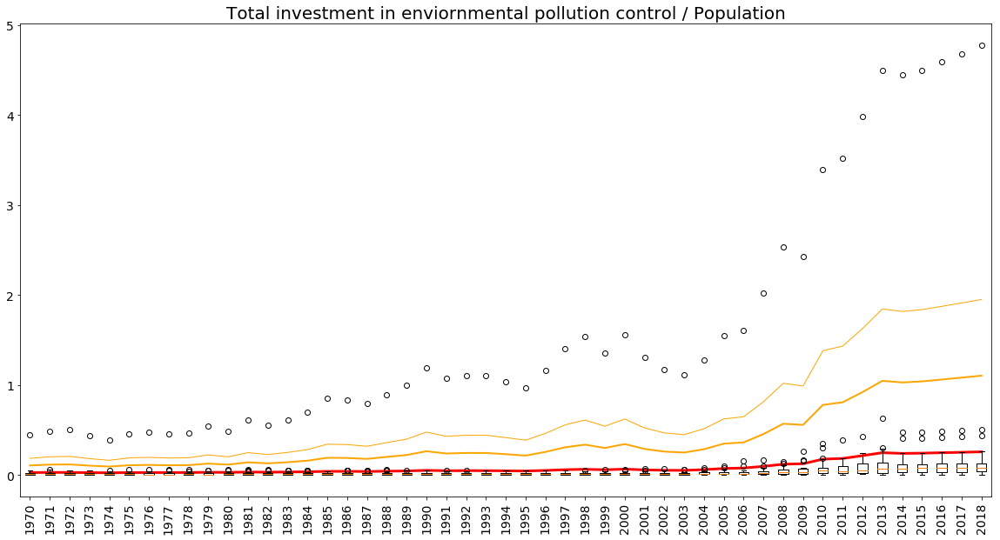

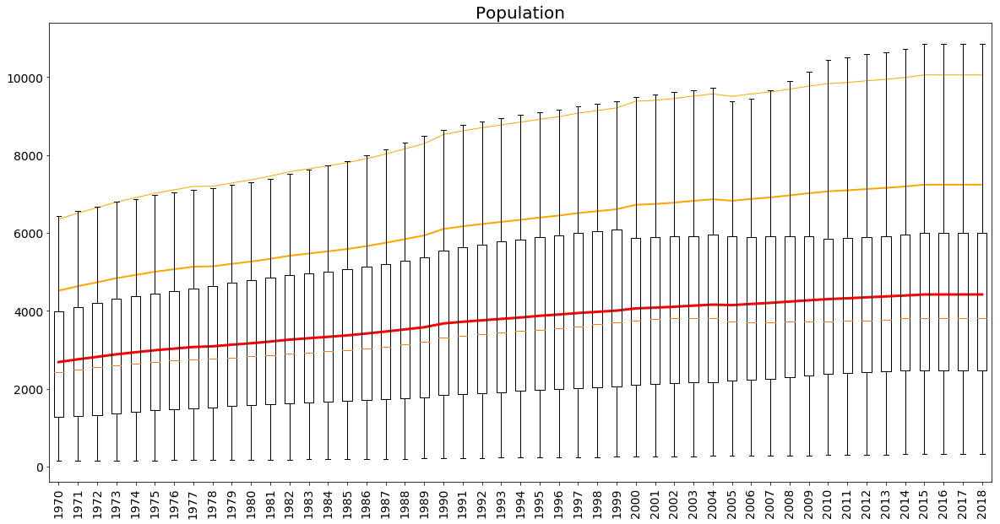

In [8]:
for num, par in enumerate(Cr1):
    plt.figure(figsize=(20,10))
    plt.rcParams['font.size'] = 14
    df0=pd.DataFrame(Provinces,columns=['Prow'])
    for el in range(1970,2019):
        df0[str(el)]=np.array(df_p[df_p.Year==el][par])
    df1=df0[df0.columns[1:]]
    plt.title(Cr1f[num],fontsize=20)
    rr1=range(1,len(Years2018)+1)
    plt.plot(rr1,df1.mean(),color='red',linewidth=3)
    #plt.plot(rr1,df1.median(),color='green',linewidth=3)
    std=df1.std()
    plt.plot(rr1,df1.mean()+std,color='orange',linewidth=2)
    plt.plot(rr1,df1.mean()+2*std,color='orange',linewidth=1)
    plt.boxplot(np.array(df1))
    plt.xticks(rr1,Years2018, rotation='vertical',fontsize=14)
    #plt.ylim((-0.05,0.5))
    #plt.legend(['mean','mean+stdev','mean+2stdev'], loc="lower center",ncol=3,fontsize=20)

    plt.show()

In [9]:
mm=[]
for par in Cr1:
    for pr in Provinces:
        mm.append([pr,par] + list(np.array(df_p[(df_p.Year<2019) & (df_p.Province==pr)][par])))
df_m=pd.DataFrame(mm, columns=['Province','Criteria']+Years2018)
df_m.head()

,Province,Criteria,1970,1971,1972,1973,1974,1975,1976,1977,...,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018
0,Anhui,PWA,1574.0,1574.0,1574.0,1574.0,1574.0,1574.0,1574.0,1574.0,...,876.0,876.0,876.0,876.0,778.0,778.0,778.0,778.0,778.0,750.0
1,Beijing,PWA,89.0,89.0,89.0,104.0,104.0,104.0,104.0,104.0,...,72.0,72.0,72.0,72.0,72.0,72.0,72.0,72.0,72.0,72.0
2,Chongqing,PWA,356.0,356.0,356.0,356.0,356.0,356.0,356.0,356.0,...,143.0,143.0,143.0,143.0,143.0,143.0,143.0,143.0,143.0,143.0
3,Fujian,PWA,879.0,879.0,879.0,879.0,879.0,879.0,879.0,879.0,...,698.0,698.0,698.0,698.0,668.0,668.0,668.0,668.0,668.0,668.0
4,Gansu,PWA,47689.0,47689.0,47689.0,47689.0,47689.0,47689.0,47689.0,47689.0,...,45129.0,45129.0,44879.0,44879.0,44879.0,44879.0,44879.0,44879.0,44879.0,44387.0


In [10]:
df_m.describe()

,1970,1971,1972,1973,1974,1975,1976,1977,1978,1979,...,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018
count,310.000000,310.000000,310.000000,310.000000,310.000000,310.000000,310.000000,310.000000,310.000000,310.000000,...,310.000000,310.000000,310.000000,310.000000,310.000000,310.000000,310.000000,310.000000,310.000000,310.000000
mean,5090.884591,4918.061202,4740.687184,4542.523079,4528.888991,4439.777772,4440.291950,4372.829096,4302.477207,4372.361325,...,3548.320253,4217.722615,3463.220731,3461.789689,3457.793201,3468.165098,3456.280217,3426.634690,3453.151265,3408.885918
std,37344.180970,35357.828789,33427.895597,31738.574117,31725.122351,31040.186385,31002.436760,30521.631090,29966.643383,30532.970735,...,26263.503339,29314.599630,26234.578205,26235.017531,26167.237039,26167.681711,26068.703837,25777.583317,26067.851406,25677.481274
min,0.000039,0.000043,0.000050,0.000060,0.000060,0.000066,0.000064,0.000069,0.000073,0.000066,...,0.000724,0.000080,0.004184,0.004202,0.004219,0.003815,0.003872,0.003950,0.004029,0.004109
25%,0.096324,0.096414,0.098273,0.102802,0.100565,0.106005,0.110275,0.112370,0.120365,0.122070,...,0.179740,0.191283,0.187282,0.217182,0.218698,0.219180,0.217889,0.218992,0.220005,0.220694
50%,3.188811,3.146071,3.132231,3.121062,2.867094,2.515131,2.331825,2.309601,2.237239,2.063478,...,1.841085,1.881011,1.975275,1.973541,1.956296,1.910572,1.869264,1.847999,1.835120,1.795267
75%,272.035072,287.737021,291.633283,282.518343,314.516708,268.678662,286.018687,235.537402,238.778584,261.468344,...,70.715263,58.587972,47.959151,38.233699,38.113042,41.058632,41.379865,40.813863,39.383157,38.559448
max,439957.556755,385220.839012,348790.000000,348790.000000,348790.000000,348790.000000,343789.000000,343789.000000,335987.000000,335987.000000,...,331267.000000,331267.000000,331267.000000,331267.000000,329578.000000,329578.000000,329578.000000,329578.000000,329578.000000,327393.000000


In [11]:
df1=df_m[['Criteria','Province']]
for el in Years2018:
    df1[el]=df_m[el]/df_m['1970']
df1.head()

,Criteria,Province,1970,1971,1972,1973,1974,1975,1976,1977,...,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018
0,PWA,Anhui,1.0,1.0,1.0,1.000000,1.000000,1.000000,1.000000,1.000000,...,0.556544,0.556544,0.556544,0.556544,0.494282,0.494282,0.494282,0.494282,0.494282,0.476493
1,PWA,Beijing,1.0,1.0,1.0,1.168539,1.168539,1.168539,1.168539,1.168539,...,0.808989,0.808989,0.808989,0.808989,0.808989,0.808989,0.808989,0.808989,0.808989,0.808989
2,PWA,Chongqing,1.0,1.0,1.0,1.000000,1.000000,1.000000,1.000000,1.000000,...,0.401685,0.401685,0.401685,0.401685,0.401685,0.401685,0.401685,0.401685,0.401685,0.401685
3,PWA,Fujian,1.0,1.0,1.0,1.000000,1.000000,1.000000,1.000000,1.000000,...,0.794084,0.794084,0.794084,0.794084,0.759954,0.759954,0.759954,0.759954,0.759954,0.759954
4,PWA,Gansu,1.0,1.0,1.0,1.000000,1.000000,1.000000,1.000000,1.000000,...,0.946319,0.946319,0.941077,0.941077,0.941077,0.941077,0.941077,0.941077,0.941077,0.930760


In [12]:
df1.describe()

,1970,1971,1972,1973,1974,1975,1976,1977,1978,1979,...,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018
count,310.0,310.000000,310.000000,310.000000,310.000000,310.000000,310.000000,310.000000,310.000000,310.000000,...,310.000000,310.000000,310.000000,310.000000,310.000000,310.000000,310.000000,310.000000,310.000000,310.000000
mean,1.0,1.000309,1.005894,1.015384,1.028656,1.045014,1.064369,1.087260,1.108537,1.129834,...,3.596665,3.905255,4.940192,5.593347,5.410124,5.110359,5.142268,5.146193,5.179508,5.195188
std,0.0,0.078761,0.133768,0.194032,0.273219,0.350299,0.430190,0.516739,0.605540,0.695702,...,6.878266,7.399780,13.664262,19.215528,14.243310,10.741250,10.808570,10.855114,10.996743,11.116105
min,1.0,0.635232,0.635232,0.472512,0.309339,0.229935,0.182969,0.151935,0.129902,0.113450,...,0.013326,0.012070,0.005929,0.003845,0.006125,0.007919,0.007219,0.006810,0.006525,0.006351
25%,1.0,0.966979,0.944248,0.940991,0.892429,0.854668,0.855251,0.841852,0.792125,0.782264,...,0.265595,0.242077,0.232977,0.218595,0.211825,0.209240,0.204712,0.199695,0.198851,0.194251
50%,1.0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.993032,0.976372,0.973401,...,0.889749,0.887084,0.884427,0.881782,0.879143,0.876514,0.873938,0.872158,0.870418,0.868666
75%,1.0,1.030684,1.053542,1.063572,1.093739,1.128673,1.150383,1.153679,1.151190,1.158236,...,2.354153,2.735456,3.333679,3.399442,3.719449,3.787644,3.774575,3.770249,3.661576,3.639225
max,1.0,1.252065,1.466106,1.980686,2.949838,3.757167,4.199727,4.328537,4.306216,4.452974,...,38.675571,41.891635,195.069541,303.552835,194.669092,98.765603,100.262840,102.268097,104.313459,106.399728


In [13]:
Province1='Tibet'
Province2='Shandong'

In [14]:
Delta_Tibet=[]
for el in Cr1:
    par1=np.array(df1[(df1.Criteria==el)&(df1.Province==Province1)][df1.columns[2:]])[0]
    for prov in Provinces:
        par2=np.array(df1[(df1.Criteria==el)&(df1.Province==prov)][df1.columns[2:]])[0]
        Delta_Tibet.append([el]+[prov]+list(np.abs(par1-par2)))
df3=pd.DataFrame(Delta_Tibet,columns=df1.columns)

In [66]:
df3.head()

,Criteria,Province,1970,1971,1972,1973,1974,1975,1976,1977,...,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018
0,PWA,Anhui,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.014338,0.014338,...,0.393217,0.393217,0.393217,0.393217,0.450636,0.450636,0.450636,0.450636,0.450636,0.462161
1,PWA,Beijing,0.0,0.0,0.0,0.168539,0.168539,0.168539,0.182877,0.182877,...,0.140772,0.140772,0.140772,0.140772,0.135929,0.135929,0.135929,0.135929,0.135929,0.129665
2,PWA,Chongqing,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.014338,0.014338,...,0.548075,0.548075,0.548075,0.548075,0.543233,0.543233,0.543233,0.543233,0.543233,0.536968
3,PWA,Fujian,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.014338,0.014338,...,0.155676,0.155676,0.155676,0.155676,0.184964,0.184964,0.184964,0.184964,0.184964,0.178699
4,PWA,Gansu,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.014338,0.014338,...,0.003442,0.003442,0.008684,0.008684,0.003842,0.003842,0.003842,0.003842,0.003842,0.007894


In [16]:
Delta_Shandong=[]
for el in Cr1:
    par1=np.array(df1[(df1.Criteria==el)&(df1.Province==Province2)][df1.columns[2:]])[0]
    for prov in Provinces:
        par2=np.array(df1[(df1.Criteria==el)&(df1.Province==prov)][df1.columns[2:]])[0]
        Delta_Shandong.append([el]+[prov]+list(np.abs(par1-par2)))
df4=pd.DataFrame(Delta_Shandong,columns=df1.columns)

In [17]:
ro=0.5
df5=pd.DataFrame(Provinces,columns=['Province'])
for num,el in enumerate(Cr1):
        maxmax=np.max(np.array(df3[df3.Criteria==el][df3.columns[2:]]))
        minmin=np.min(np.array(df3[df3.Criteria==el][df3.columns[2:]]))
        df5[el]=np.mean((minmin+ro*maxmax)/(np.array(df3[(df3.Criteria==el)][df3.columns[2:]])+ro*maxmax),axis=1)
df5.head()

,Province,PWA,PWA/WA,WA/LA,LA/(RL+HL),(RL+HL)/GDP,GDP/EC,EC/WW,WW/TIEPC,TIEPC/P,P
0,Anhui,0.746271,0.751995,0.998792,0.790454,0.974662,0.782496,0.775359,0.619468,0.984283,0.759033
1,Beijing,0.838056,0.779137,0.643236,0.677235,0.926920,0.783262,0.787896,0.863407,0.993215,0.780321
2,Chongqing,0.586901,0.597153,0.991210,0.742435,0.961127,0.847235,0.894395,0.869052,0.993606,0.629379
3,Fujian,0.774552,0.782459,0.999674,0.764995,0.961306,0.796678,0.709307,0.864163,0.996326,0.852850
4,Gansu,0.969046,0.971206,0.999983,0.816823,0.983591,0.777421,0.775878,0.833239,0.993559,0.769217


In [18]:
ro=0.5
df6=pd.DataFrame(Provinces,columns=['Province'])
for num,el in enumerate(Cr1):
        maxmax=np.max(np.array(df4[df4.Criteria==el][df4.columns[2:]]))
        minmin=np.min(np.array(df4[df4.Criteria==el][df4.columns[2:]]))
        df6[el]=np.mean((minmin+ro*maxmax)/(np.array(df4[(df4.Criteria==el)][df4.columns[2:]])+ro*maxmax),axis=1)
df6.head()

,Province,PWA,PWA/WA,WA/LA,LA/(RL+HL),(RL+HL)/GDP,GDP/EC,EC/WW,WW/TIEPC,TIEPC/P,P
0,Anhui,0.629088,0.616949,0.998804,0.849000,0.956284,0.965511,0.875308,0.593791,0.969460,0.868864
1,Beijing,0.466218,0.485181,0.642529,0.689353,0.906379,0.969961,0.834844,0.899476,0.982566,0.727310
2,Chongqing,0.641315,0.624712,0.992082,0.667055,0.989188,0.882897,0.743236,0.855377,0.980937,0.875073
3,Fujian,0.526090,0.507281,0.998490,0.748207,0.965594,0.985154,0.825026,0.843947,0.982681,0.749125
4,Gansu,0.433740,0.415511,0.998399,0.768314,0.971902,0.949917,0.878133,0.796478,0.978308,0.843667


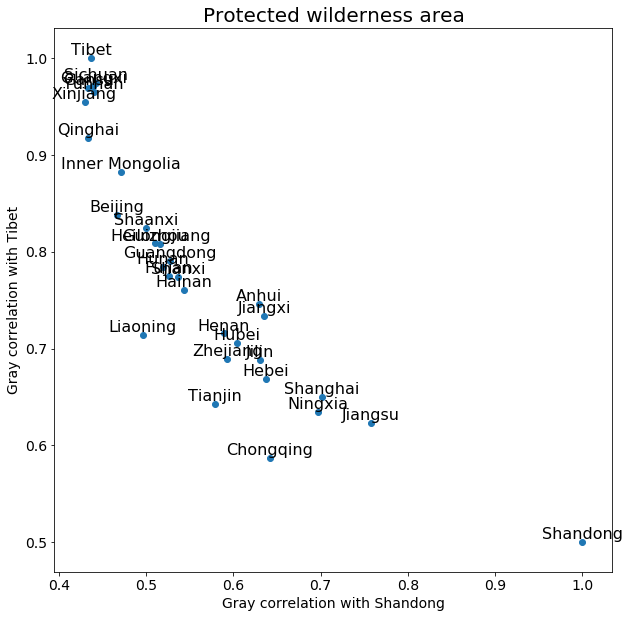

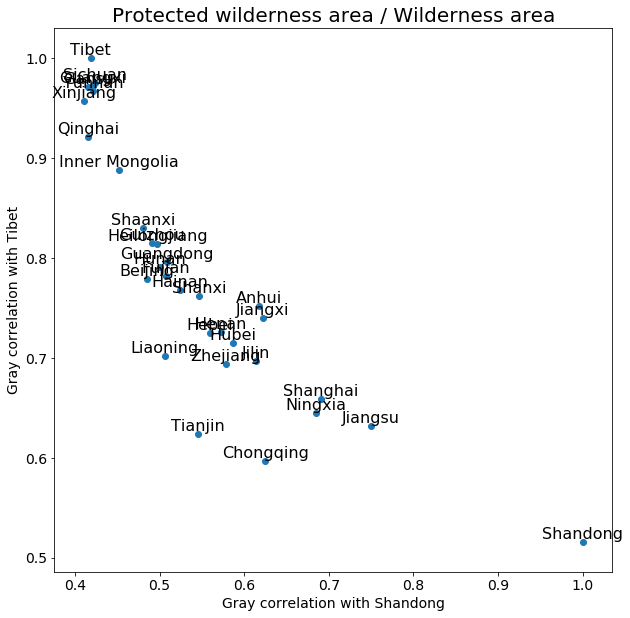

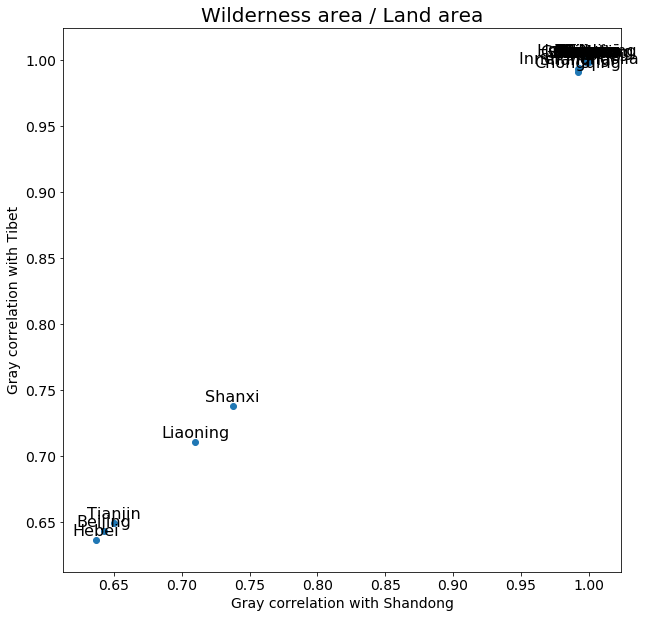

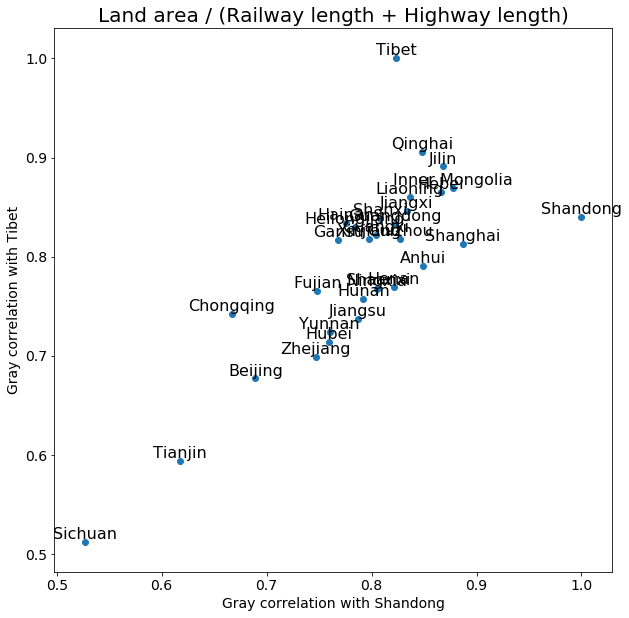

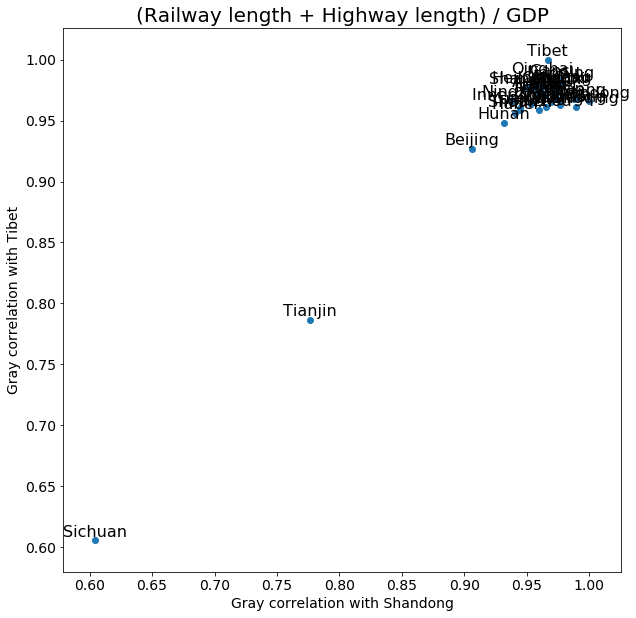

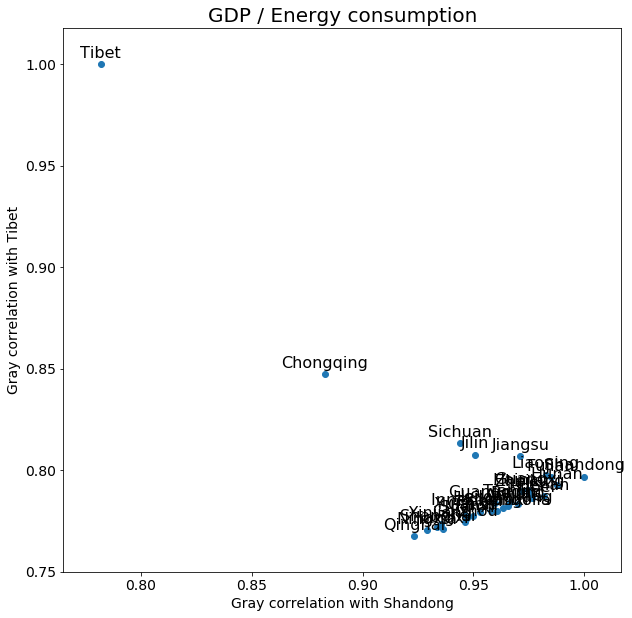

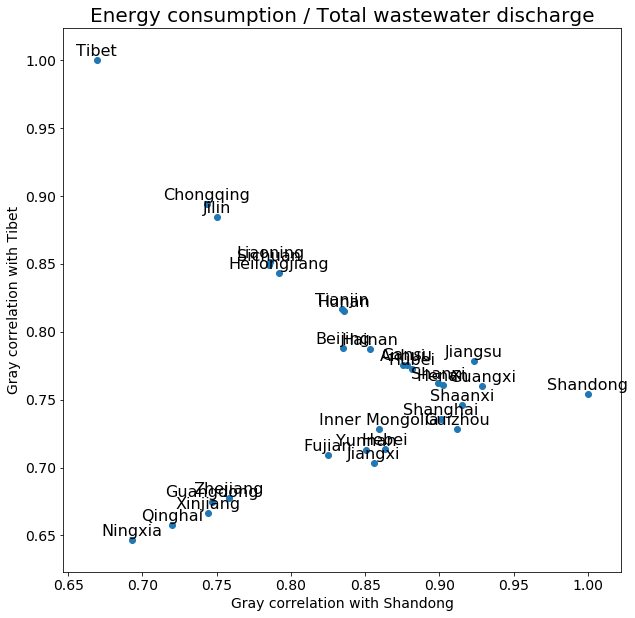

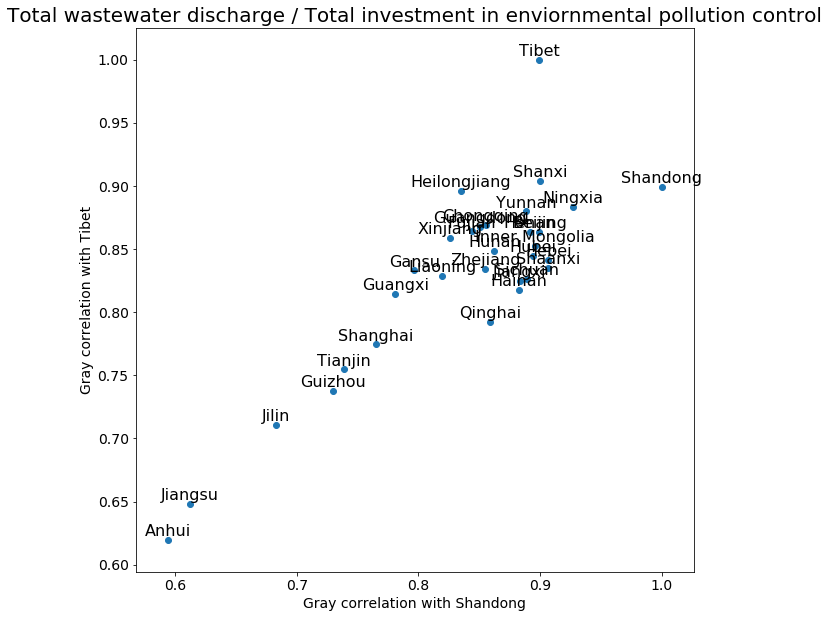

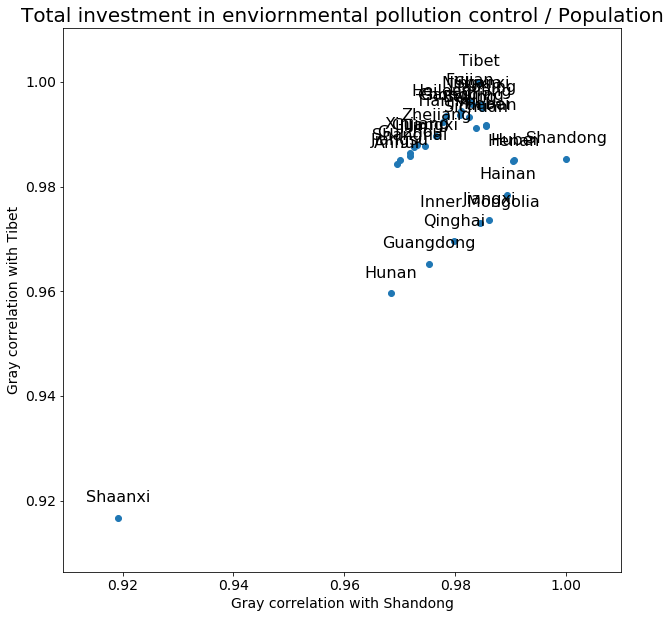

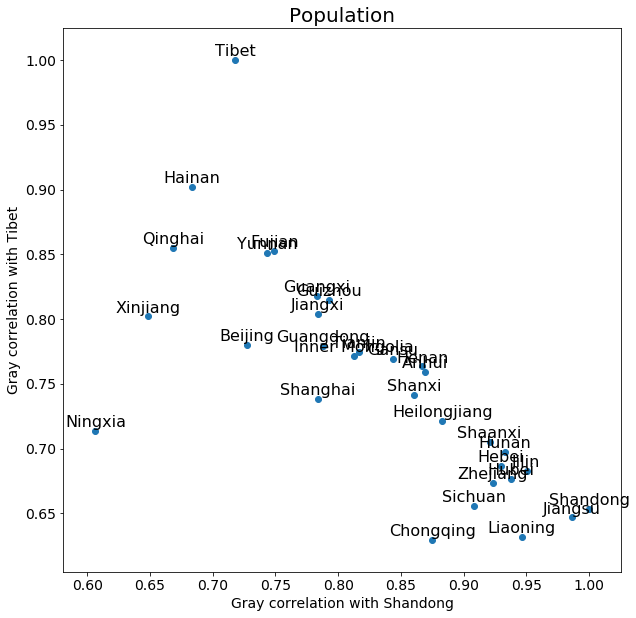

In [19]:
for num,el in enumerate(Cr1):
        plt.figure(figsize=(10,10))
        plt.title(Cr1f[num],fontsize=20)
        plt.scatter(df6[el],df5[el])
        plt.xlabel('Gray correlation with '+Province2)
        plt.ylabel('Gray correlation with '+Province1)
        for x in range(len(Provinces)):
            plt.text(df6.loc[x][el],df5.loc[x][el]+0.003,Provinces[x],horizontalalignment='center',fontsize=16)
        plt.show()

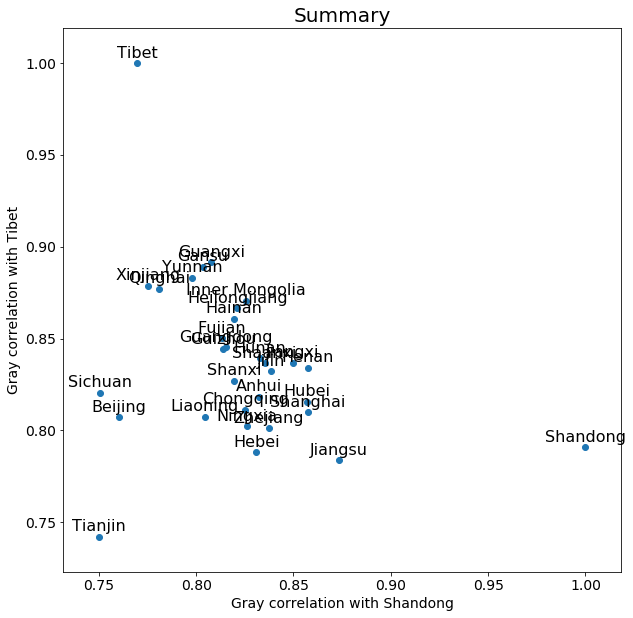

In [20]:
yyy=np.mean(np.array(df5[df5.columns[1:]]),axis=1)
xxx=np.mean(np.array(df6[df5.columns[1:]]),axis=1)
plt.figure(figsize=(10,10))
plt.title('Summary',fontsize=20)
plt.scatter(xxx,yyy)
plt.xlabel('Gray correlation with '+Province2)
plt.ylabel('Gray correlation with '+Province1)
for x in range(len(Provinces)):
    plt.text(xxx[x],yyy[x]+0.003,Provinces[x],horizontalalignment='center',fontsize=16)
plt.show()

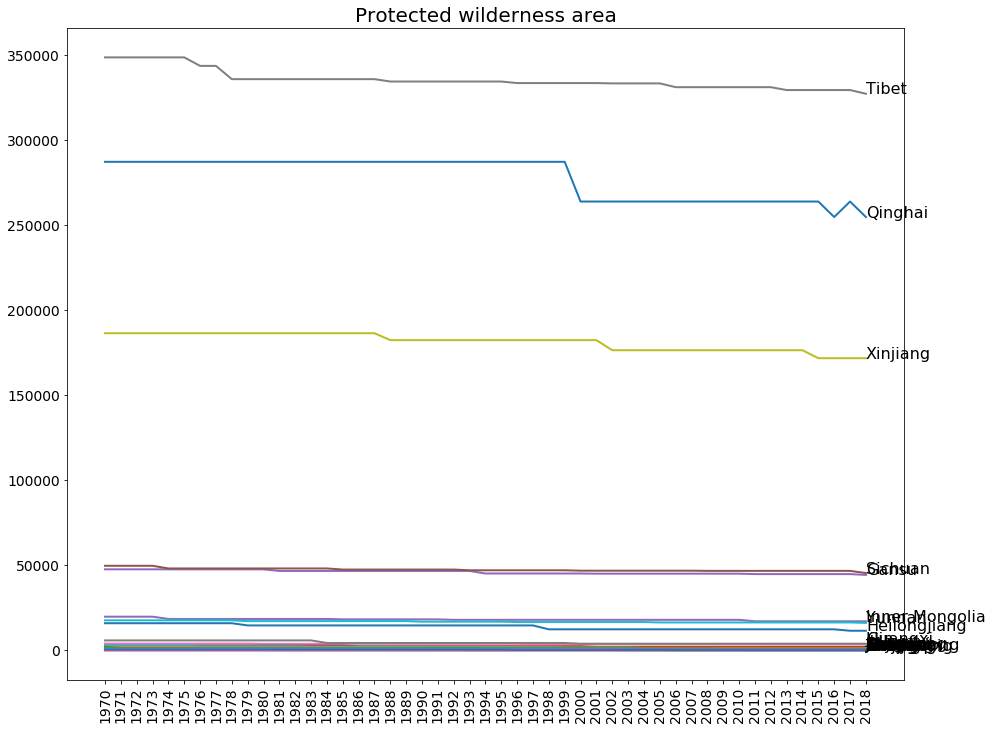

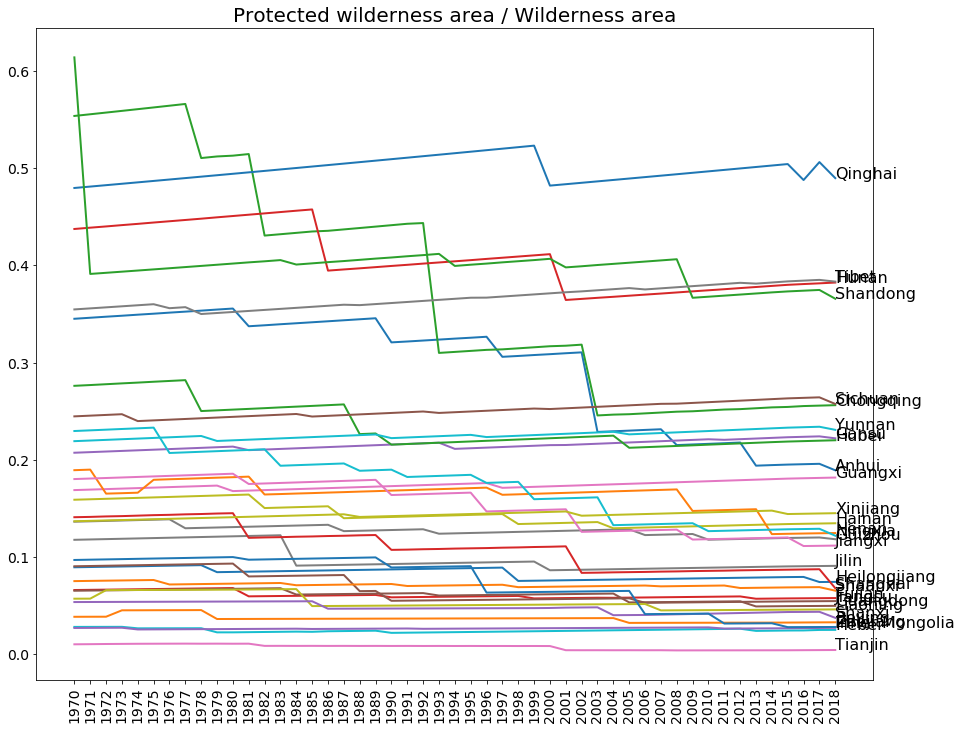

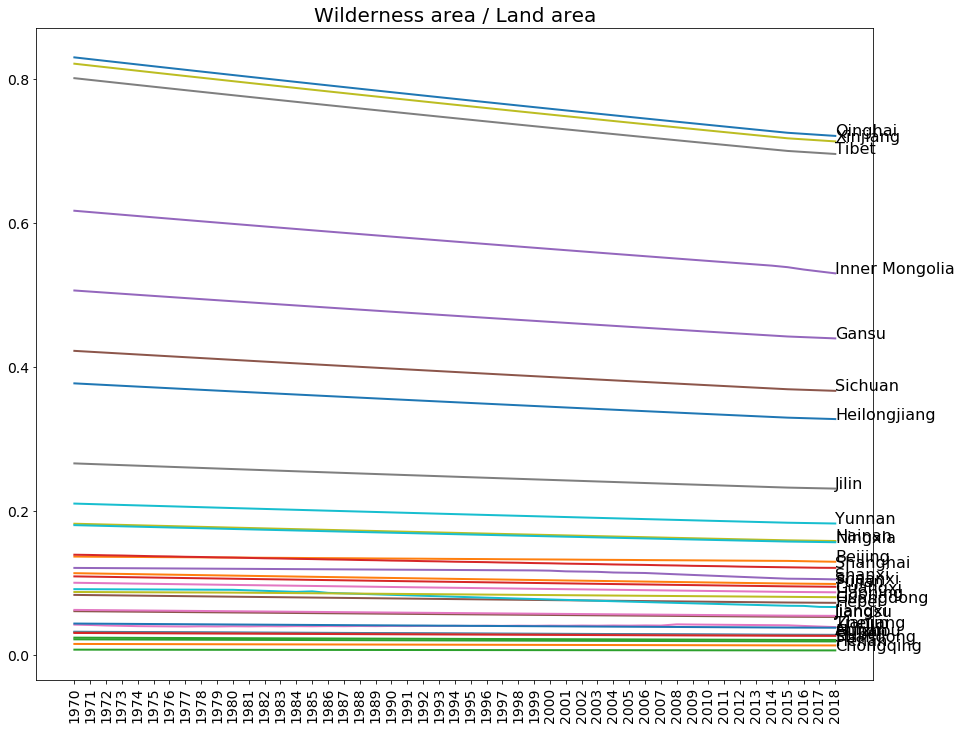

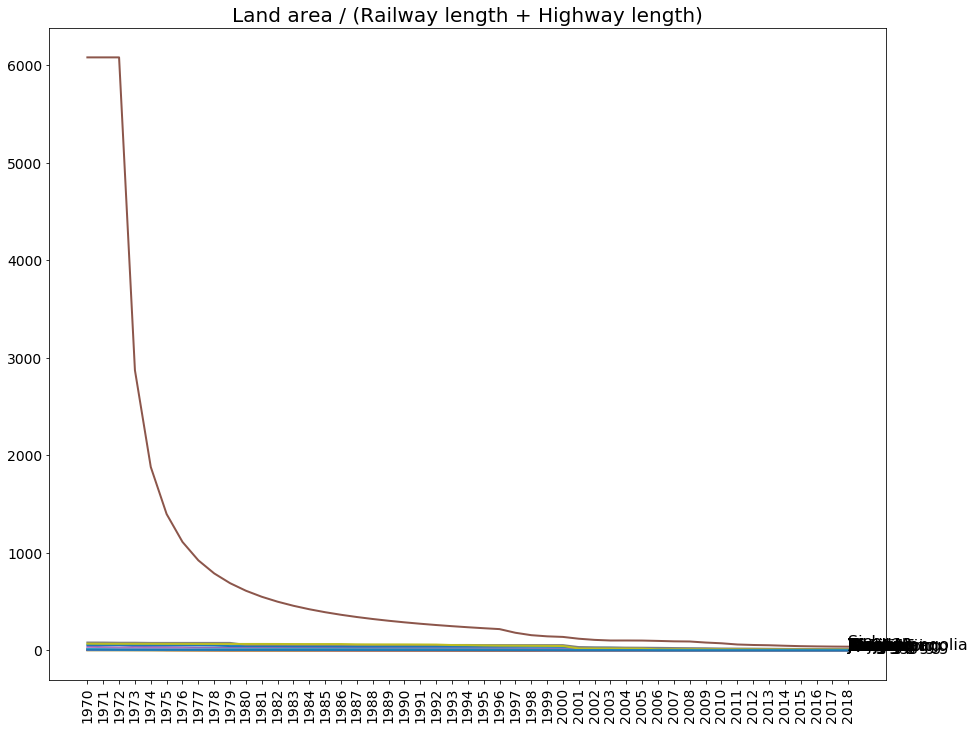

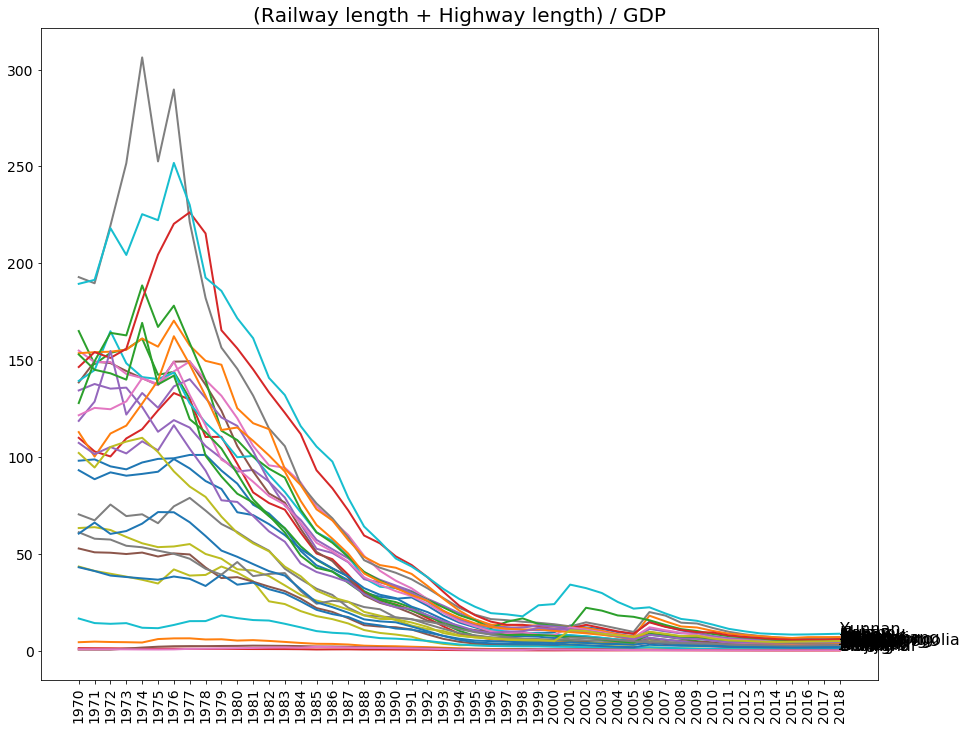

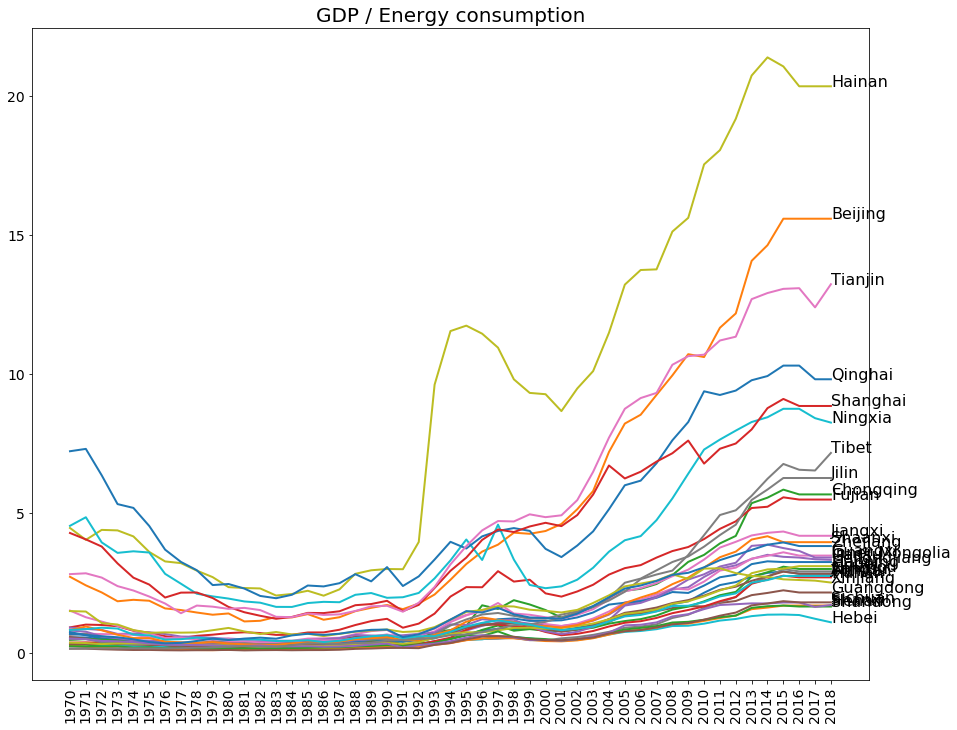

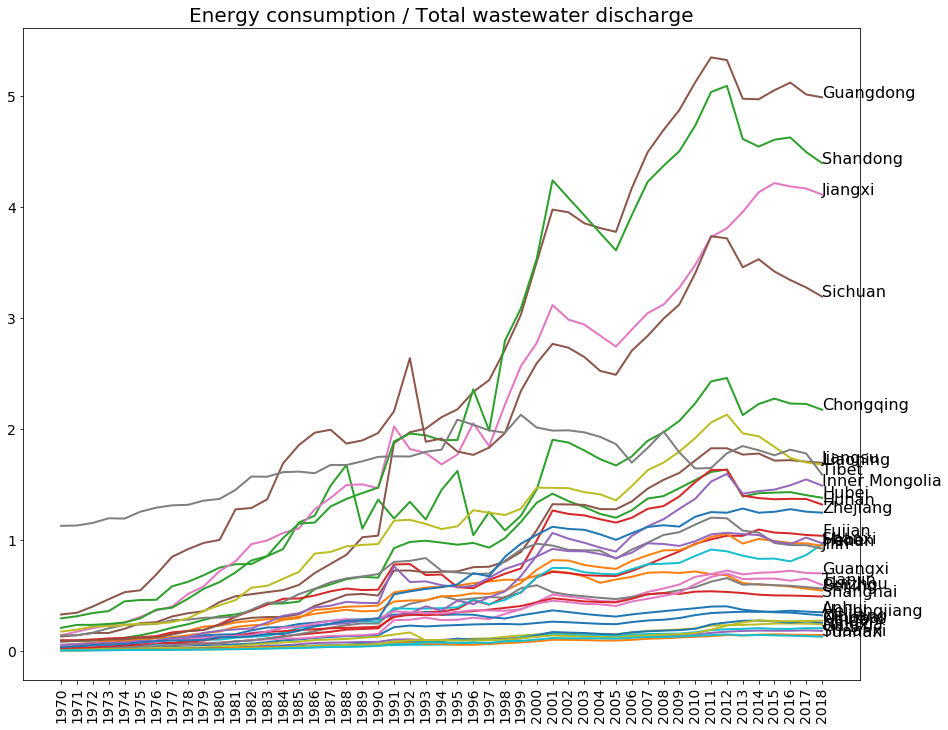

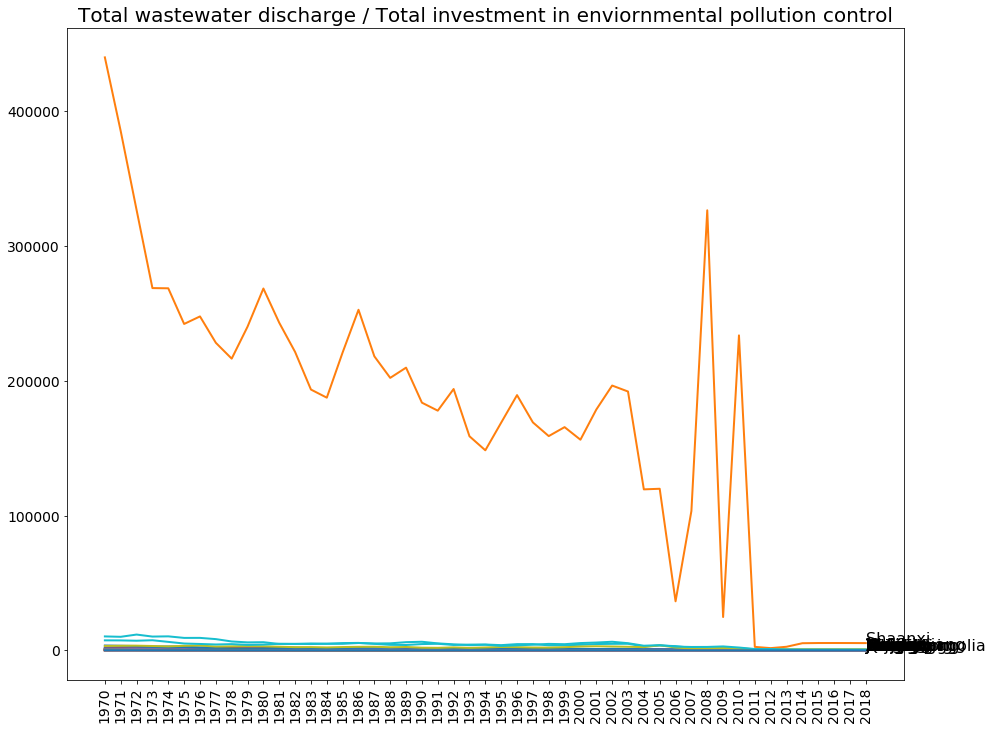

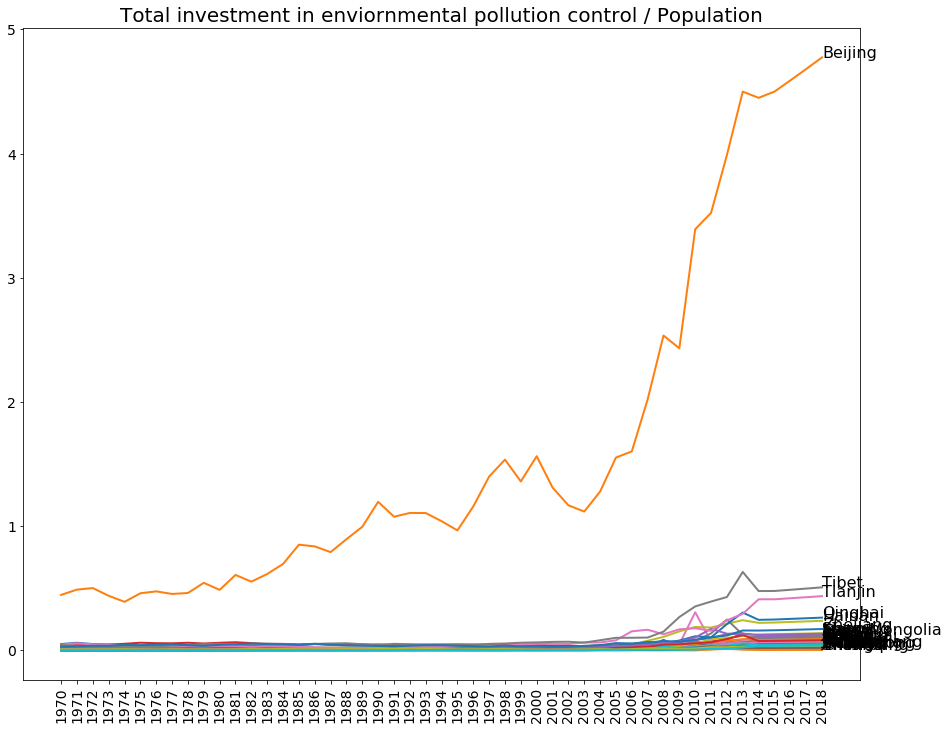

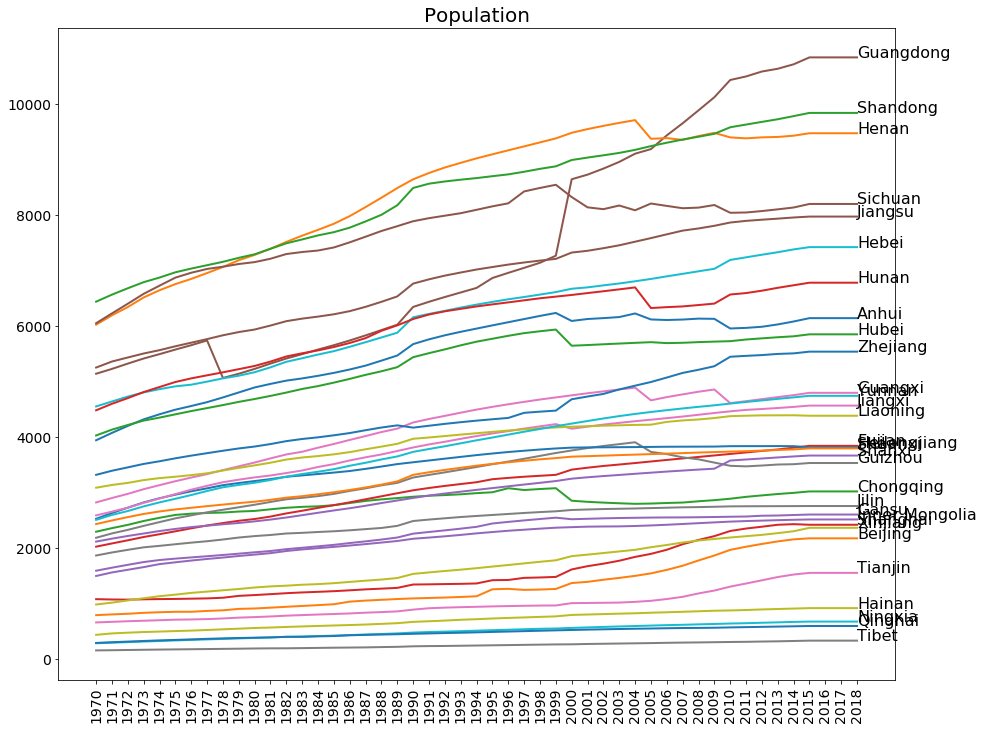

In [21]:
df_p1=df_p[df_p.Year<2019]
for num, el in enumerate(Cr1):
    plt.figure(figsize=(15,12))
    plt.title(Cr1f[num],fontsize=20)
    #plt.plot(range(1996,2017),mds_representation[:21].T[el],linewidth=5)
    #plt.plot(range(1996,2017),mds_representation[21:].T[el],linewidth=5)
    #plt.legend(['Russia', 'China'])
    for pr in Provinces:
        plt.plot(df_p1[df_p1.Province==pr].Year,df_p1[df_p1.Province==pr][el],linewidth=2)
        plt.text(2018,list(df_p1[df_p1.Province==pr][el])[-1],pr,fontsize=16)
    plt.xticks(range(1970,2019),range(1970,2019),rotation='vertical')
    plt.show()    

In [22]:
from matplotlib.cm import viridis

from matplotlib.cm import YlGn
from matplotlib.cm import summer
from matplotlib.colors import to_hex
import json
from matplotlib.patches import Circle
from matplotlib.patches import Polygon
from matplotlib.collections import PatchCollection

from PIL import Image
import requests 
import urllib 
import warnings
warnings.simplefilter("ignore")
import codecs

from six.moves.urllib.request import urlopen
import numpy as np
from googletrans import Translator
translator = Translator()
reader = codecs.getreader("utf-8")
f = urlopen('https://raw.githubusercontent.com/longwosion/geojson-map-china/master/china.json')
geometry = json.load(reader(f))
f.close()
names1=[]
for feature in geometry['features']:
    country_name = feature['properties']['name']
    ccn=translator.translate(country_name,dest='en').text
    names1.append(ccn)
noms=[28, 27, 14, 20, 25, 10, 4, 29, 6, 13, 24, 5, 17, 9, 12, 7, 22, 16, 11, 18, 21, 0, 3, 30, 15, 2, 19, 8, -1, 1, 26, 23, -1, -1]

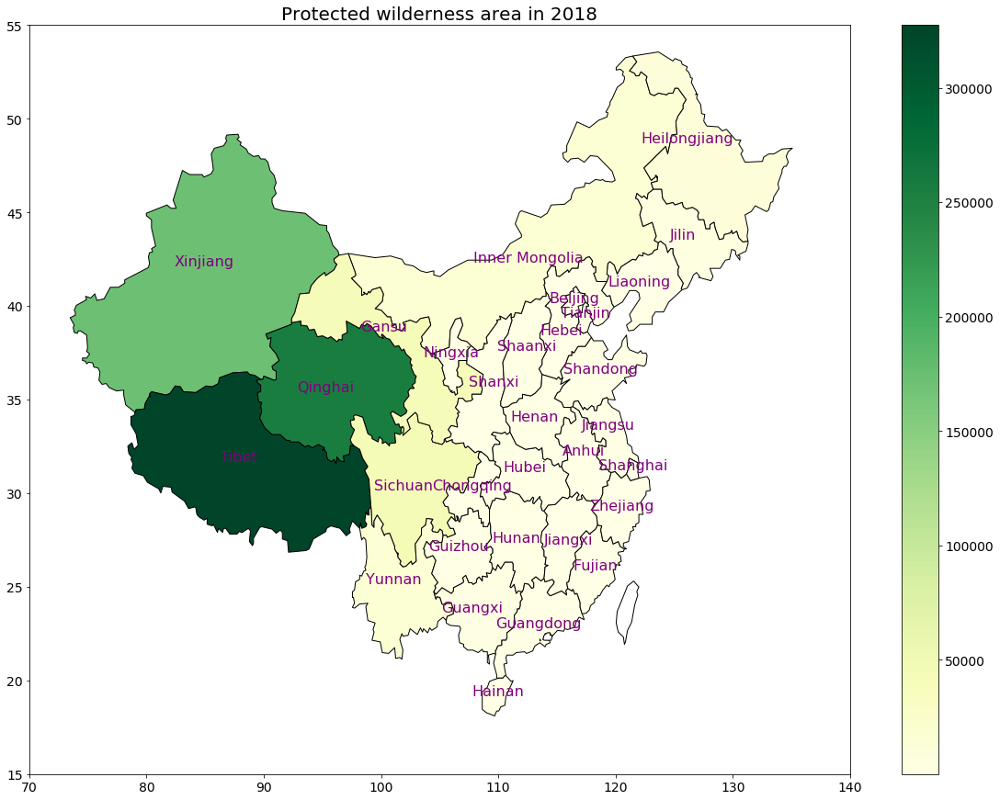

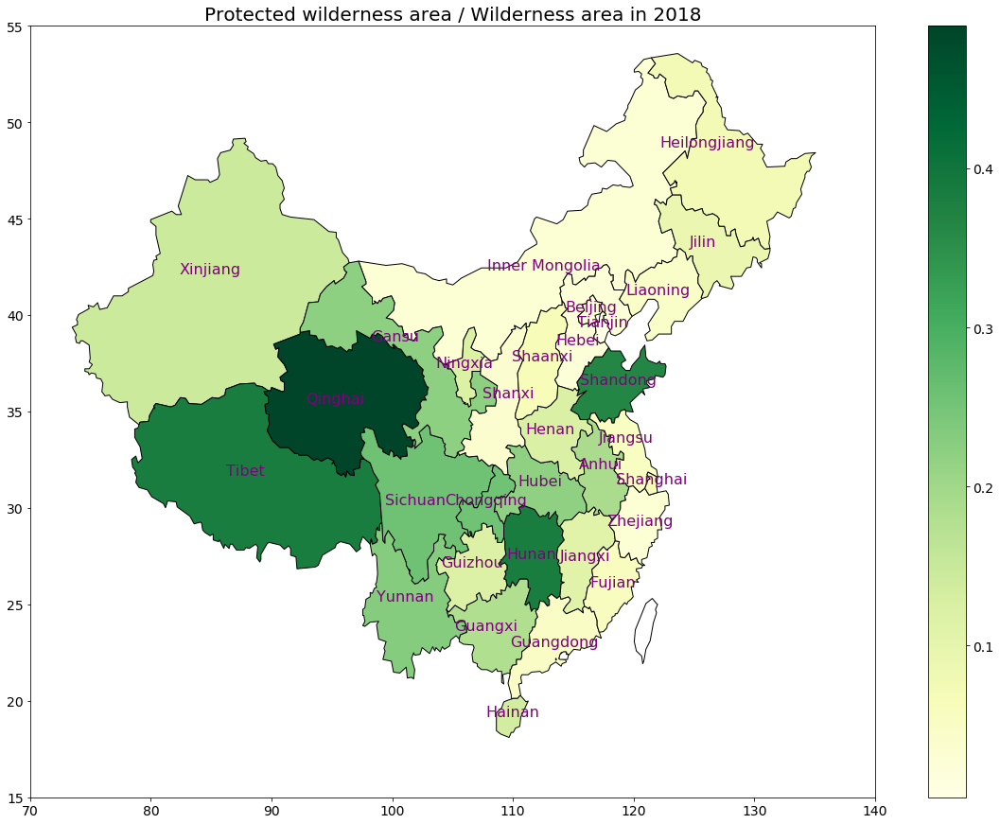

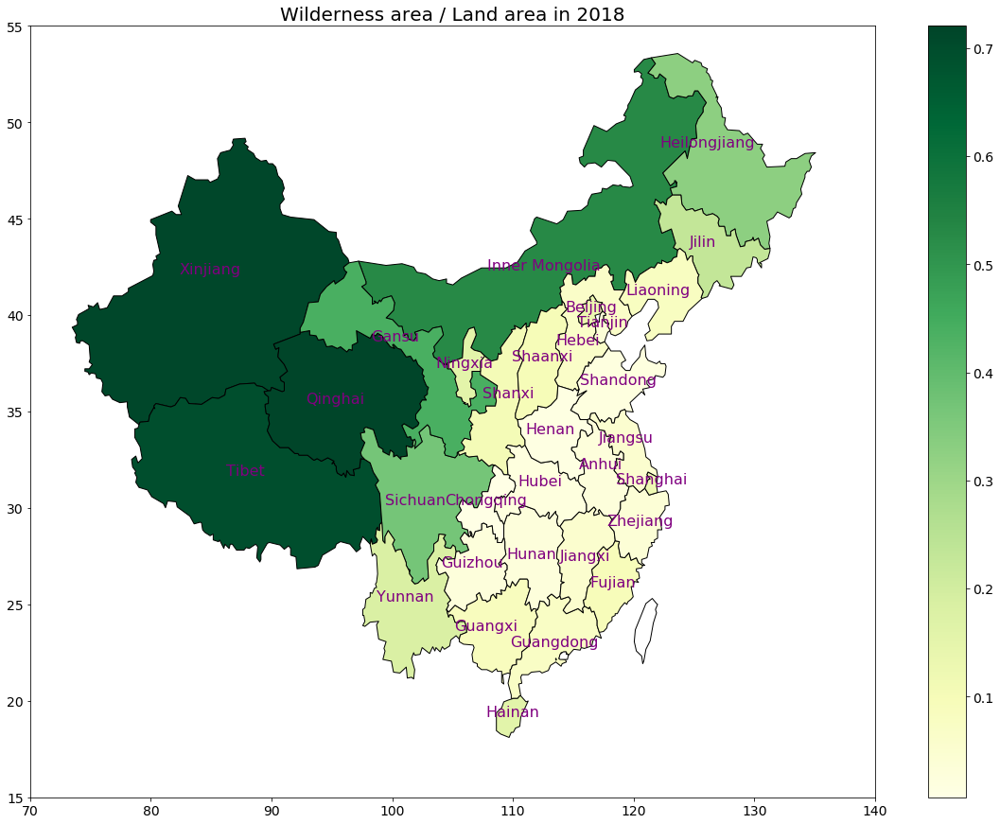

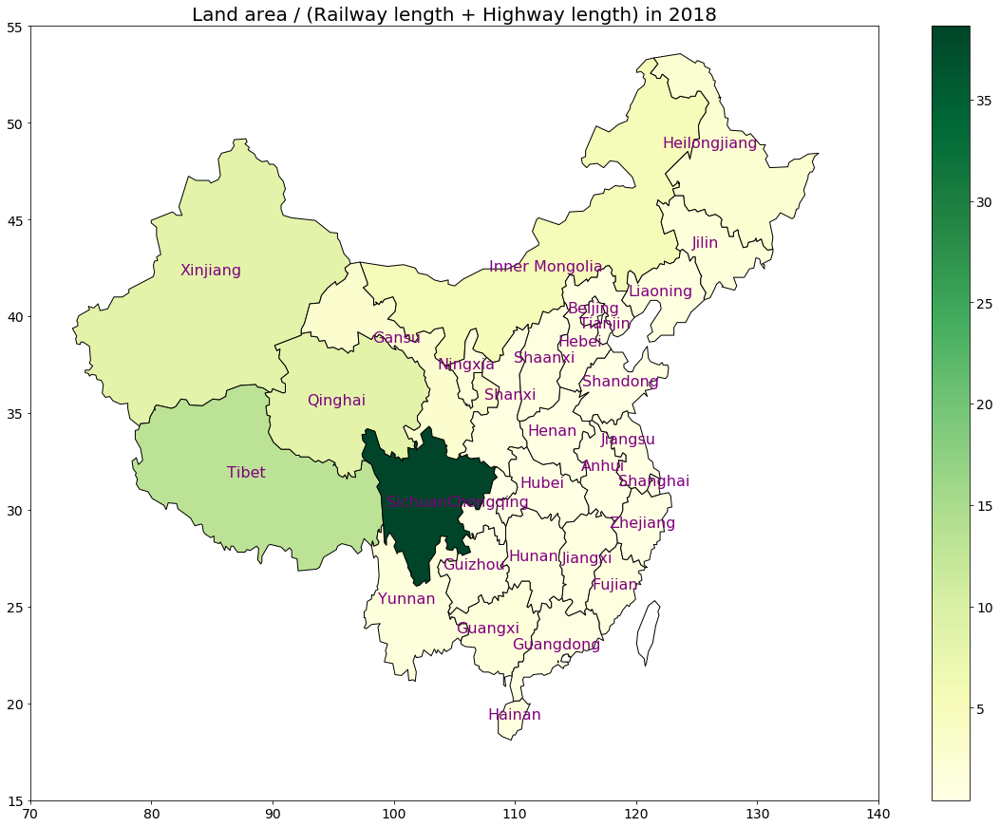

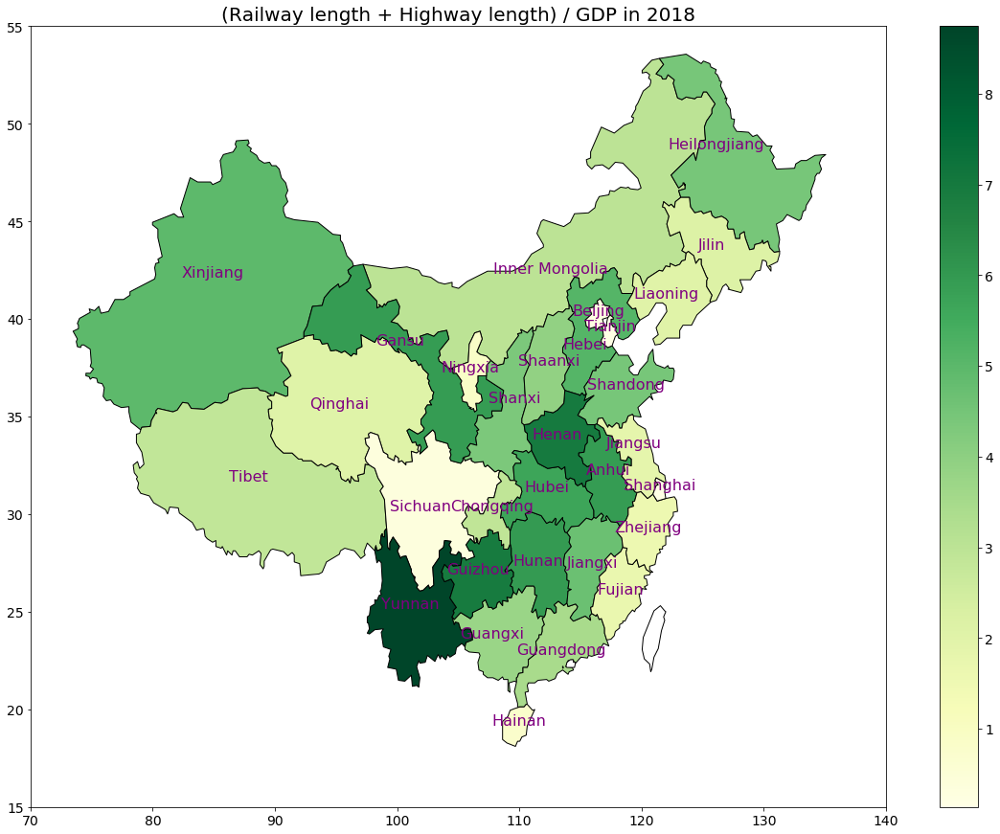

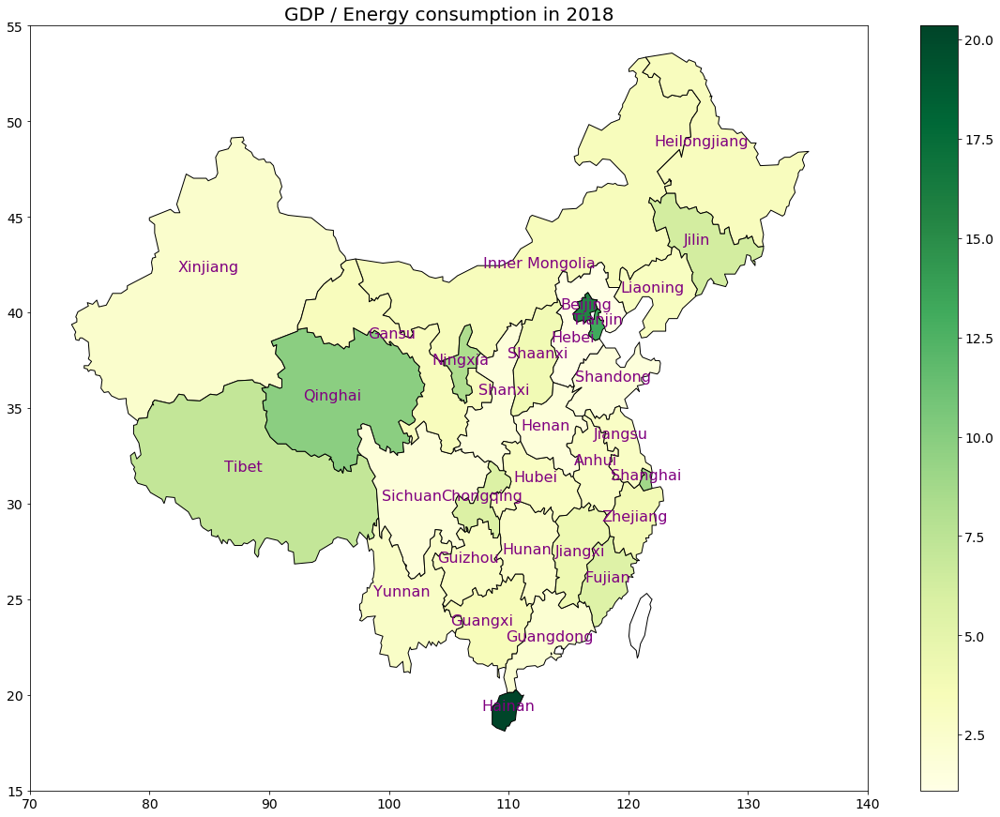

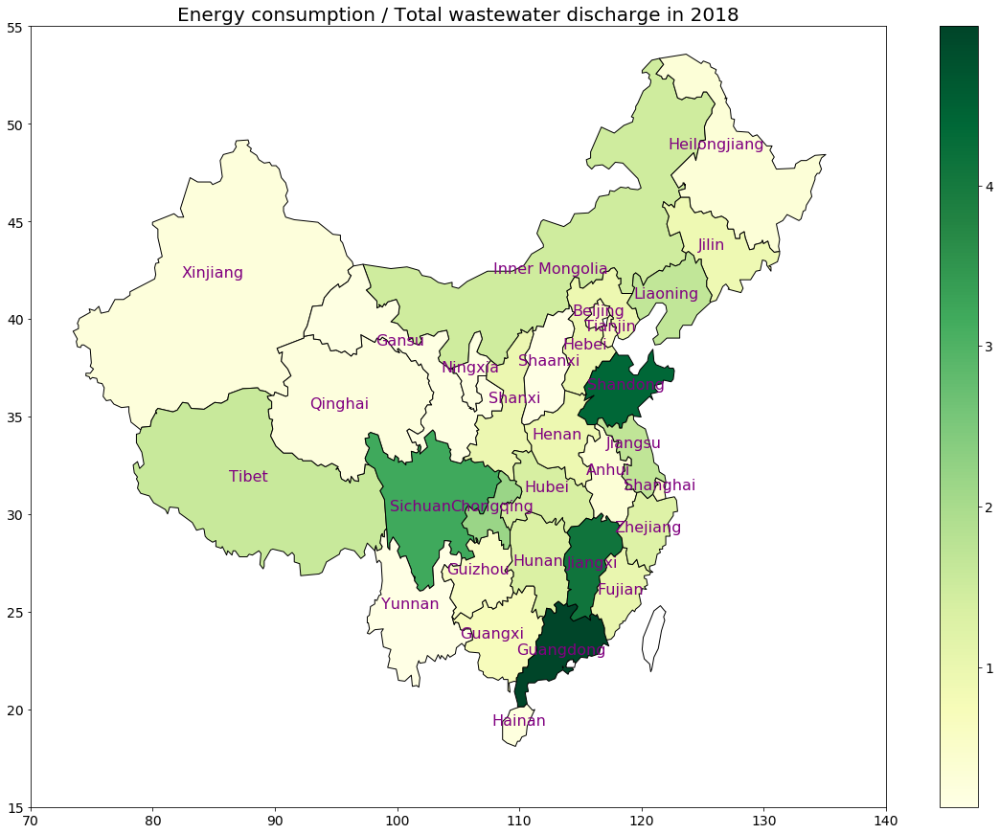

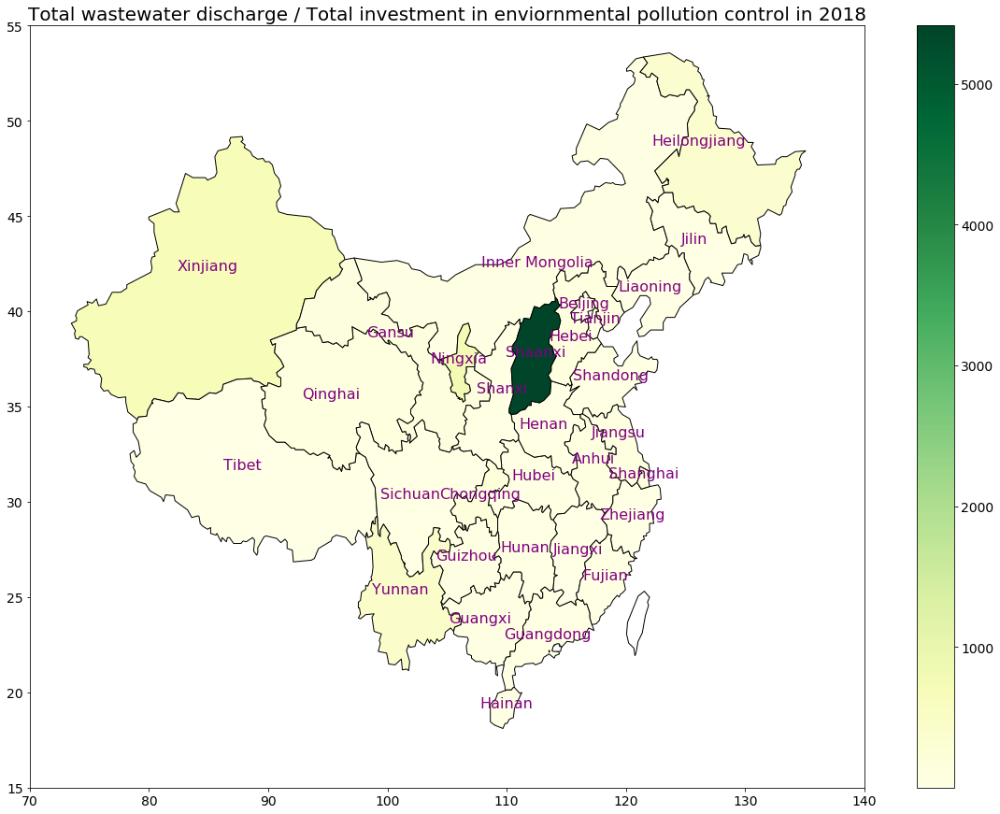

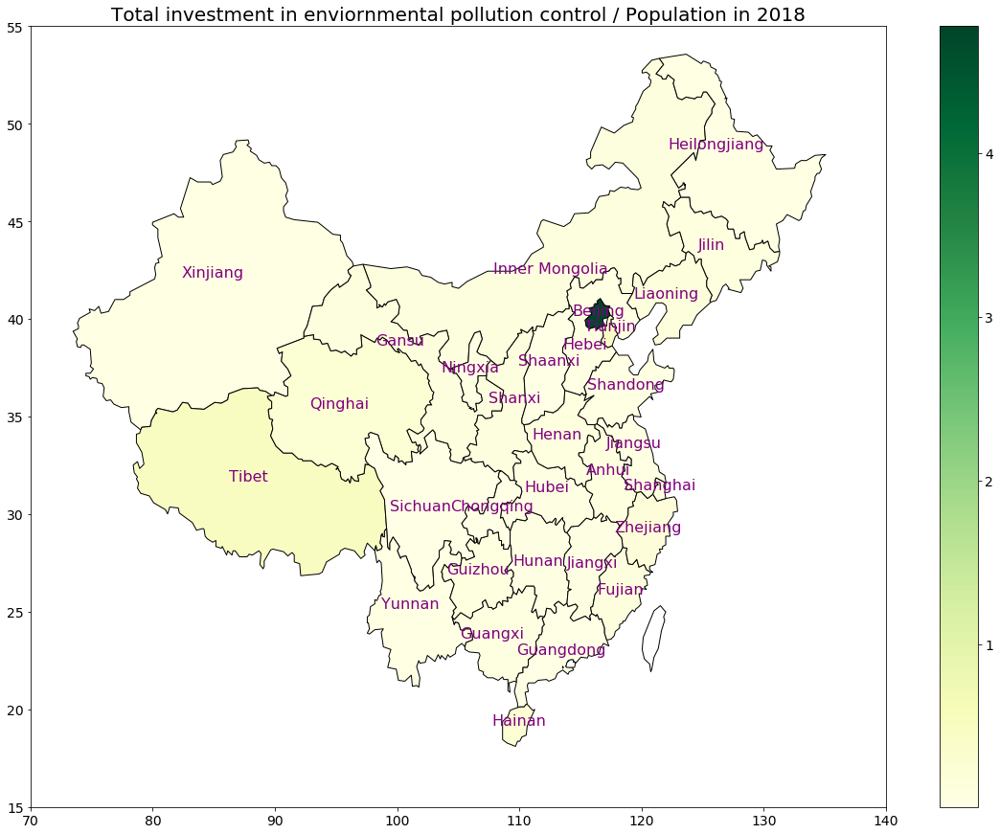

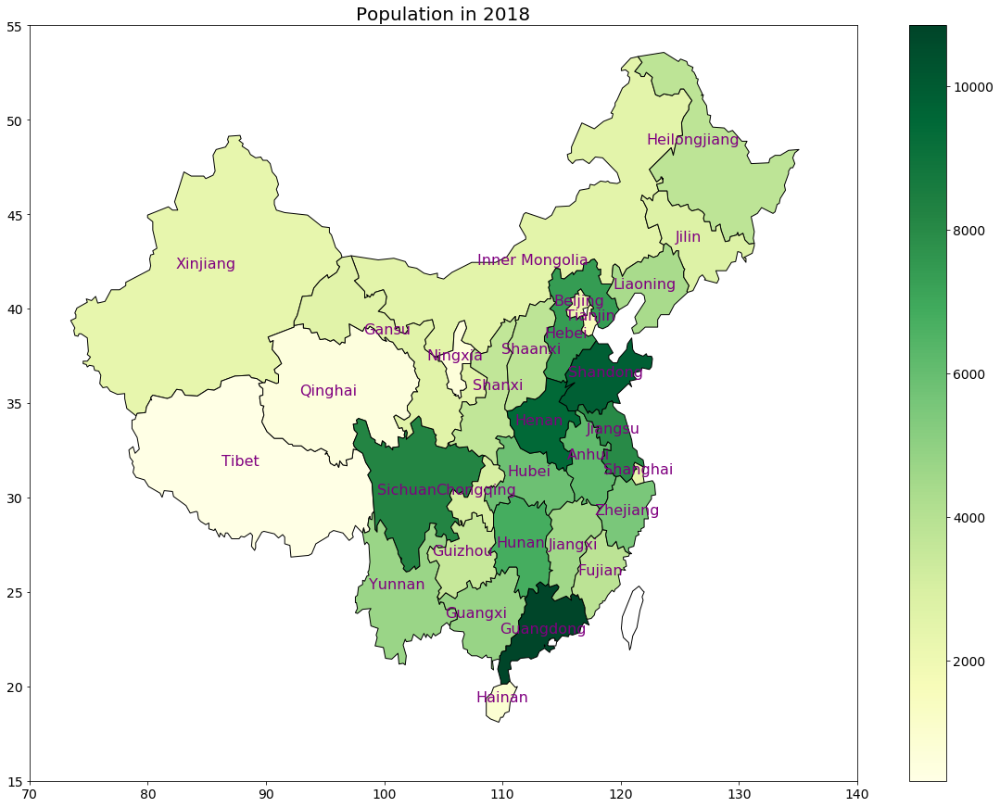

In [23]:
for num,el in enumerate(Cr1):
    fig, ax = plt.subplots(figsize=(20,15))
    plt.title(Cr1f[num] + ' in 2018',fontsize=20)
    ax.set_xlim(70,140)
    ax.set_ylim(15,55)
    #plt.imshow(image) 
    koef1=(454-7)/(116.1172663-77.0688977)
    koef2=(415-248)/(28.5275198-39.9390731)


    patches=[]
    locs=[]
    names=[]
    colors=[]
    ii=-1
    for num, feature in enumerate(geometry['features']):
        ccn1=noms[num]
        if ccn1>-1:
            ccn=Provinces[ccn1]
            ii+=1
            names.append(ccn)
            rrr=list(df_p1[df_p1.Province==ccn][el])[-1]
            colors.append(rrr)
            cc=np.array(feature['properties']['cp'])
            locs.append(cc)
            pole=np.array(feature['geometry']['coordinates'][0]).T
            if len(pole.shape)!=2:
                pole=np.array([pole[0].T[0],pole[1].T[0]])
            patches.append(Polygon(pole.T, facecolor='0.9', edgecolor='0.5',linewidth=2))
    p = PatchCollection(patches, cmap=YlGn, edgecolor="#000000", alpha=1) #color="#25CDCD", 
    p.set_array(np.array(colors))
    ax.add_collection(p)
    plt.colorbar(p)
    ppatches=[]
    for num, feature in enumerate(geometry['features']):
        ccn1=noms[num]
        if ccn1==-1:
            ccn=Provinces[ccn1]
            pole=np.array(feature['geometry']['coordinates'][0]).T
            if len(pole.shape)!=2:
                pole=np.array([pole[0].T[0],pole[1].T[0]])
            ppatches.append(Polygon(pole.T, facecolor='0.9', edgecolor='0.5',linewidth=2))
    pp = PatchCollection(ppatches, color="#FFFFFF",edgecolor="#000000", alpha=1) #color="#25CDCD", 
    ax.add_collection(pp)

    for nam, loc in zip(names, locs):
        l1=(loc[0]-locs[0][0])*koef1+0.155
        l2=(loc[1]-locs[0][1])*koef2+0.49
        ll1=loc[0]
        ll2=loc[1]
        if nam=='Inner Mongolia':
            l2-=0.07
            ll2-=4
        if nam=='Beijing':
            l2+=0.003
            ll2+=0.003*koef2
        if nam=='Hebei':
            l2-=0.05
            ll2-=1
        if nam=='Gansu':
            l2+=0.01
            l1+=0.01
            ll1+=0.5
            ll2+=0.5
        if nam=='Jiangsu':
            l2+=0.012
            l1+=0.007
            ll1+=0.5
            ll2+=0.5
        plt.text(ll1,ll2,nam,horizontalalignment='center',fontsize=16,color='purple')


    plt.show() 

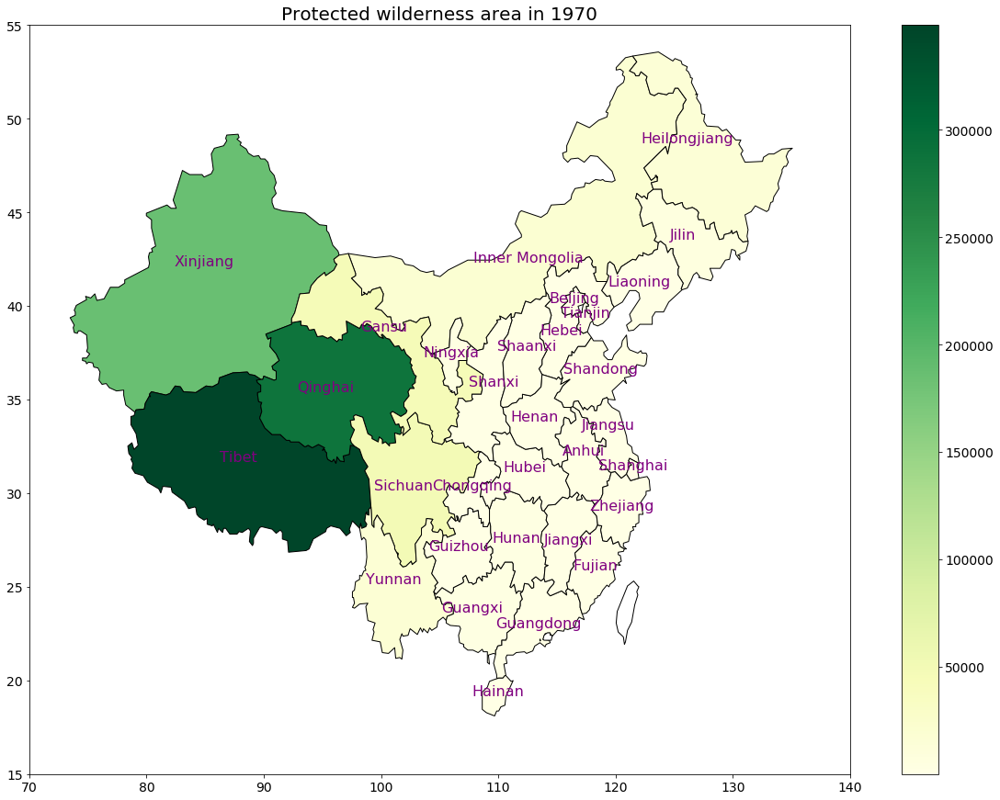

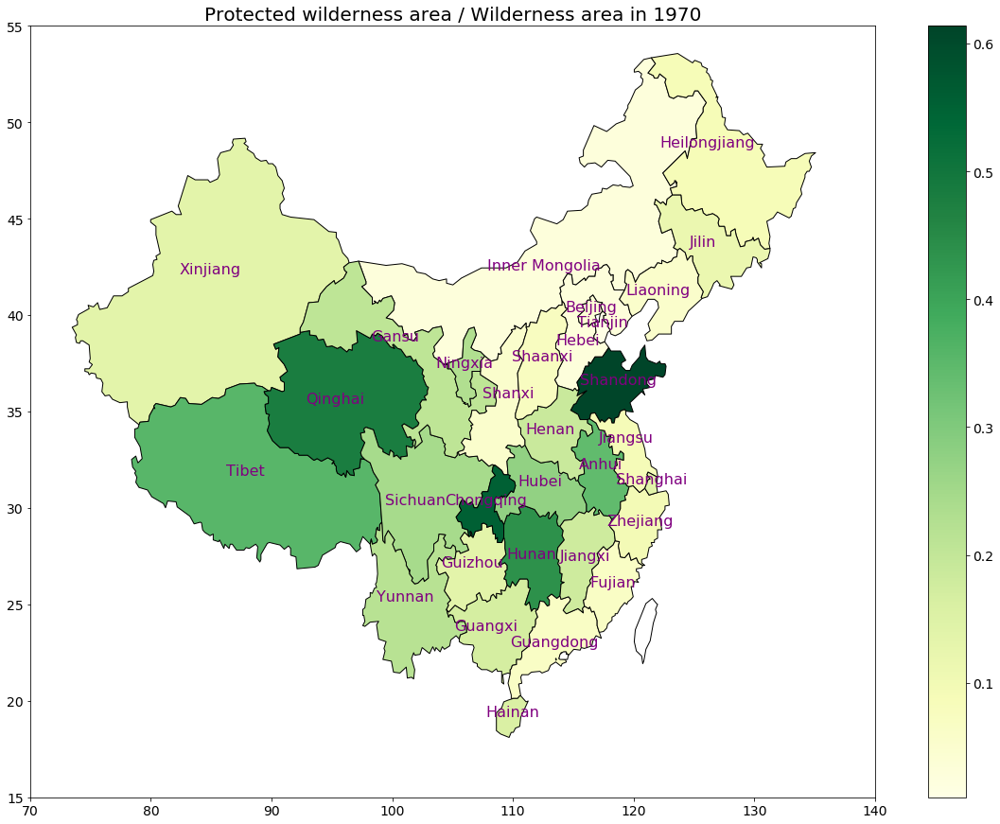

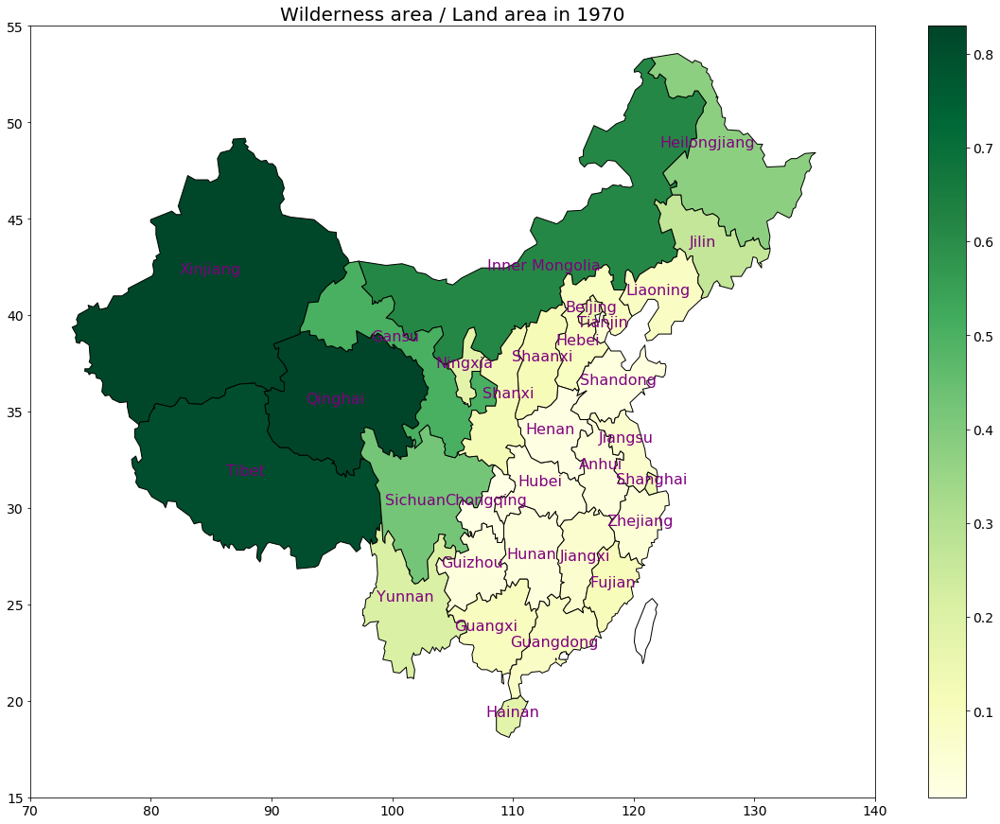

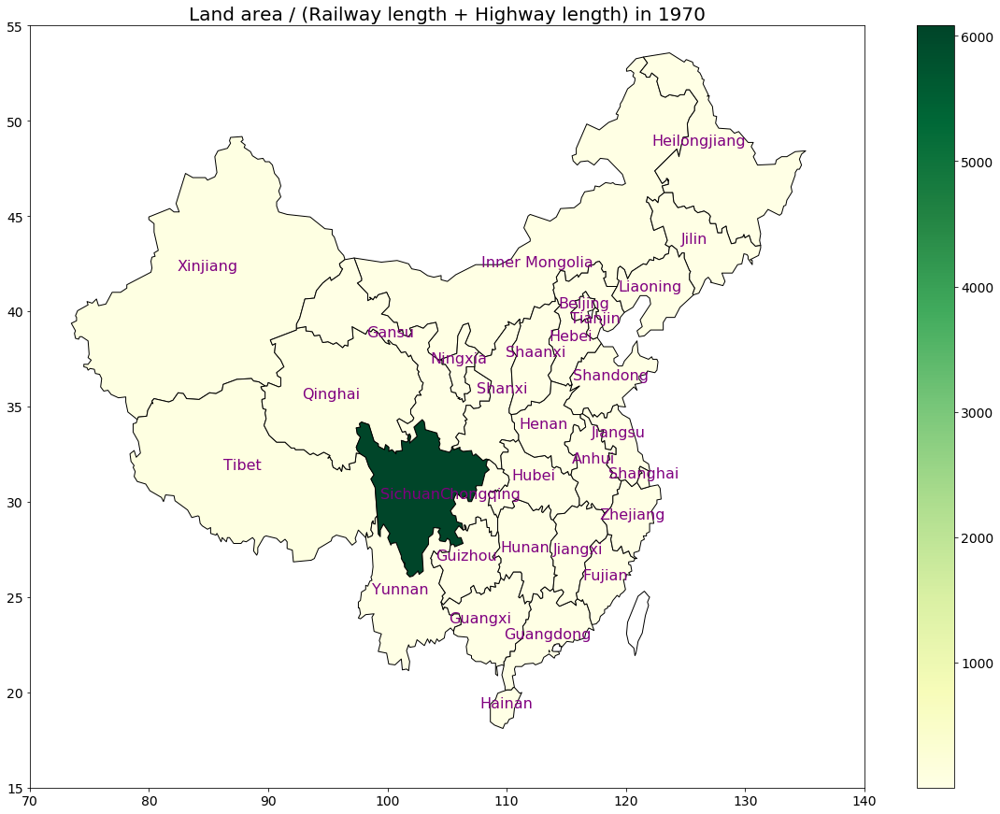

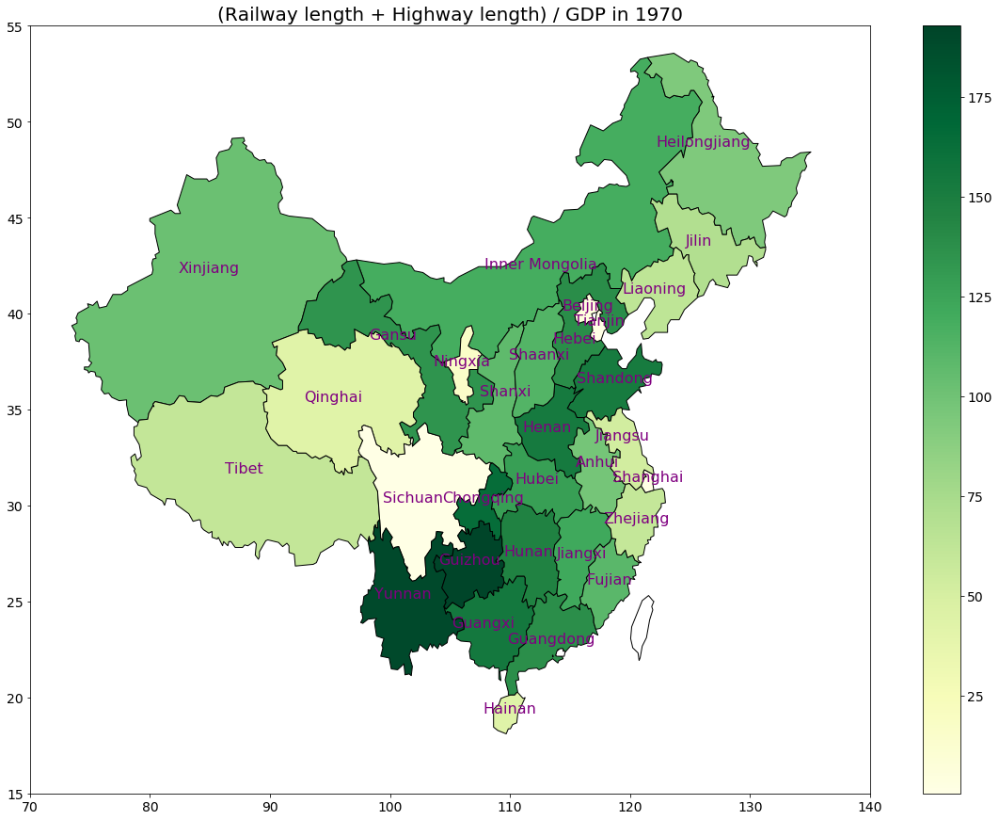

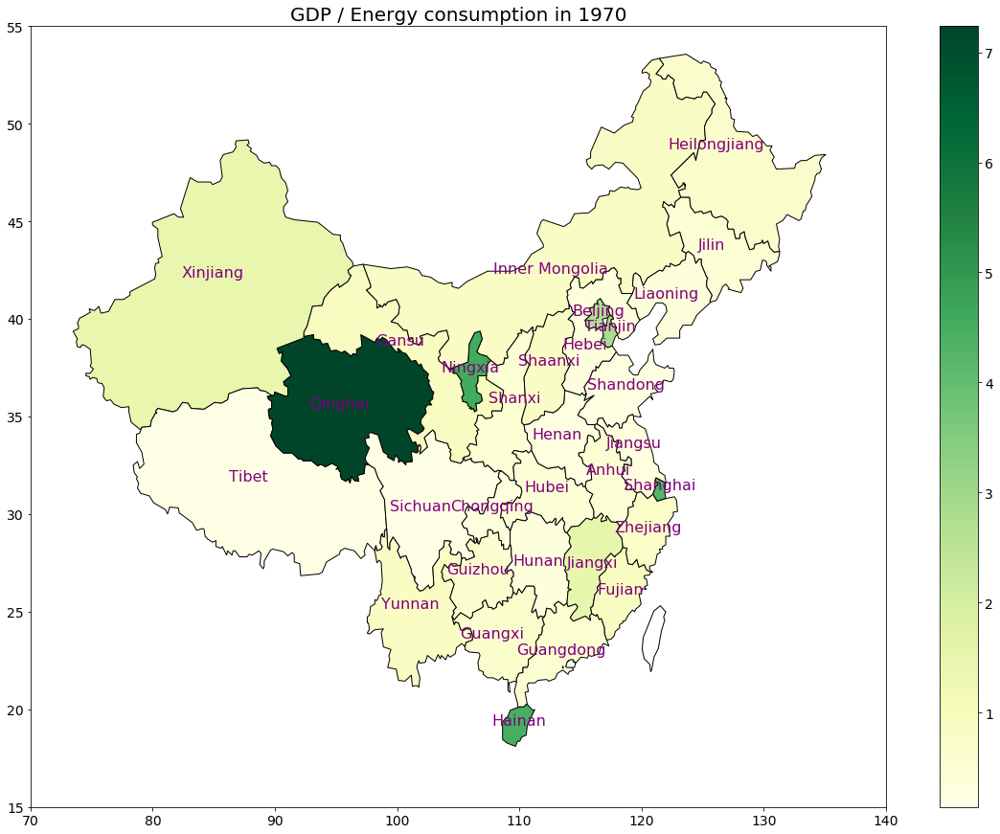

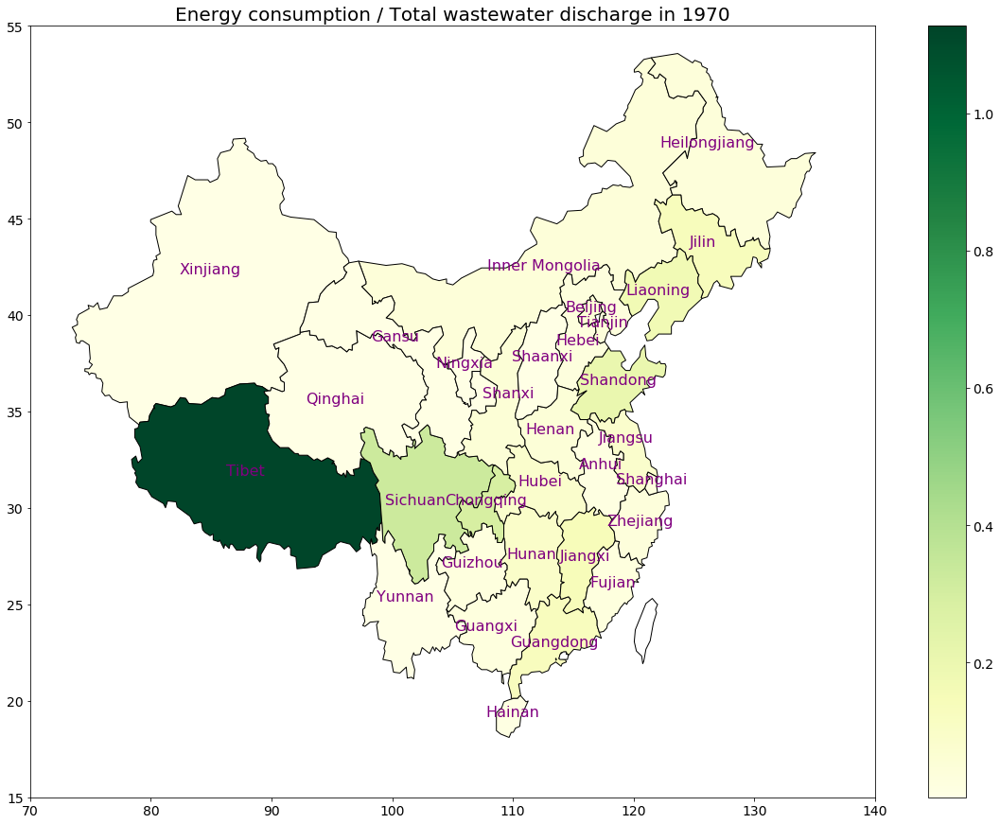

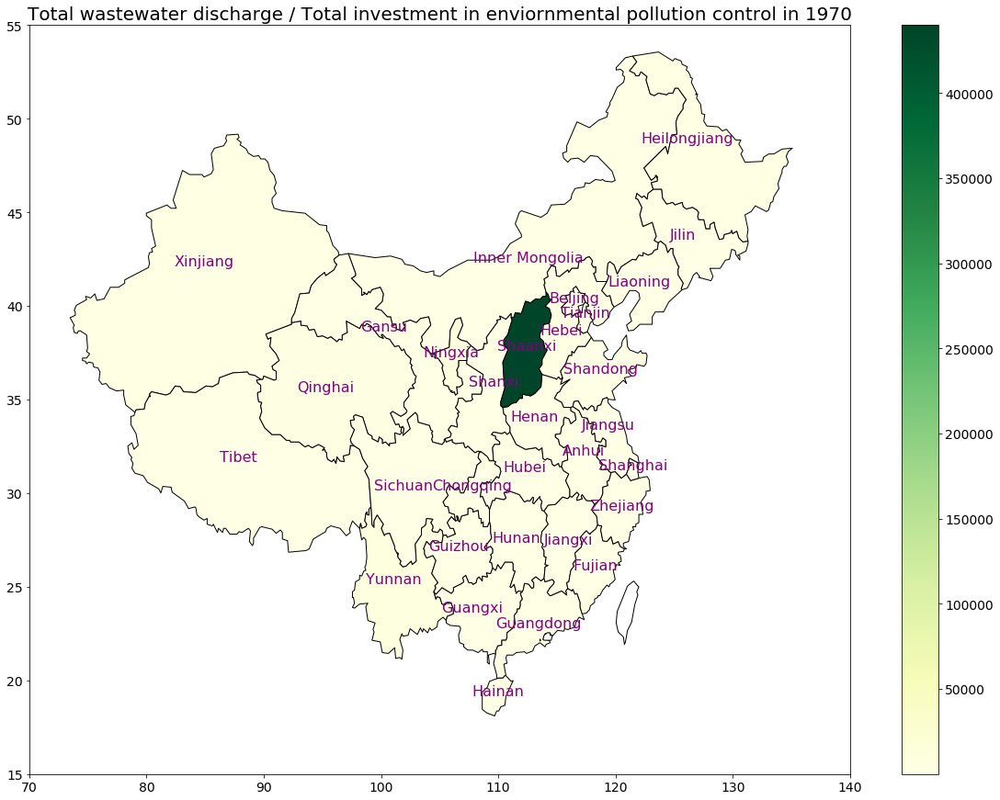

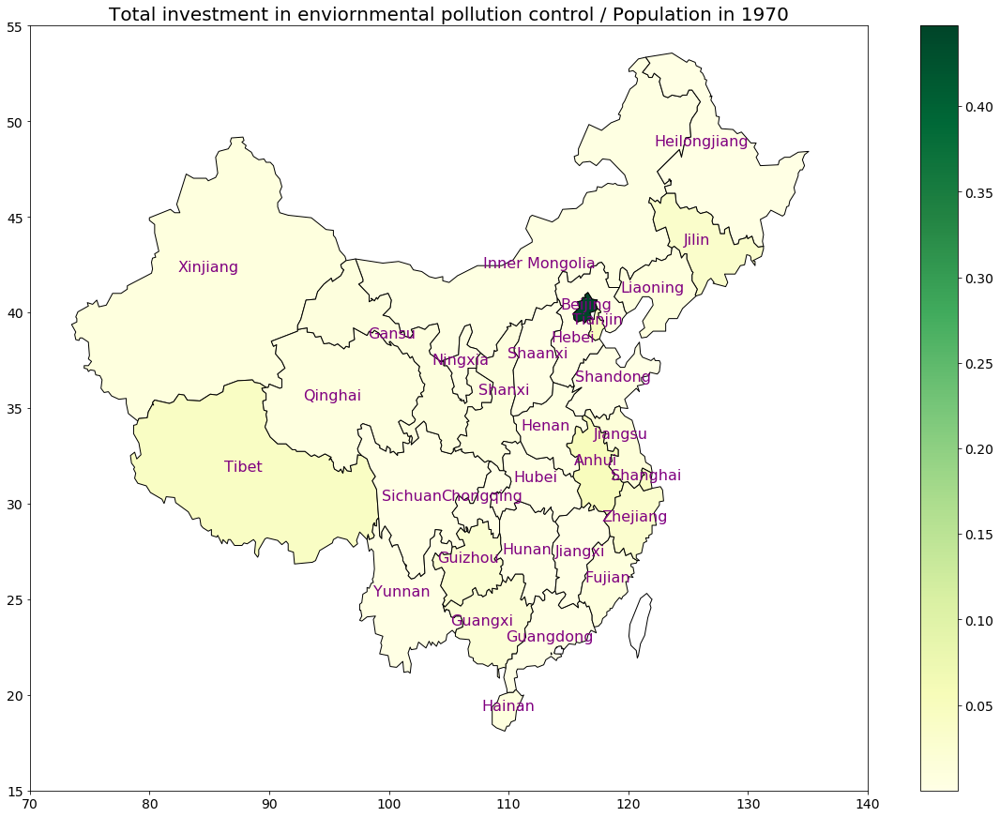

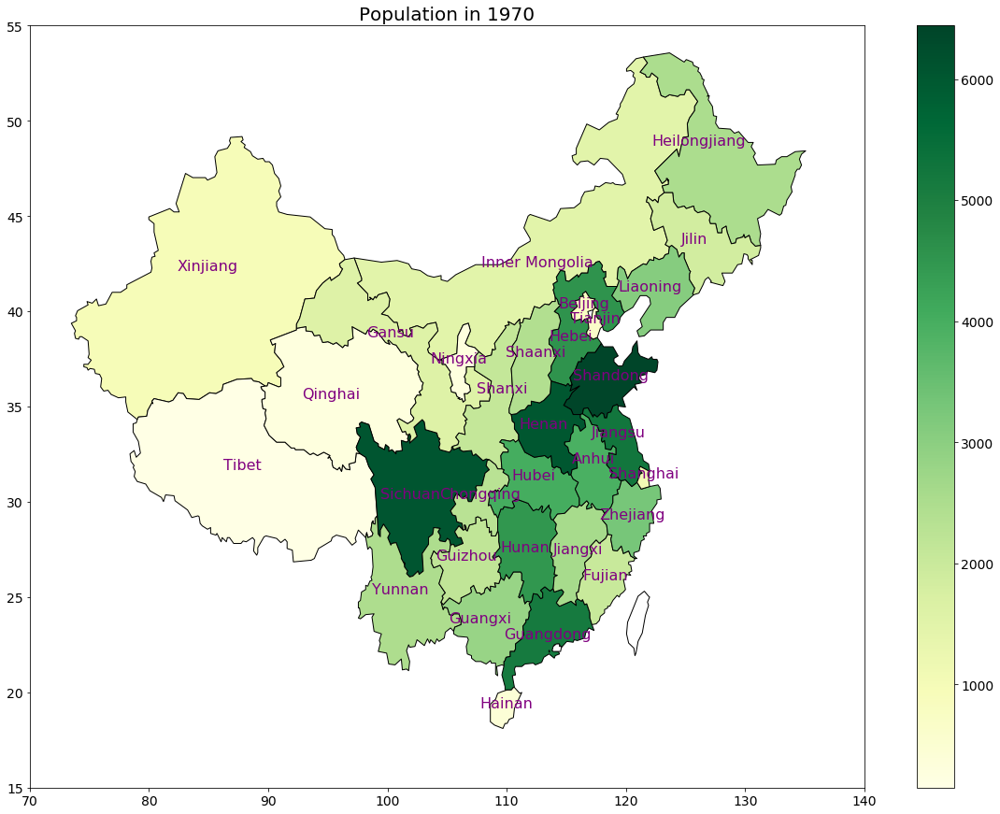

In [24]:
for num,el in enumerate(Cr1):
    fig, ax = plt.subplots(figsize=(20,15))
    plt.title(Cr1f[num] + ' in 1970',fontsize=20)
    ax.set_xlim(70,140)
    ax.set_ylim(15,55)
    #plt.imshow(image) 
    koef1=(454-7)/(116.1172663-77.0688977)
    koef2=(415-248)/(28.5275198-39.9390731)


    patches=[]
    locs=[]
    names=[]
    colors=[]
    ii=-1
    for num, feature in enumerate(geometry['features']):
        ccn1=noms[num]
        if ccn1>-1:
            ccn=Provinces[ccn1]
            ii+=1
            names.append(ccn)
            rrr=list(df_p1[df_p1.Province==ccn][el])[0]
            colors.append(rrr)
            cc=np.array(feature['properties']['cp'])
            locs.append(cc)
            pole=np.array(feature['geometry']['coordinates'][0]).T
            if len(pole.shape)!=2:
                pole=np.array([pole[0].T[0],pole[1].T[0]])
            patches.append(Polygon(pole.T, facecolor='0.9', edgecolor='0.5',linewidth=2))
    p = PatchCollection(patches, cmap=YlGn, edgecolor="#000000", alpha=1) #color="#25CDCD", 
    p.set_array(np.array(colors))
    ax.add_collection(p)
    plt.colorbar(p)
    ppatches=[]
    for num, feature in enumerate(geometry['features']):
        ccn1=noms[num]
        if ccn1==-1:
            ccn=Provinces[ccn1]
            pole=np.array(feature['geometry']['coordinates'][0]).T
            if len(pole.shape)!=2:
                pole=np.array([pole[0].T[0],pole[1].T[0]])
            ppatches.append(Polygon(pole.T, facecolor='0.9', edgecolor='0.5',linewidth=2))
    pp = PatchCollection(ppatches, color="#FFFFFF",edgecolor="#000000", alpha=1) #color="#25CDCD", 
    ax.add_collection(pp)

    for nam, loc in zip(names, locs):
        l1=(loc[0]-locs[0][0])*koef1+0.155
        l2=(loc[1]-locs[0][1])*koef2+0.49
        ll1=loc[0]
        ll2=loc[1]
        if nam=='Inner Mongolia':
            l2-=0.07
            ll2-=4
        if nam=='Beijing':
            l2+=0.003
            ll2+=0.003*koef2
        if nam=='Hebei':
            l2-=0.05
            ll2-=1
        if nam=='Gansu':
            l2+=0.01
            l1+=0.01
            ll1+=0.5
            ll2+=0.5
        if nam=='Jiangsu':
            l2+=0.012
            l1+=0.007
            ll1+=0.5
            ll2+=0.5
        plt.text(ll1,ll2,nam,horizontalalignment='center',fontsize=16,color='purple')


    plt.show() 

In [25]:
from sklearn.manifold import MDS
from sklearn.manifold import TSNE
from sklearn.decomposition import TruncatedSVD
from sklearn.decomposition import PCA
from sklearn import mixture
from sklearn.preprocessing import MinMaxScaler as MMS


In [26]:
ttt=df_p[Cr1]
M_norm=MMS().fit(ttt)
df_norm=pd.DataFrame(M_norm.transform(ttt),columns=Cr1)[df_p.Year<2019]
df_norm.head()

,PWA,PWA/WA,WA/LA,LA/(RL+HL),(RL+HL)/GDP,GDP/EC,EC/WW,WW/TIEPC,TIEPC/P,P
0,0.004507,0.559210,0.031627,0.001196,0.319863,0.022113,0.002838,0.000196,0.007788,0.038338
1,0.004507,0.560952,0.031505,0.001104,0.322097,0.021806,0.003137,0.000158,0.009339,0.039683
2,0.004507,0.562706,0.031383,0.001102,0.310331,0.018917,0.003765,0.000185,0.007817,0.040957
3,0.004507,0.564343,0.031270,0.001073,0.305321,0.015209,0.004862,0.000204,0.006926,0.042150
4,0.004507,0.566118,0.031148,0.001067,0.316866,0.013963,0.005019,0.000212,0.006575,0.043080


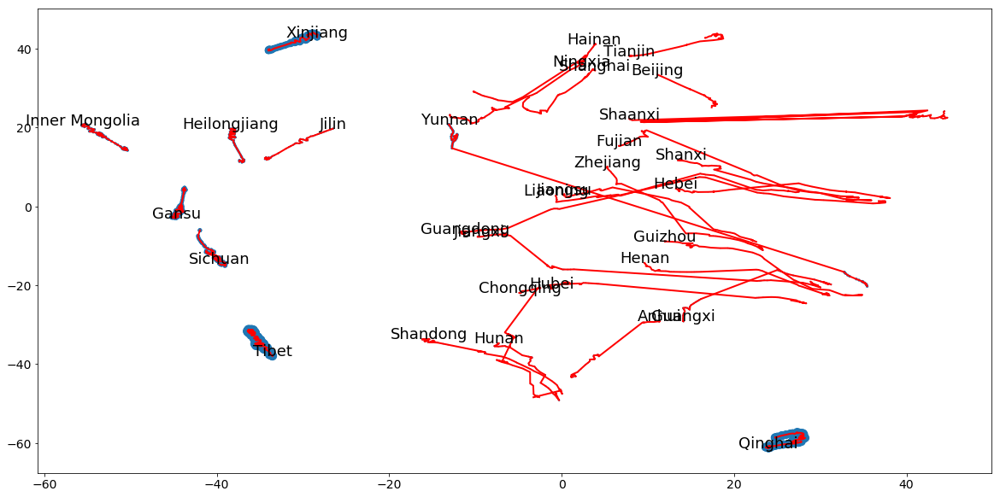

In [27]:
mdl=TSNE()
#mds_representation=mdl.fit_transform(np.vstack((X,kl2)))
mds_representation=mdl.fit_transform(df_norm[df_norm.columns[1:]])
plt.figure(figsize=(20,10))
xx=mds_representation.T[0]
yy=mds_representation.T[1]
for num,el in enumerate(Provinces):
    plt.plot(xx[df_p1.Province==el],yy[df_p1.Province==el],linewidth=2,color='red')
cc=np.array(df_p1[df_p1.Year==2018].Province)
cc1=mds_representation[df_p1.Year==2018]
plt.scatter(xx,yy,df_norm[df_norm.columns[0]]*100)
for num,el in enumerate(cc):
    plt.text(cc1[num][0],cc1[num][1]+0.05,el,fontsize=18,horizontalalignment='center')
plt.show()

In [28]:
mdl=TruncatedSVD(n_components=6)
mds_representation=mdl.fit_transform(df_norm[df_norm.columns[1:]])

In [29]:
for el in range(6):
    print('1-{}: {}'.format(el+1,np.sum(mdl.explained_variance_ratio_[:el+1])))

1-1: 0.32777686232953934
1-2: 0.5820320332372875
1-3: 0.7660514290624852
1-4: 0.8649628525926478
1-5: 0.9443644208622409
1-6: 0.9749744832243358


In [30]:
qqq1=pd.DataFrame(mdl.components_.T,columns=range(1,7),index=df_norm.columns[1:])
qqq1

,1,2,3,4,5,6
PWA/WA,0.648626,0.506946,-0.187239,0.343734,-0.406296,0.037251
WA/LA,0.663000,-0.725034,0.051394,-0.175843,-0.019821,-0.009151
LA/(RL+HL),0.014633,-0.011236,0.003877,-0.008797,-0.035328,0.008868
(RL+HL)/GDP,0.206144,0.219079,-0.647432,-0.381764,0.568404,-0.128007
GDP/EC,0.164741,-0.007912,0.262397,0.648581,0.659313,-0.028756
EC/WW,0.257215,0.400941,0.683103,-0.513748,0.169738,-0.009462
WW/TIEPC,0.015156,0.004186,-0.060457,-0.043689,0.116060,0.989485
TIEPC/P,0.017780,-0.007498,0.054383,0.119379,0.174957,-0.041277
P,0.056218,0.091213,0.031995,-0.065965,0.051136,0.019061


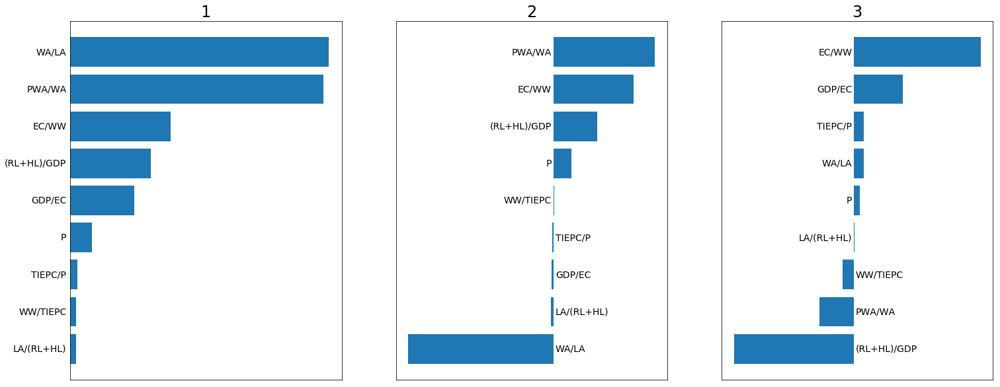

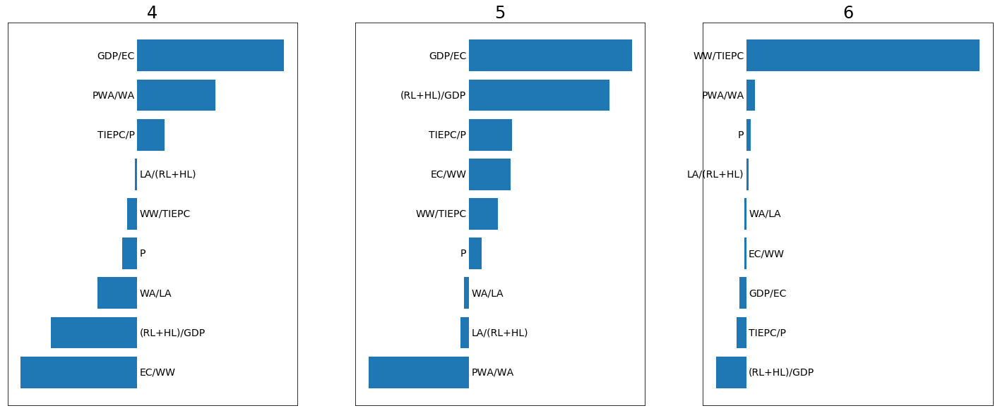

In [31]:
fig,axes=plt.subplots(1,3,figsize=(25,10))
plt.rcParams['font.size'] = 20
plt.rcParams['lines.linewidth'] = 5

for el in range(3):
    tt=sorted(list(zip(qqq1.index,qqq1[el+1])),key=lambda x: x[1])
    qqq2=np.double(np.array(tt).T[1])
    qqq3=np.array(tt).T[0]
    axes[el].barh(range(len(tt)),qqq2,left=-0.5)
    axes[el].set_xticks([],[])
    axes[el].set_yticks([],[])
    axes[el].set_title(el+1)
    for xx in range(len(tt)):
        if qqq2[xx]<0:
            axes[el].text(-0.49,xx,qqq3[xx],horizontalalignment='left',verticalalignment='center',fontsize=14)
        else:
            axes[el].text(-0.51,xx,qqq3[xx],horizontalalignment='right',verticalalignment='center',fontsize=14)
plt.show()

fig,axes=plt.subplots(1,3,figsize=(25,10))
for el in range(3,6):
    tt=sorted(list(zip(qqq1.index,qqq1[el+1])),key=lambda x: x[1])
    qqq2=np.double(np.array(tt).T[1])
    qqq3=np.array(tt).T[0]
    axes[el-3].barh(range(len(tt)),qqq2,left=-0.5)
    axes[el-3].set_xticks([],[])
    axes[el-3].set_yticks([],[])
    axes[el-3].set_title(el+1)
    for xx in range(len(tt)):
        if qqq2[xx]<0:
            axes[el-3].text(-0.49,xx,qqq3[xx],horizontalalignment='left',verticalalignment='center',fontsize=14)
        else:
            axes[el-3].text(-0.51,xx,qqq3[xx],horizontalalignment='right',verticalalignment='center',fontsize=14)
plt.show()

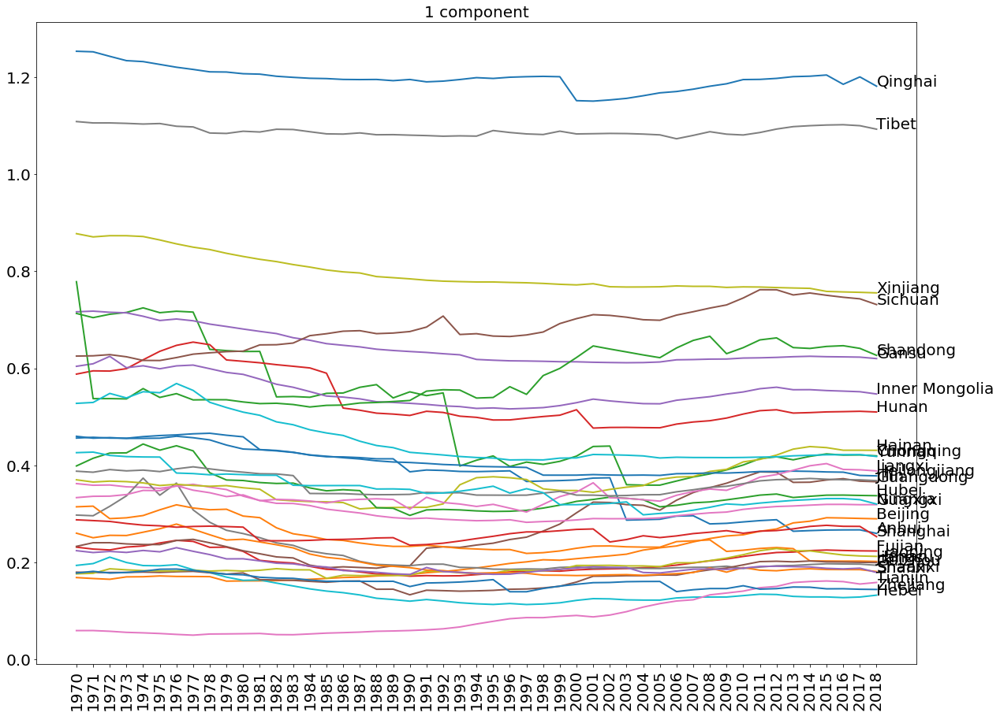

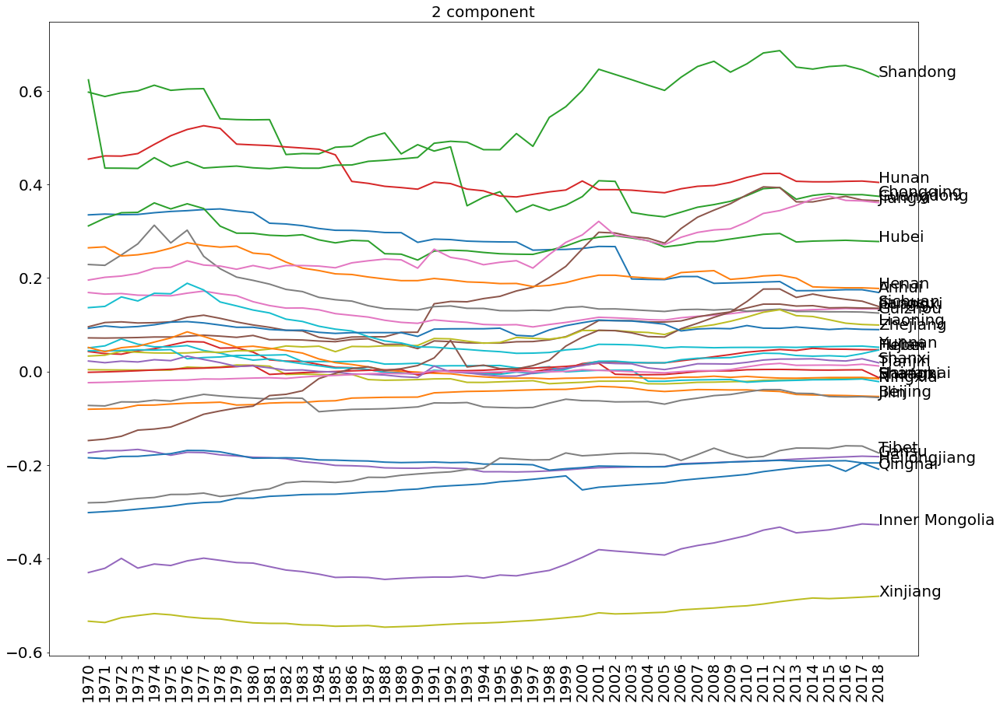

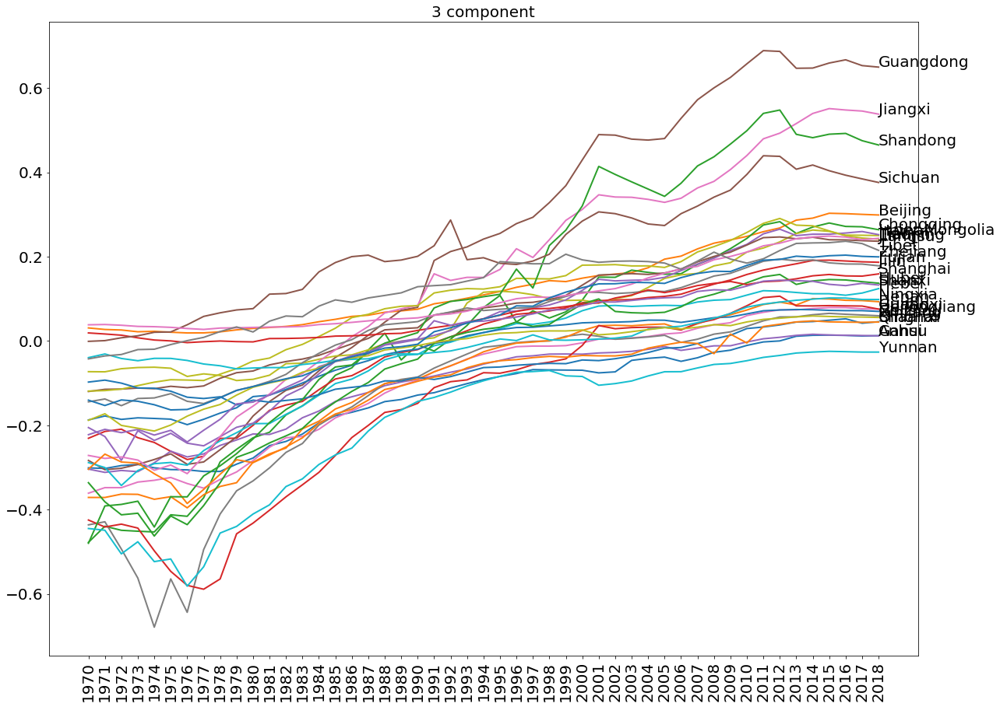

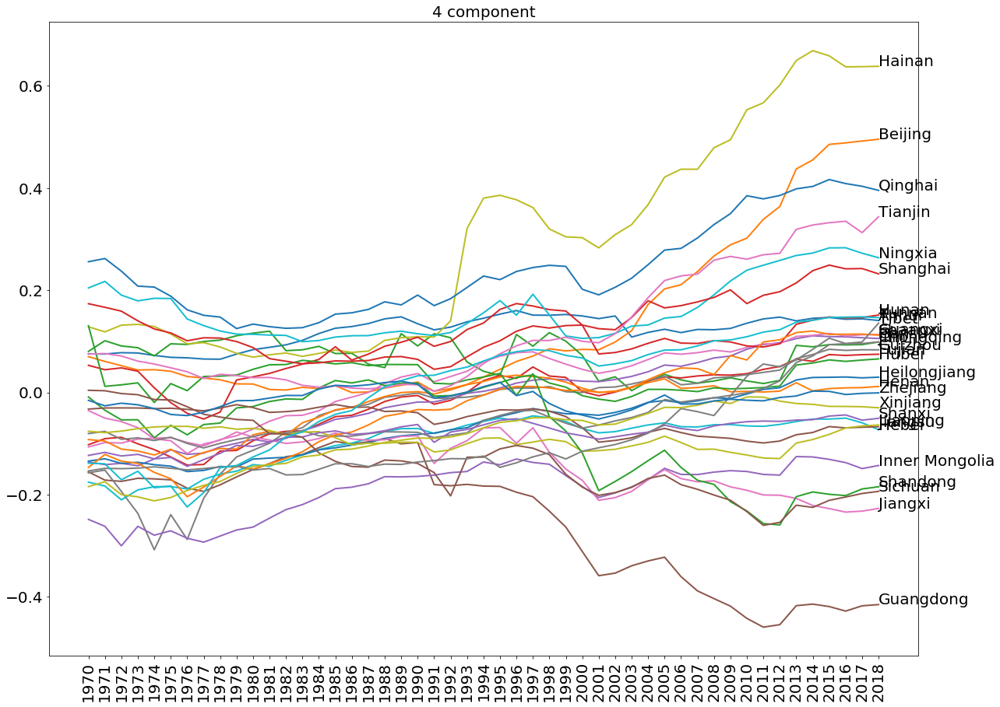

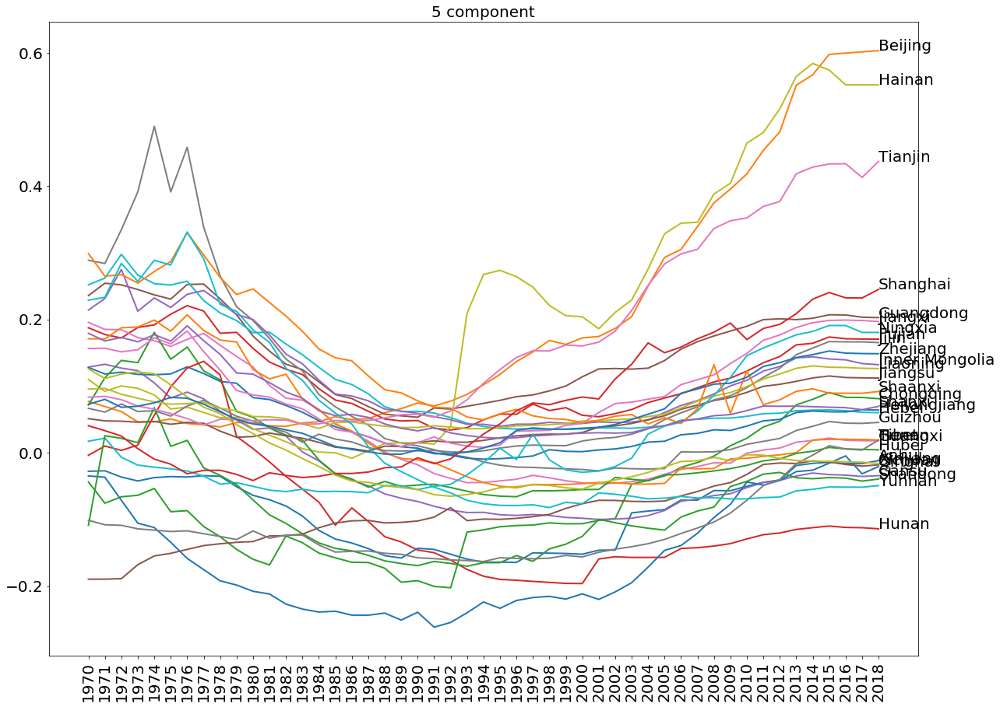

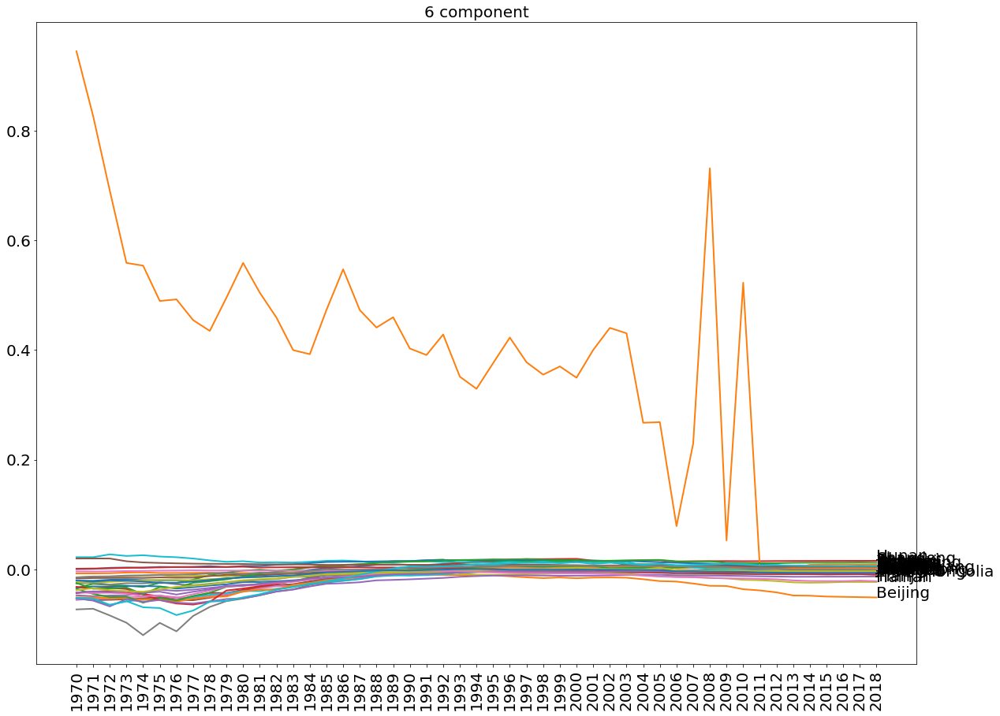

In [32]:
for el in range(6):
    plt.figure(figsize=(20,15))
    plt.title('{} component'.format(el+1),fontsize=20)
    #plt.plot(range(1996,2017),mds_representation[:21].T[el],linewidth=5)
    #plt.plot(range(1996,2017),mds_representation[21:].T[el],linewidth=5)
    #plt.legend(['Russia', 'China'])
    for pr in Provinces:
        plt.plot(df_p1[df_p1.Province==pr].Year,mds_representation[df_p1.Province==pr].T[el],linewidth=2)
        plt.text(2018,mds_representation[df_p1.Province==pr].T[el][-1],pr)
    plt.xticks(range(1970,2019),range(1970,2019),rotation='vertical')
    plt.show()    

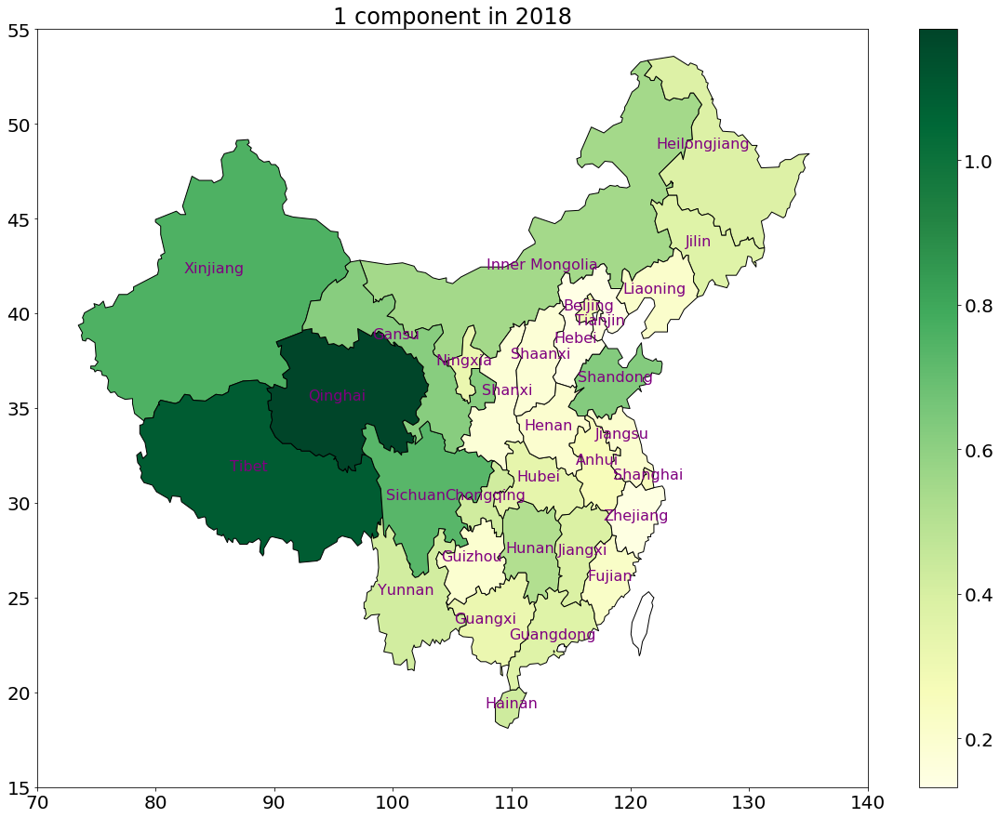

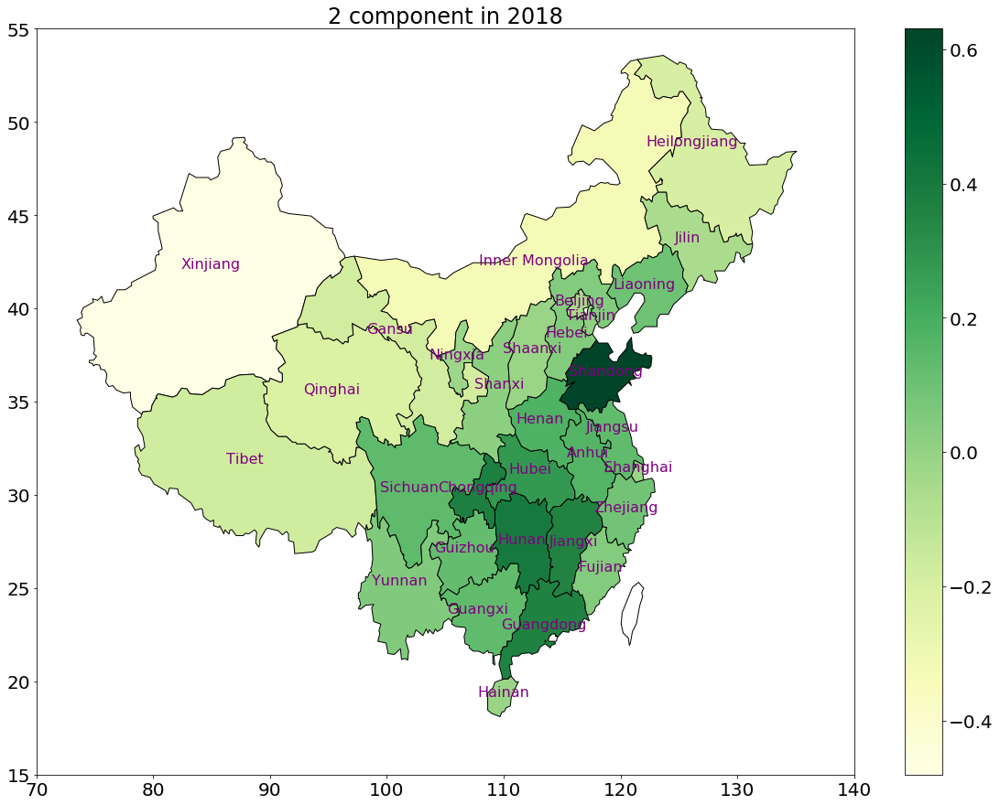

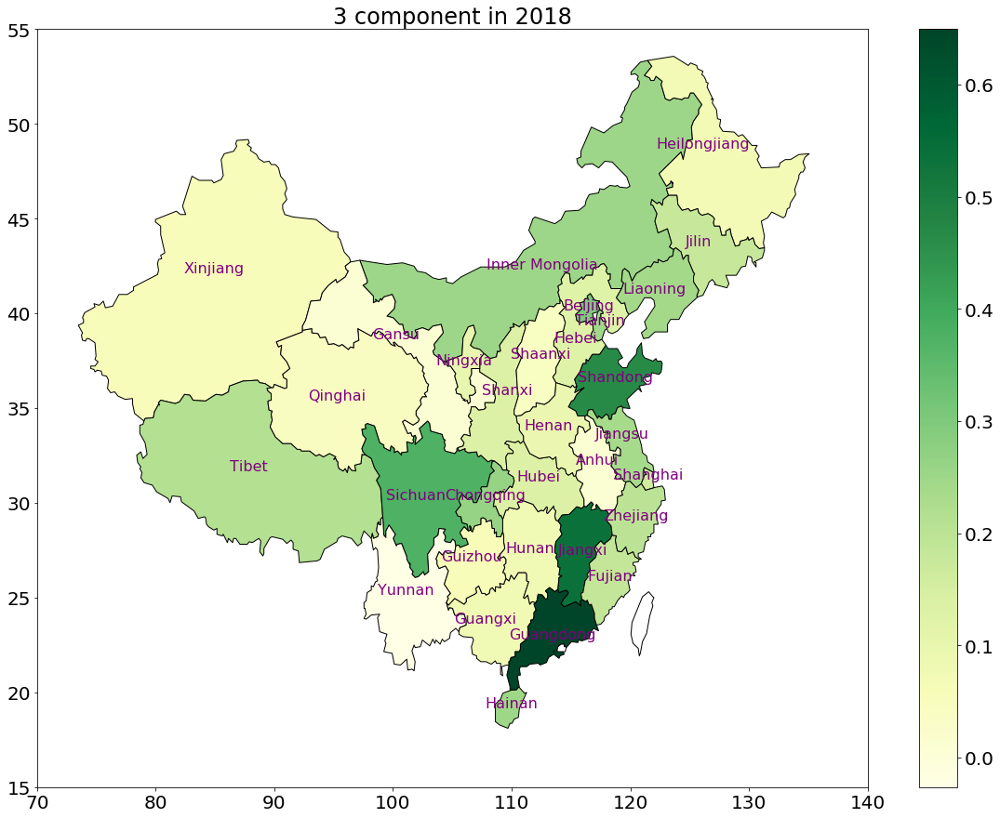

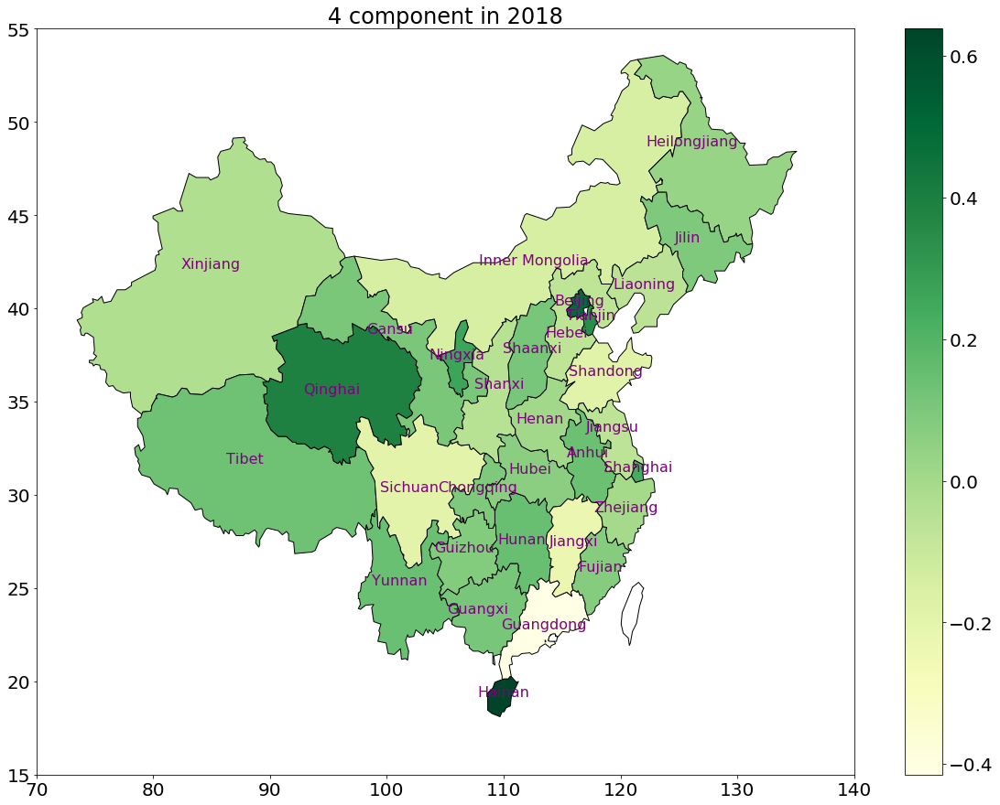

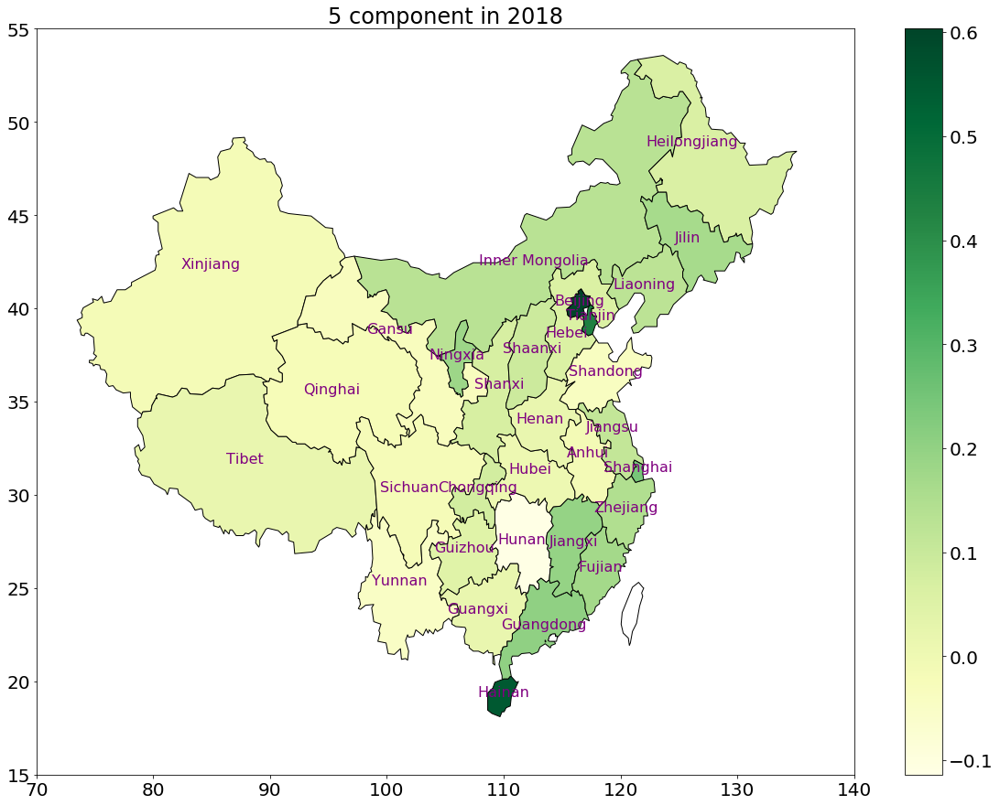

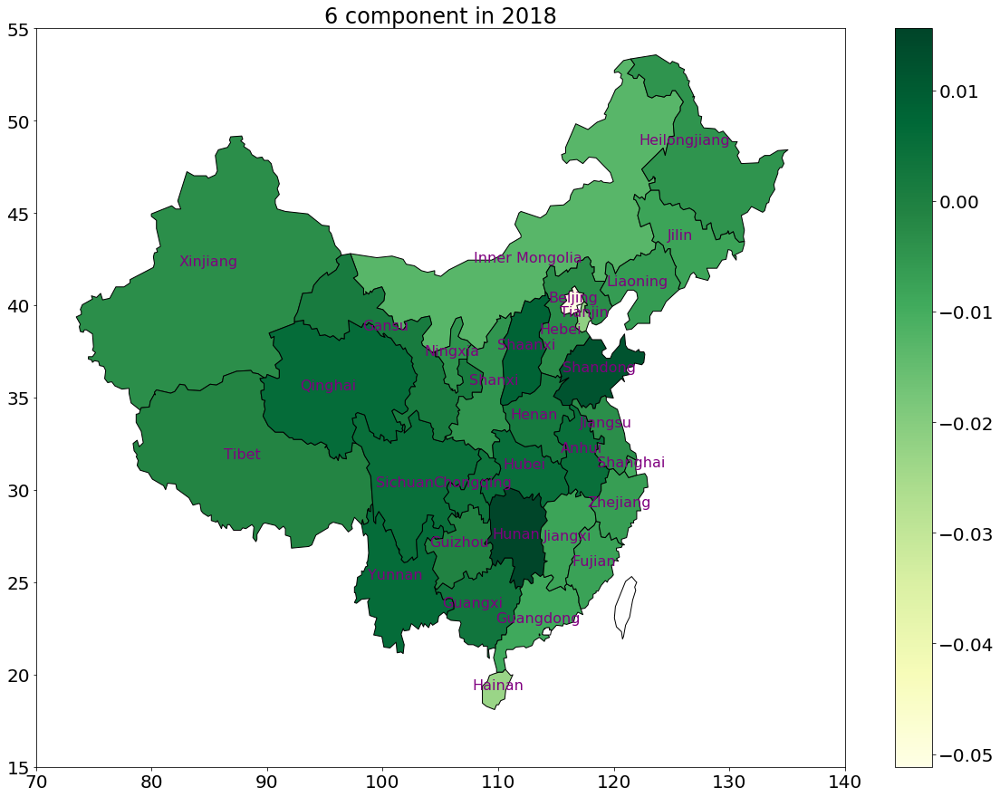

In [33]:
for par in range(6):
    fig, ax = plt.subplots(figsize=(20,15))
    plt.title(str(par+1) + ' component in 2018')
    ax.set_xlim(70,140)
    ax.set_ylim(15,55)
    #plt.imshow(image) 
    koef1=(454-7)/(116.1172663-77.0688977)
    koef2=(415-248)/(28.5275198-39.9390731)


    patches=[]
    locs=[]
    names=[]
    colors=[]
    ii=-1
    for num, feature in enumerate(geometry['features']):
        ccn1=noms[num]
        if ccn1>-1:
            ccn=Provinces[ccn1]
            ii+=1
            names.append(ccn)
            rrr=mds_representation[df_p1.Province==ccn].T[par][-1]
            colors.append(rrr)
            cc=np.array(feature['properties']['cp'])
            locs.append(cc)
            pole=np.array(feature['geometry']['coordinates'][0]).T
            if len(pole.shape)!=2:
                pole=np.array([pole[0].T[0],pole[1].T[0]])
            patches.append(Polygon(pole.T, facecolor='0.9', edgecolor='0.5',linewidth=2))
    p = PatchCollection(patches, cmap=YlGn, edgecolor="#000000", alpha=1) #color="#25CDCD", 
    p.set_array(np.array(colors))
    ax.add_collection(p)
    plt.colorbar(p)
    ppatches=[]
    for num, feature in enumerate(geometry['features']):
        ccn1=noms[num]
        if ccn1==-1:
            ccn=Provinces[ccn1]
            pole=np.array(feature['geometry']['coordinates'][0]).T
            if len(pole.shape)!=2:
                pole=np.array([pole[0].T[0],pole[1].T[0]])
            ppatches.append(Polygon(pole.T, facecolor='0.9', edgecolor='0.5',linewidth=2))
    pp = PatchCollection(ppatches, color="#FFFFFF",edgecolor="#000000", alpha=1) #color="#25CDCD", 
    ax.add_collection(pp)

    for nam, loc in zip(names, locs):
        l1=(loc[0]-locs[0][0])*koef1+0.155
        l2=(loc[1]-locs[0][1])*koef2+0.49
        ll1=loc[0]
        ll2=loc[1]
        if nam=='Inner Mongolia':
            l2-=0.07
            ll2-=4
        if nam=='Beijing':
            l2+=0.003
            ll2+=0.003*koef2
        if nam=='Hebei':
            l2-=0.05
            ll2-=1
        if nam=='Gansu':
            l2+=0.01
            l1+=0.01
            ll1+=0.5
            ll2+=0.5
        if nam=='Jiangsu':
            l2+=0.012
            l1+=0.007
            ll1+=0.5
            ll2+=0.5
        plt.text(ll1,ll2,nam,horizontalalignment='center',fontsize=16,color='purple')


    plt.show() 

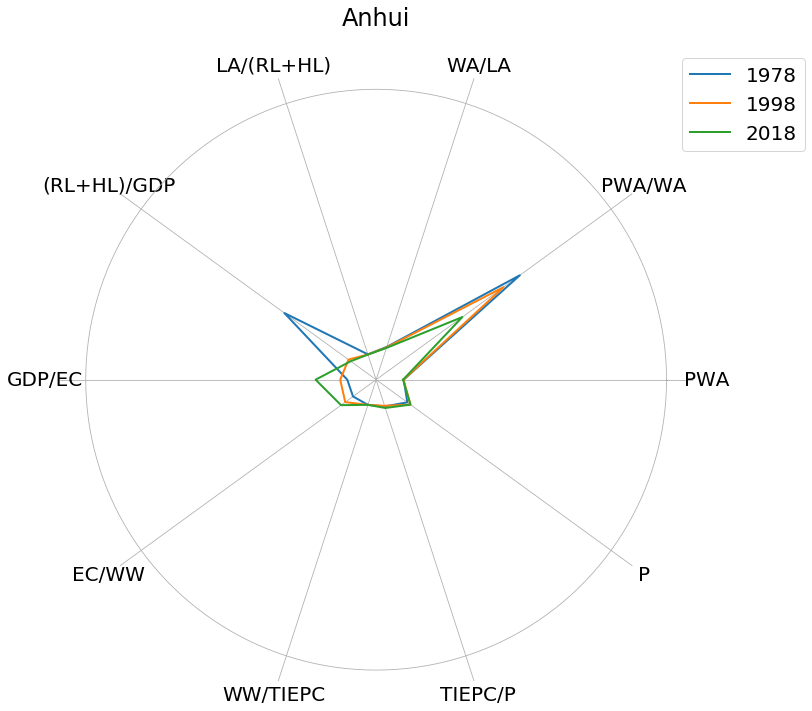

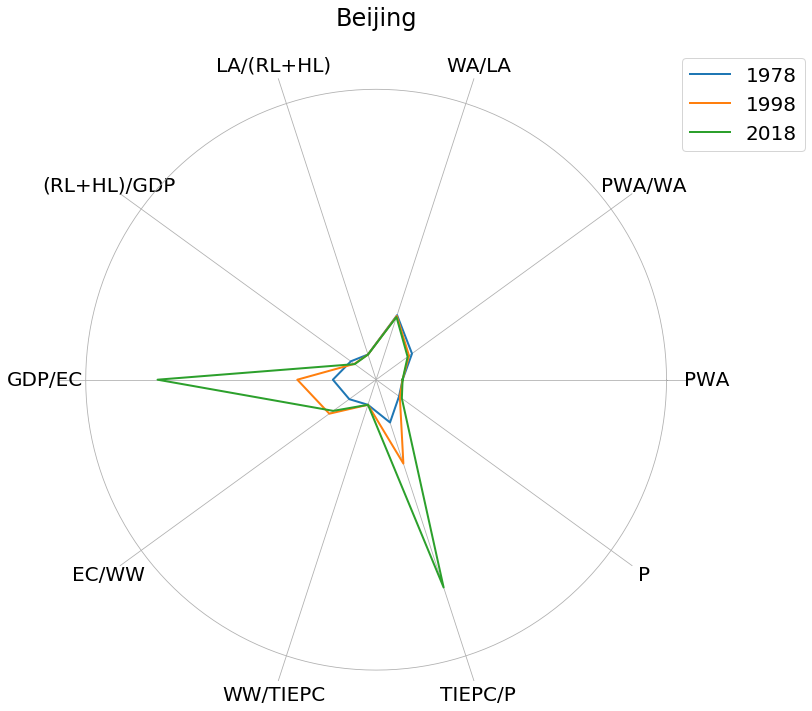

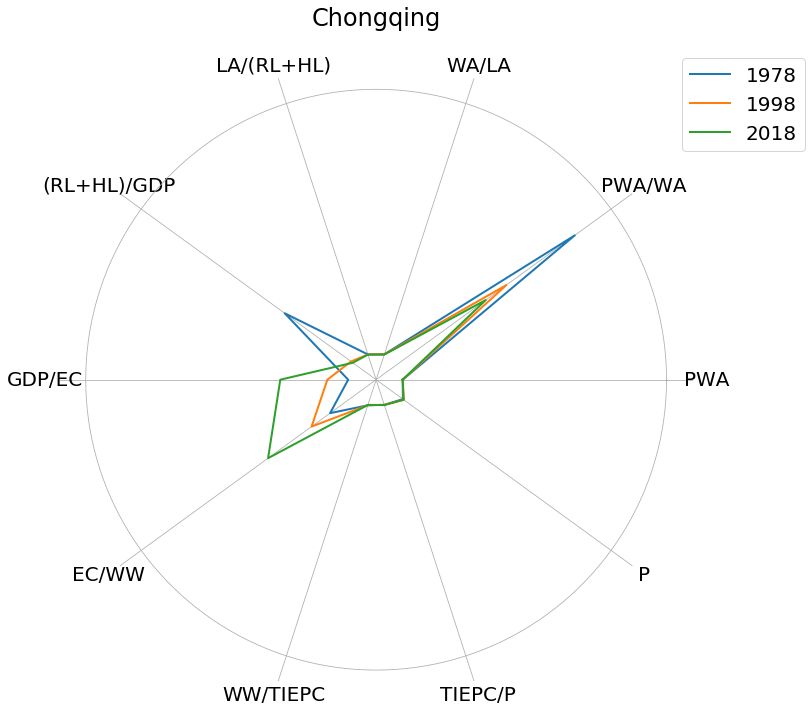

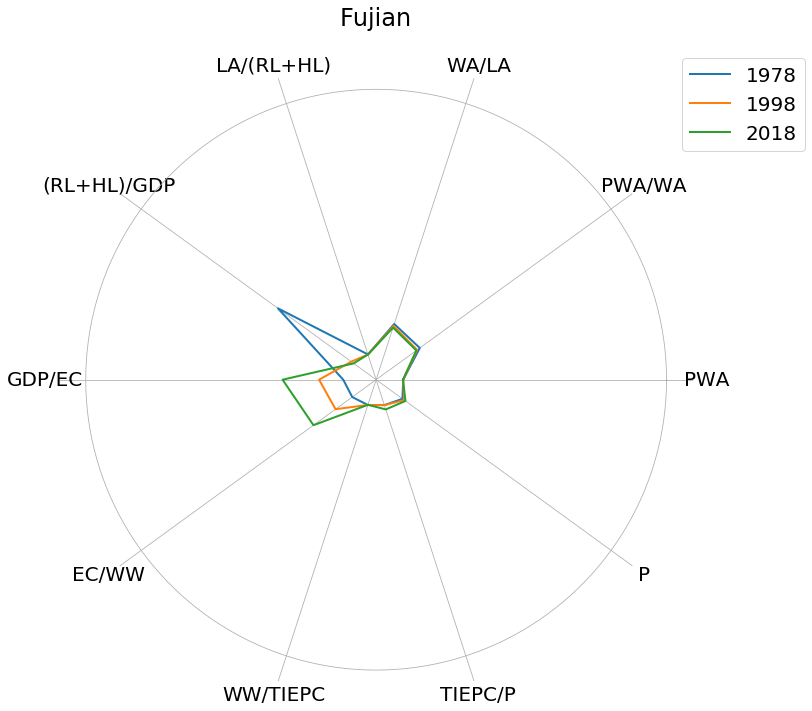

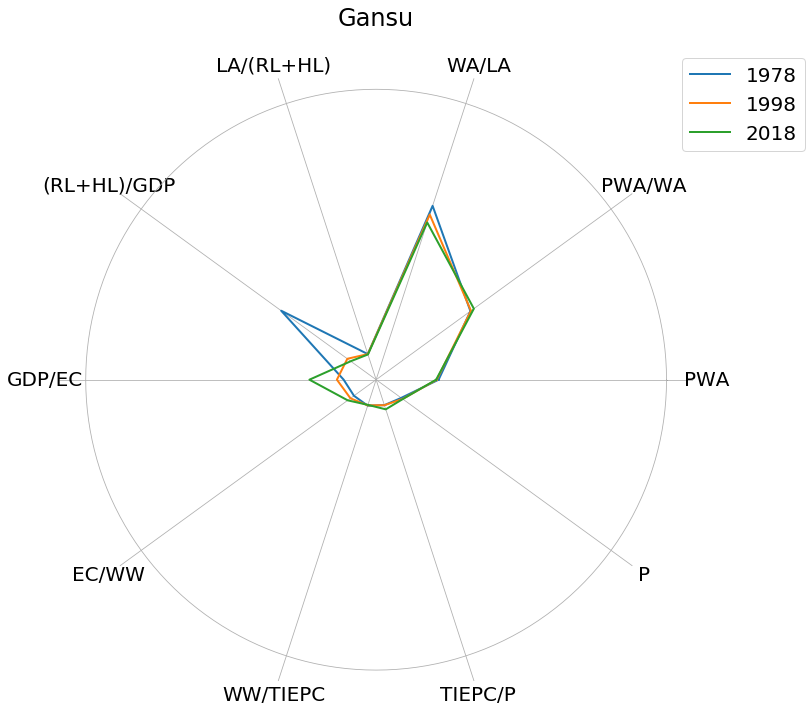

...

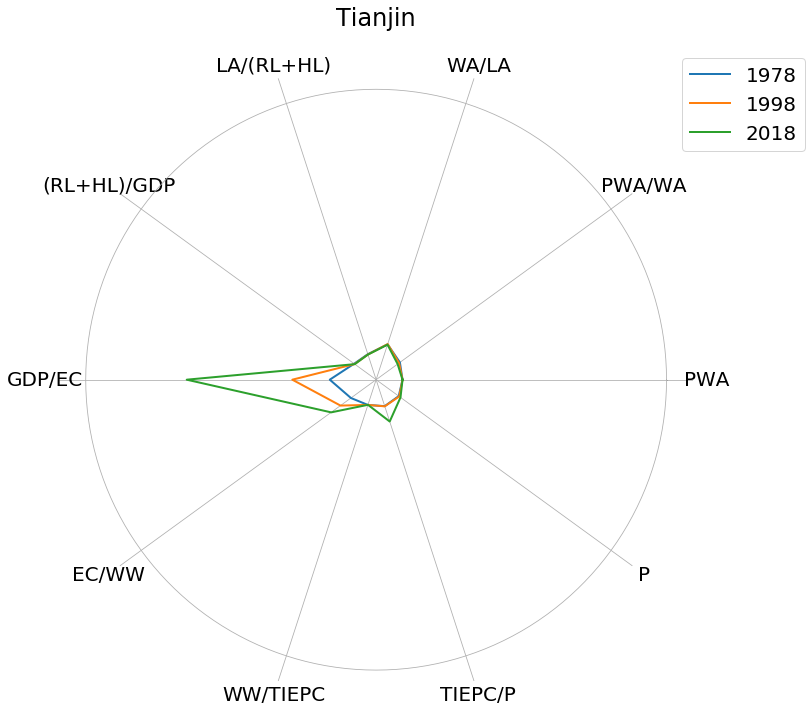

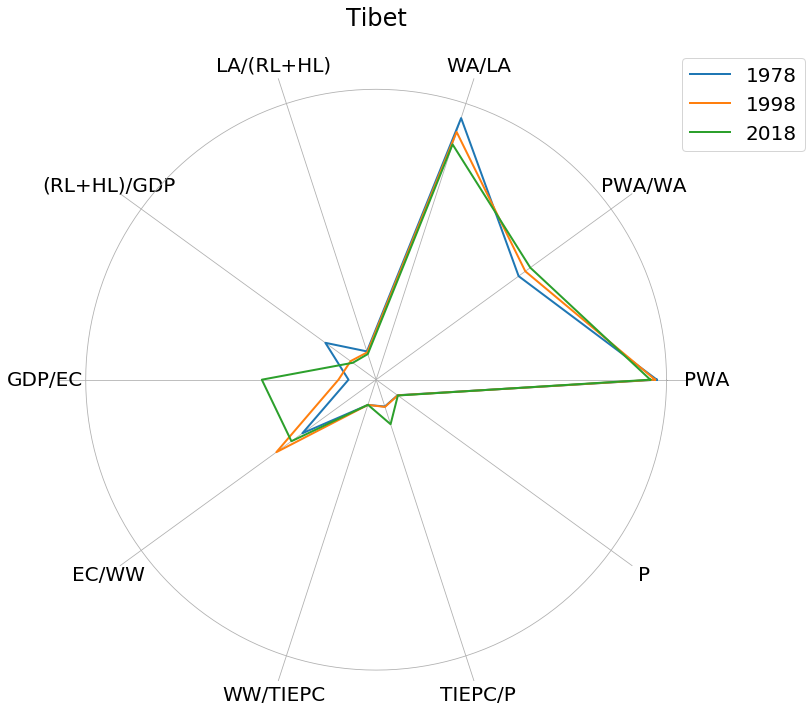

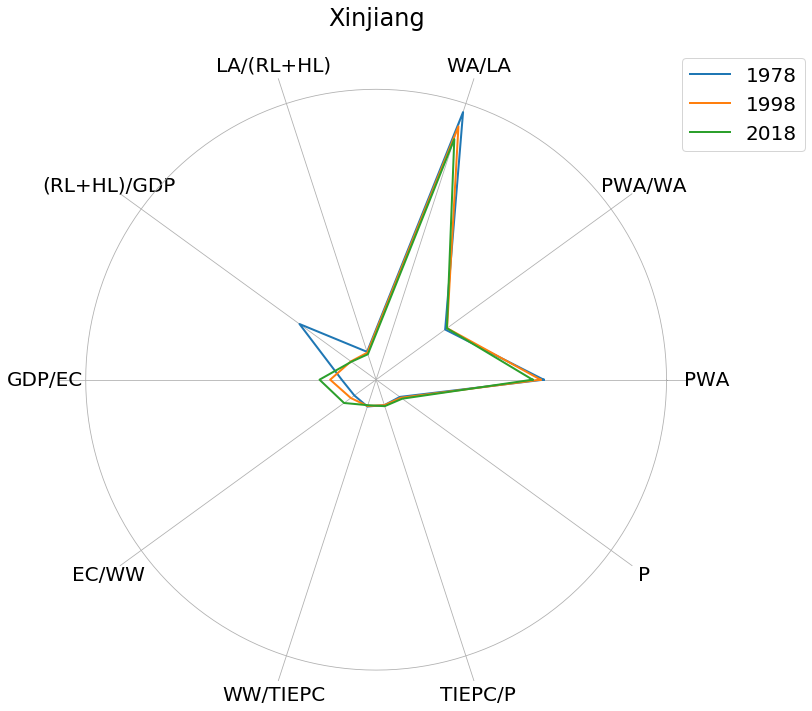

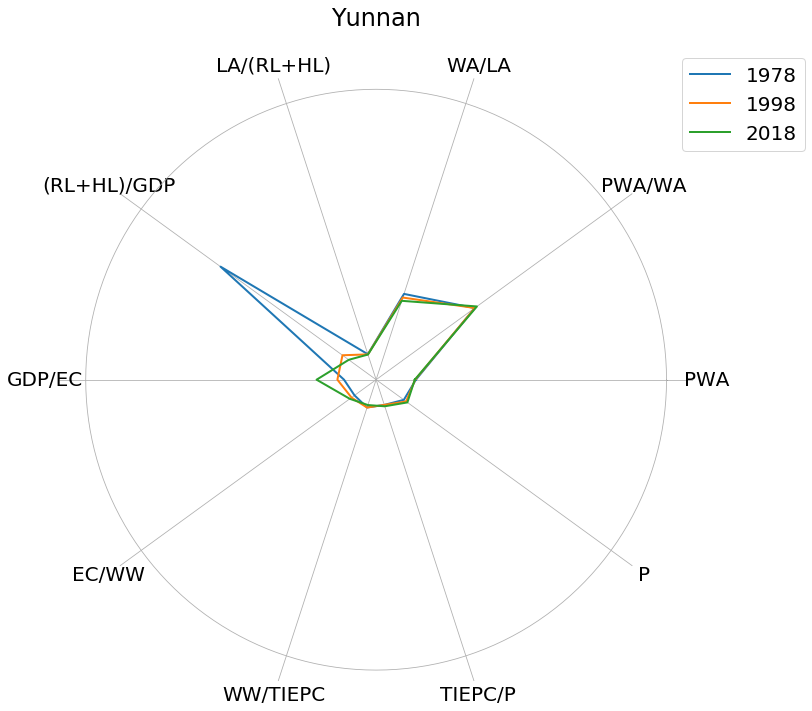

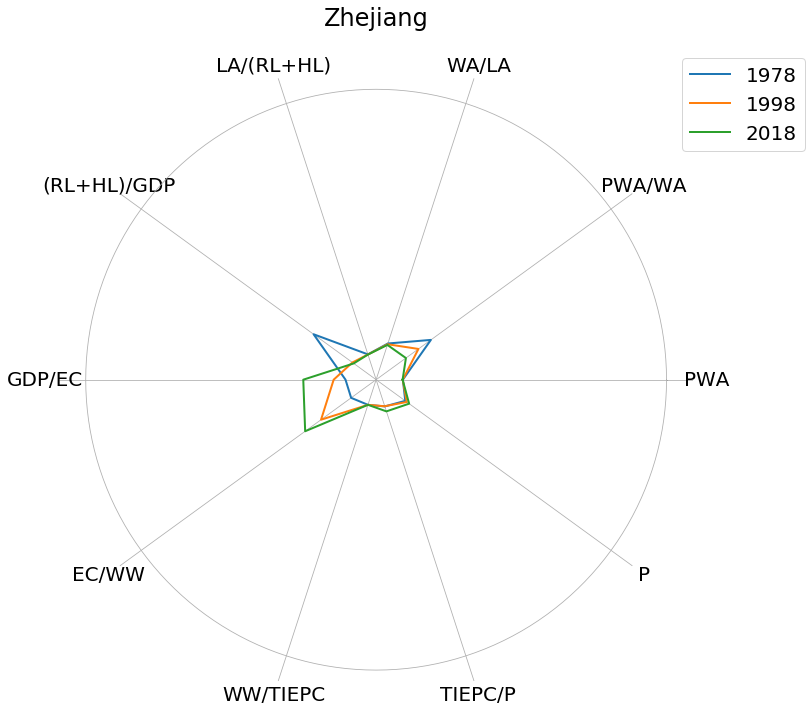

In [34]:
for pr in Provinces:
    masX=[1978,1998,2018]
    dfn=df_norm[df_p1.Province==pr]
    dfn['Year']=range(1970,2019)
    dfn=dfn[list(map(lambda x: x in masX,dfn.Year))]
    angels=np.linspace(0,2*np.pi,len(Cr1)+1)
    fig=plt.figure(figsize=(17,10))
    ax= plt.subplot(111,polar=True,frameon=False)
    ax.patch.set_visible(False)
    plt.xticks(angels[:-1],Cr1,size=20)
    ax.set_rlabel_position(0)
    plt.yticks(range(1,10),range(1,10),fontsize=1)
    plt.ylim(-0.1,1.1)
    plt.title(pr)
    for el in masX:
        ttt=list(np.array(dfn[dfn.Year==el][Cr1])[0])
        ttt.append(ttt[0])
        ax.plot(angels,ttt,linestyle='solid',linewidth=2)
    #ttt=list(mdl.inverse_transform(pd.DataFrame(mr).T)[-1])
    #ttt.append(ttt[0])
    #ax.plot(angels,ttt,linestyle='solid',linewidth=2)
    plt.legend(masX,bbox_to_anchor=(0.8,0.9), loc="upper center", fontsize=20,  
                bbox_transform=plt.gcf().transFigure)
    plt.subplots_adjust(left=0.0, bottom=0.0, right=1.)
    plt.show()


In [42]:
dft= pd.read_csv('c:/python/SINO_china.csv',sep=';',decimal=',')
cats=list(dft['Indicator _English'])[:-2]
cods=list(dft['Code'])[:-2]
dft1=dft[dft.columns[3:]].T
dft1.columns=dft.Code
PeakOil=dft1.PeakO[10:-5]
GDP =dft1.FP[10:-5]
EROIg=dft1.EROIg[10:-5]
EROIo=dft1.EROIo[10:-5]

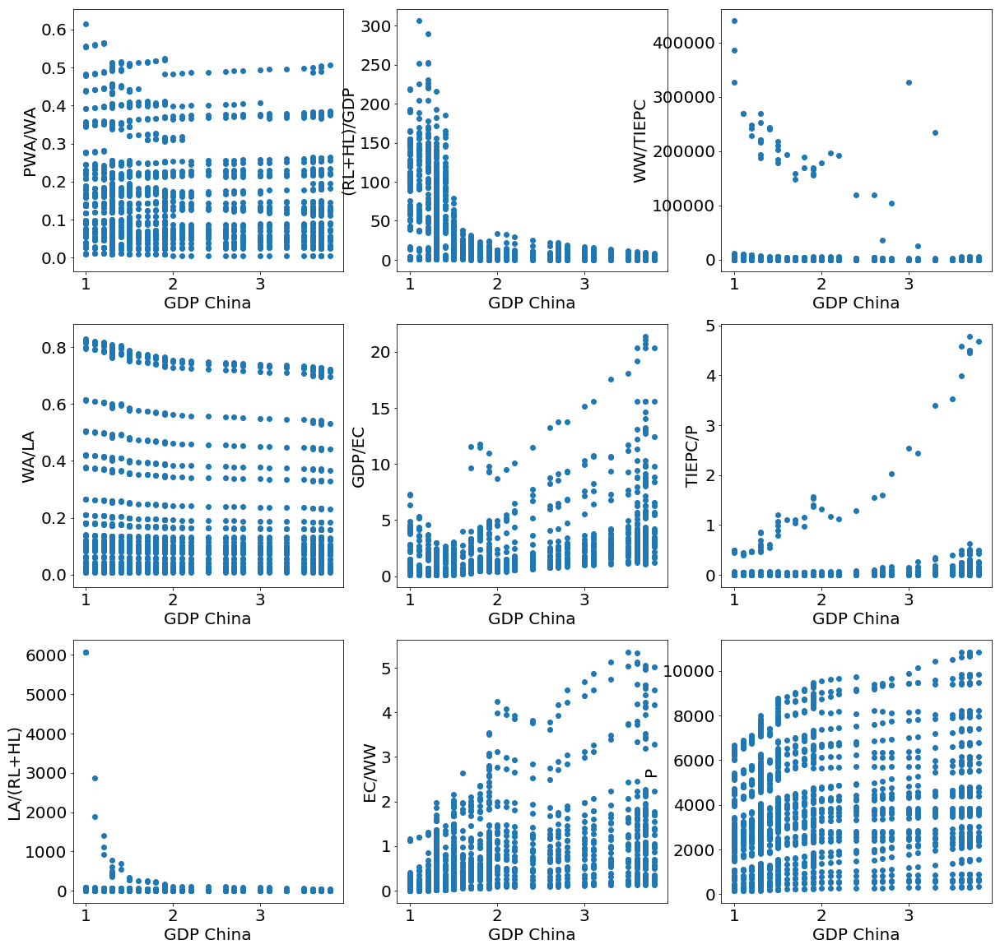

In [62]:
fig=plt.figure(figsize=(20,20))
axes=fig.subplots(3,3)
ii=-1
for el in Cr1[1:]:
        ii+=1
        i1=ii%3
        i2=ii//3
        axes[i1,i2].set_ylabel(el)
        axes[i1,i2].set_xlabel('GDP China')
        axes[i1,i2].scatter(list(GDP[Years2018])*31,list(df_p1[el]))
plt.show()

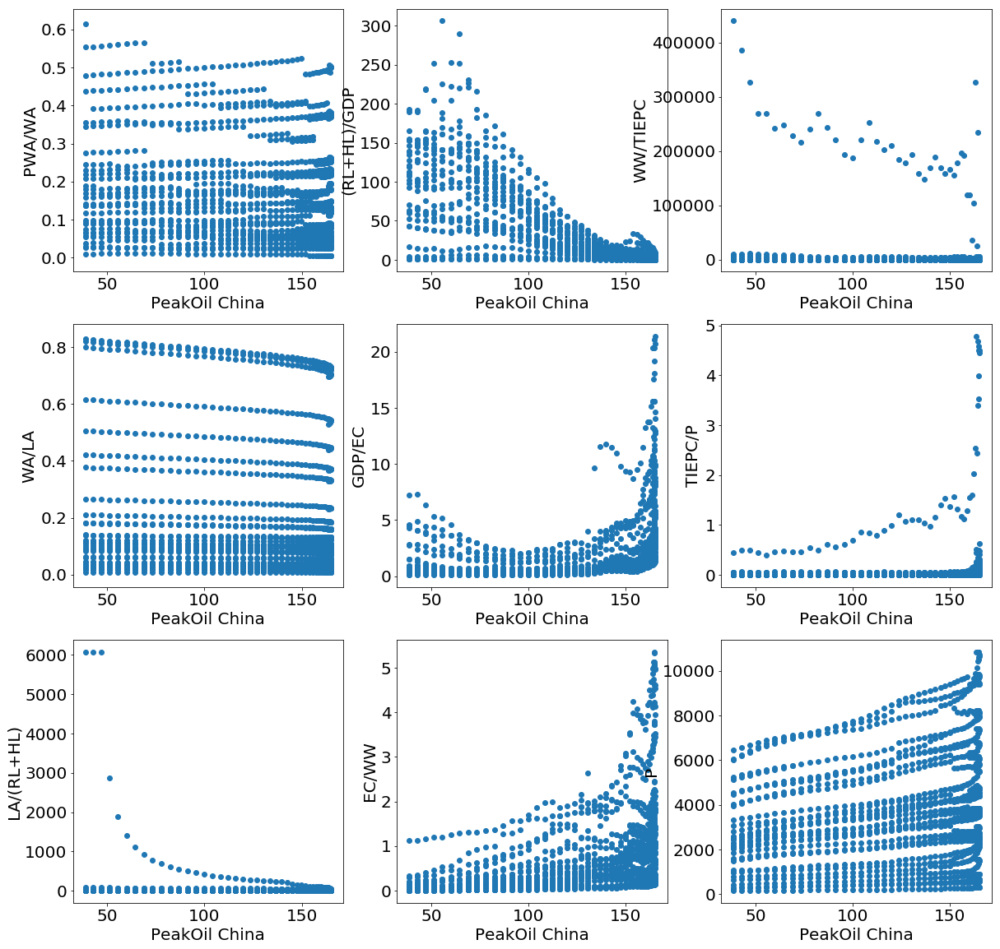

In [63]:
fig=plt.figure(figsize=(20,20))
axes=fig.subplots(3,3)
ii=-1
for el in Cr1[1:]:
        ii+=1
        i1=ii%3
        i2=ii//3
        axes[i1,i2].set_ylabel(el)
        axes[i1,i2].set_xlabel('PeakOil China')
        axes[i1,i2].scatter(list(PeakOil[Years2018])*31,list(df_p1[el]))
plt.show()

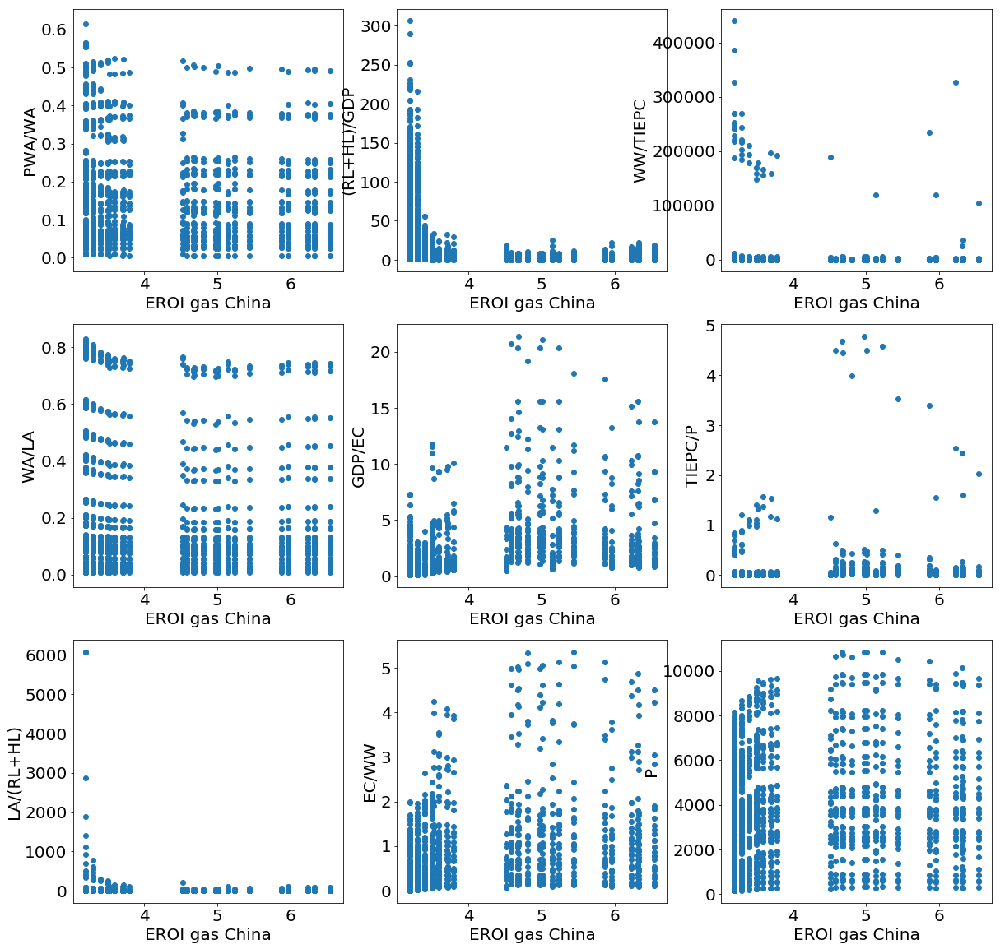

In [64]:
fig=plt.figure(figsize=(20,20))
axes=fig.subplots(3,3)
ii=-1
for el in Cr1[1:]:
        ii+=1
        i1=ii%3
        i2=ii//3
        axes[i1,i2].set_ylabel(el)
        axes[i1,i2].set_xlabel('EROI gas China')
        axes[i1,i2].scatter(list(EROIg[Years2018])*31,list(df_p1[el]))
plt.show()

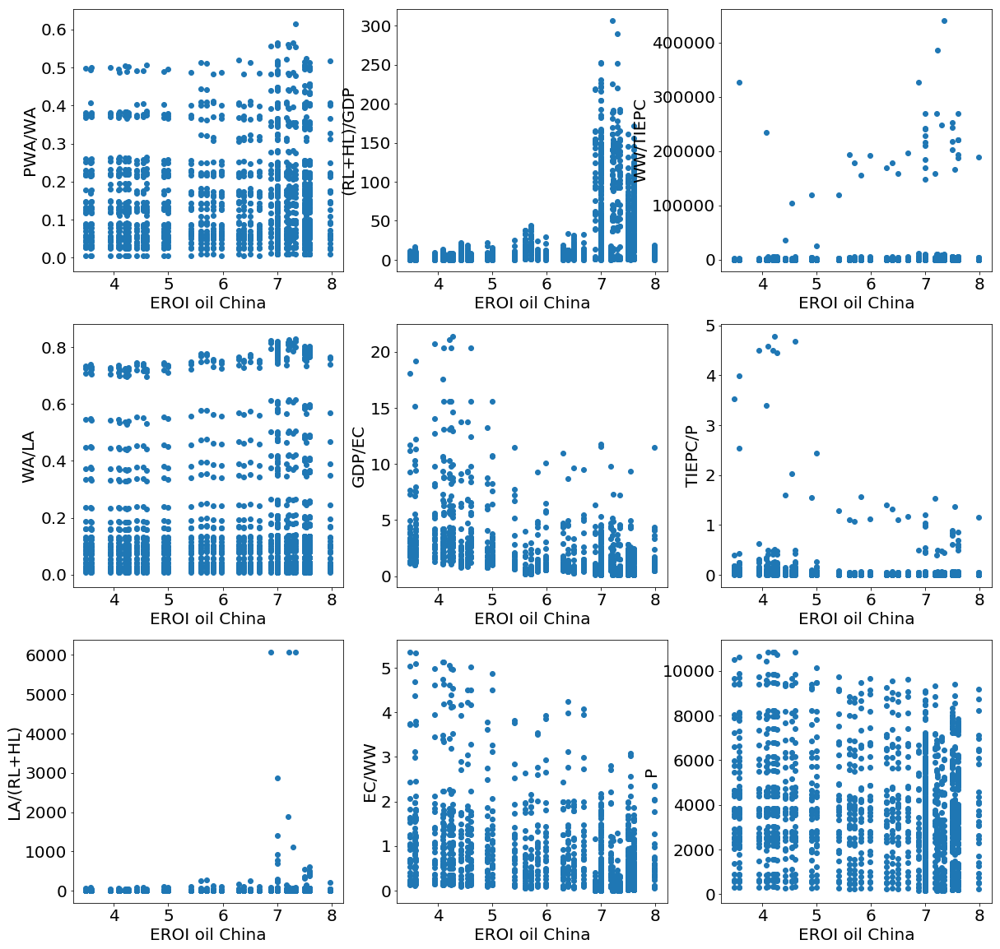

In [65]:
fig=plt.figure(figsize=(20,20))
axes=fig.subplots(3,3)
ii=-1
for el in Cr1[1:]:
        ii+=1
        i1=ii%3
        i2=ii//3
        axes[i1,i2].set_ylabel(el)
        axes[i1,i2].set_xlabel('EROI oil China')
        axes[i1,i2].scatter(list(EROIo[Years2018])*31,list(df_p1[el]))
plt.show()

In [71]:
import statsmodels.api as sm
import datetime
import warnings
warnings.simplefilter("ignore")
lr1=0
ur1=0

In [74]:
def Vivod(pr):
    ff1=pd.DataFrame(np.array(PeakOil),columns=['PeakOil'])
    ff1['GDP']=np.array(GDP)
    ff1['EROIg']=np.array(EROIo)
    ff1['EROIo']=np.array(EROIg)
    ff1['Pop']=np.array(Pop)
    ff1['x']=np.arange(1970,2031)-1970
    ff1.index=list(map(lambda x: datetime.datetime(x+1970,1,1,0,0,0),ff1.index))
    ff2=ff1[np.arange(1970,2031)<2019]
    ff3=ff1[np.arange(1970,2031)>2018]
    for el in range(6):
        ff2['{}c'.format(el+1)]=mds_representation[df_p1.Province==pr].T[el]
    lr=[]
    mr=[]
    ur=[]
    models_r=[]
    for el in range(6):
        ss1=str(el+1)+'c'
        ps = range(0, 2) 
        d=1
        qs = range(0, 2) 
        Ps = range(0, 2) 
        D=0
        Qs = range(0, 2) 
        parameters = itertools.product(ps, qs, Ps, Qs)
        parameters_list = list(parameters)
        best_aic = 99999999999
        best_params=(8,1,1,1)
        excl_params=[]
        for param in parameters_list:
            if not (param in excl_params):
                try:
                    model=sm.tsa.statespace.SARIMAX(ff2[ss1], 
                                        order=(param[0], d, param[1]), 
                                        exog=ff2[['PeakOil','GDP','EROIo','EROIg', 'Pop']],
                                        seasonal_order=(param[2], D, param[3], 10)).fit(disp=-1)
                except ValueError:
                    continue
                aic = model.aic
                if aic < best_aic:
                    best_model = model
                    best_aic = aic
                    best_param = param
        res=best_model.get_prediction(start=len(ff2), end=len(ff2)+11,exog=ff3[['PeakOil','GDP','EROIo','EROIg','Pop']])
        models_r.append(res)
        res_lo= res.conf_int(alpha=0.5)['lower '+ss1]
        lr.append(res_lo)
        res_up= res.conf_int(alpha=0.5)['upper '+ss1]
        ur.append(res_up)
        res_mn= res.predicted_mean
        mr.append(res_mn)
    
    colors=['blue','orange','green','red','violet','gray','pink','thistle','aqua']
    plt.figure(figsize=(20,10))
    plt.title('{} components'.format(pr),fontsize=20)
    for el in range(6):
        plt.plot(df_p1[df_p1.Province==pr].Year,mds_representation[df_p1.Province==pr].T[el],linewidth=4,color=colors[el])
    plt.legend(range(1,10))
    for el in range(6):
        plt.plot(range(2019,2031),mr[el],linewidth=4,color=colors[el])
        plt.plot(range(2019,2031),ur[el],linewidth=2,color=colors[el])
        plt.plot(range(2019,2031),lr[el],linewidth=2,color=colors[el])
    plt.xticks(range(1970,2031),range(1970,2031),rotation='vertical')
    plt.show()
    mas_res.append([lr,ur])

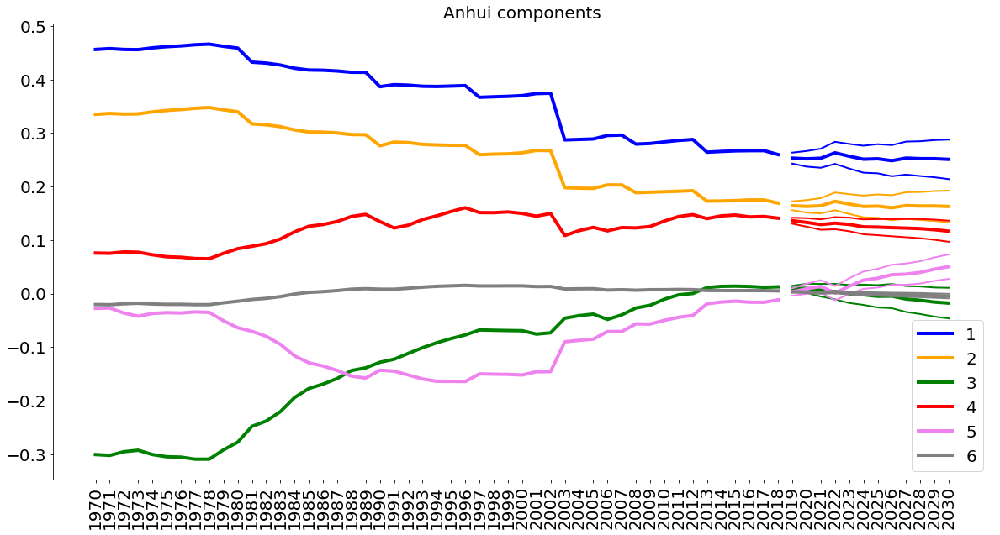

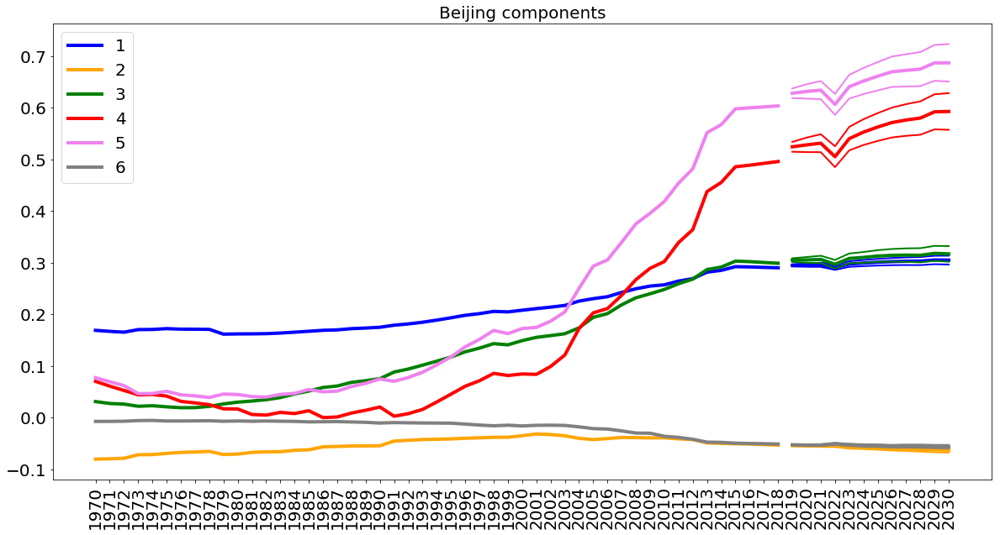

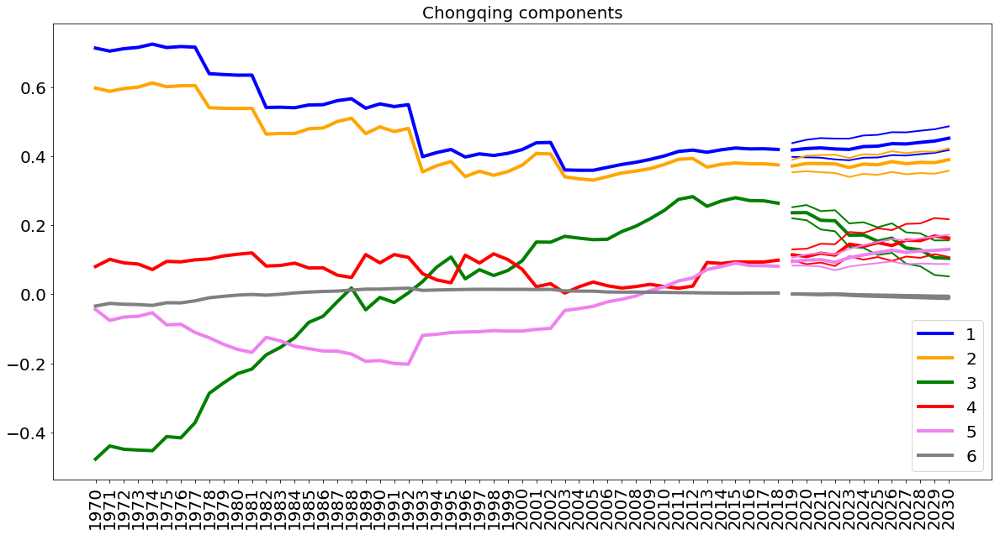

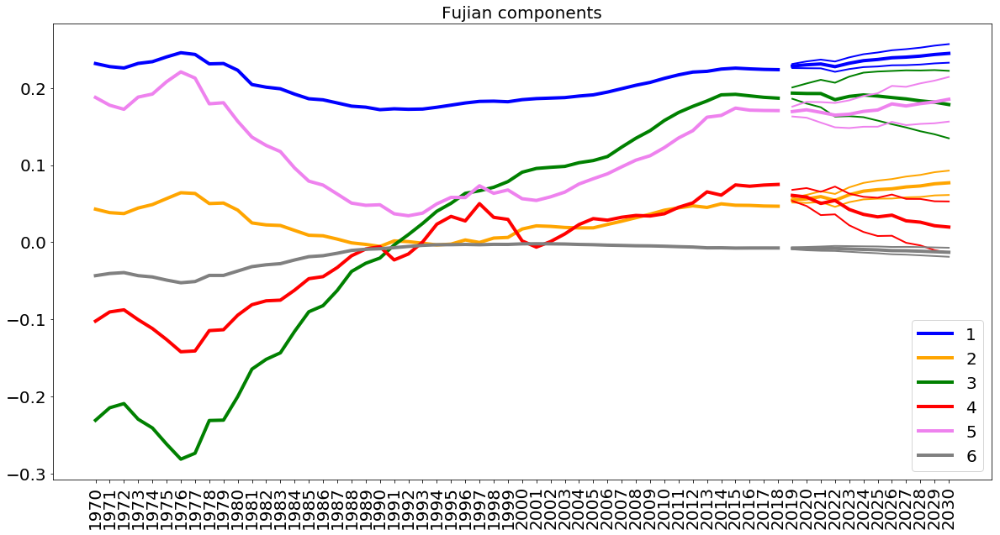

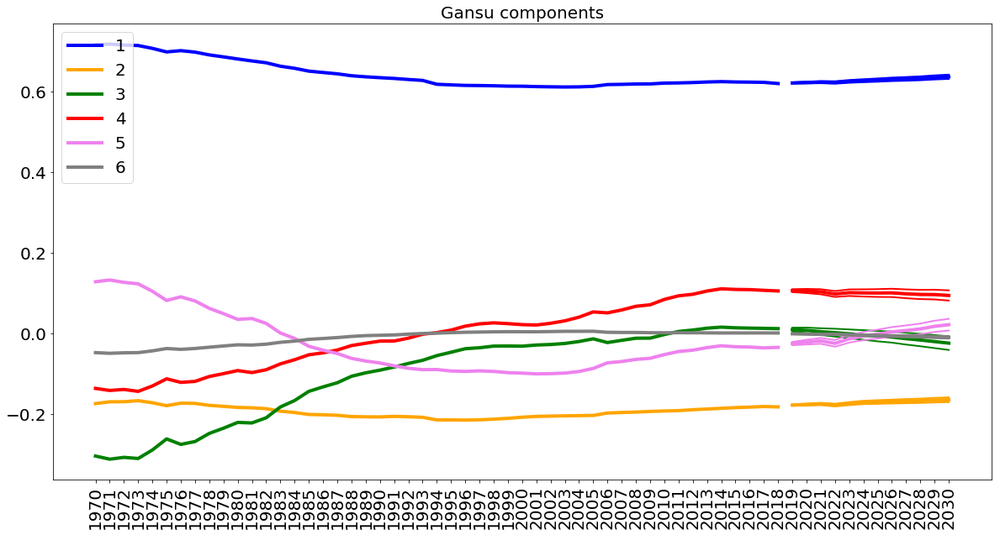

...

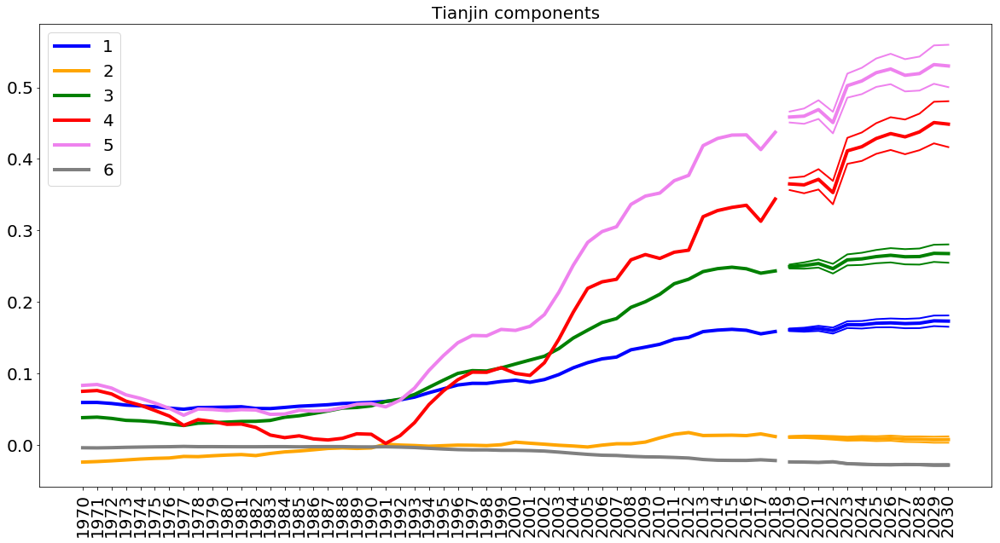

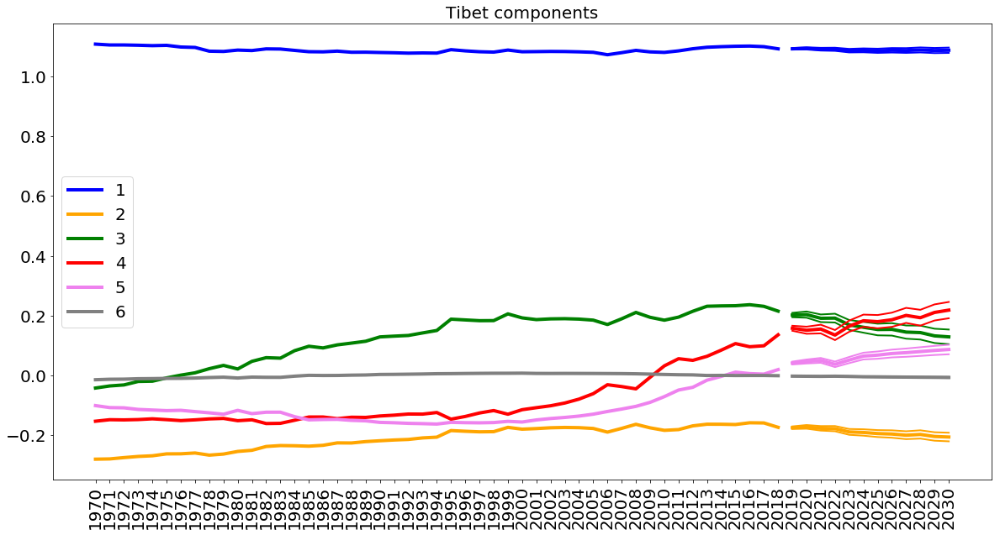

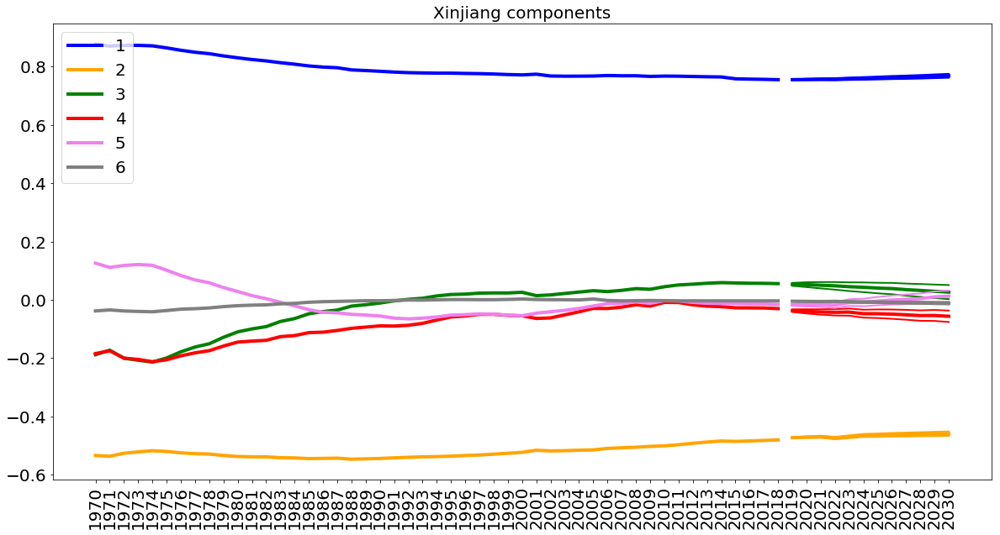

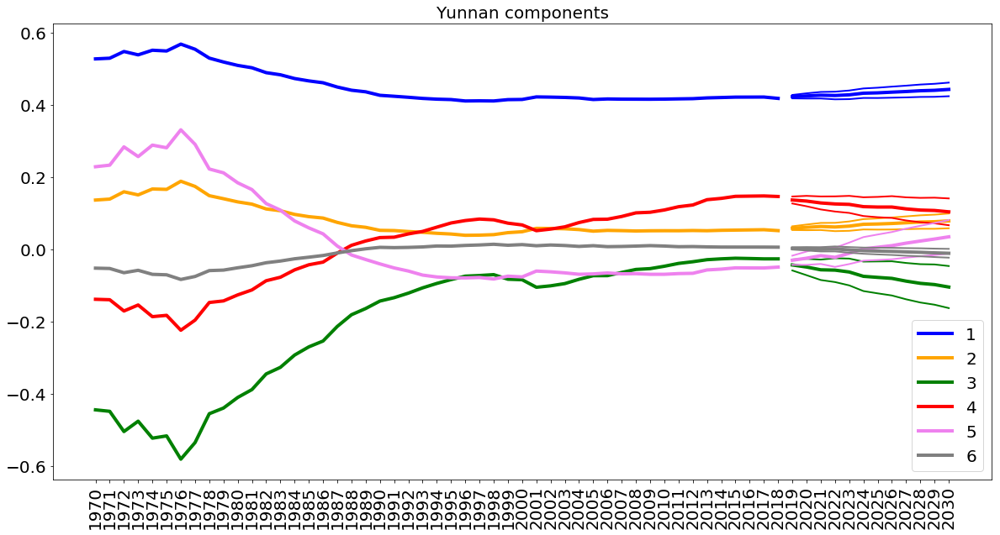

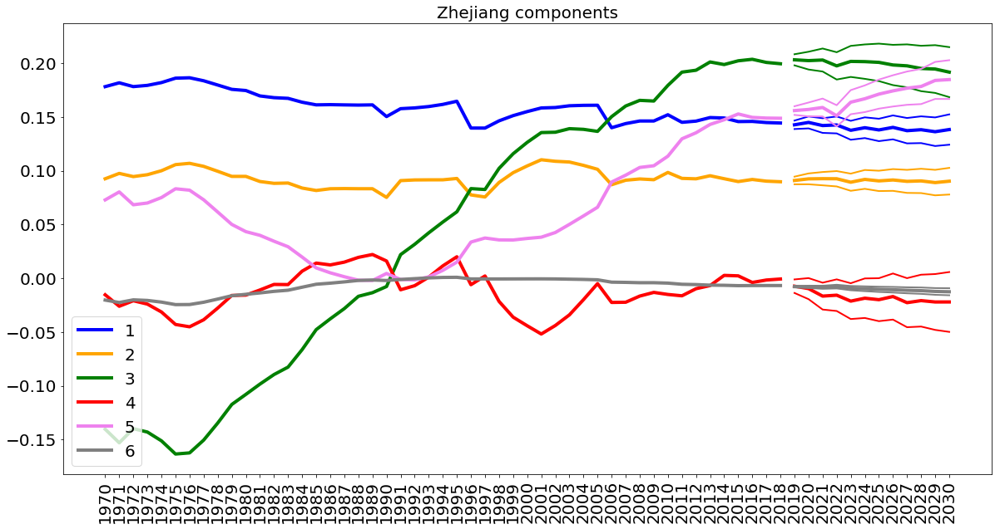

In [75]:
mas_res=[]
for el in Provinces:
    Vivod(el)

In [78]:
ttt=df_p[Cr1[1:]]
mms_res=MMS().fit(ttt)


In [127]:
def Vivod2(el):
    pr=Provinces[el]
    xcx2=[]
    xcx3=[]
    for xcx in np.array(mas_res[el]).T:
        xcx1=mdl.inverse_transform(list(itertools.product(xcx[0],xcx[1],xcx[2],xcx[3],xcx[4],xcx[5])))
        xcx2.append(xcx1.min(axis=0))
        xcx3.append(xcx1.max(axis=0))
    df_norm2=mms_res.inverse_transform(xcx2)
    df_norm3=mms_res.inverse_transform(xcx3)
    mas_res2.append([Provinces[el],2030] + list(list((np.array(df_norm2)+np.array(df_norm3))/2)[-1]))


In [153]:
mas_res2=[]
for num,el in enumerate(Provinces):
    Vivod2(num)
df_p0=pd.DataFrame(mas_res2,columns=['Province','Year']+Cr1[1:])
for el in df_p0.columns[3:]:
    df_p0[el]=list(map(lambda x: 0.001 if x<0 else x, df_p0[el]))
for el in ['PWA/WA','WA/LA']:
    df_p0[el]=list(map(lambda x: 1 if x>1 else x, df_p0[el]))
ddd=dict()
for el in Provinces:
    ddd[el]=list(df_p[df_p.Province==el].LA)[0]
df_p0['PWA']=list(map(lambda x: x[1]*x[2]*ddd[x[0]],np.array(df_p0[['Province','PWA/WA','WA/LA']])))
df_p0.head()

,Province,Year,PWA/WA,WA/LA,LA/(RL+HL),(RL+HL)/GDP,GDP/EC,EC/WW,WW/TIEPC,TIEPC/P,P,PWA
0,Anhui,2030,0.167572,0.027946,0.001000,25.724118,3.156016,0.358712,776.975399,0.165425,2440.846104,654.208409
1,Beijing,2030,0.021887,0.127316,0.001000,4.802258,20.803558,0.444287,0.001000,1.420173,1780.110404,46.813200
2,Chongqing,2030,0.293291,0.001000,0.001000,38.166015,6.269744,1.513941,634.875696,0.350403,6090.930690,24.137839
3,Fujian,2030,0.062262,0.095941,0.001000,15.816155,4.805118,1.271733,452.761336,0.320126,3551.419845,724.582550
4,Gansu,2030,0.222140,0.437072,57.404121,27.183045,3.832543,0.202562,0.001000,0.175895,1611.732821,44118.292273


In [154]:

masX=[1970,1990,2010,2018]
df_p3=df_p[list(map(lambda x: x in masX,df_p.Year))][['Province', 'Year']+Cr1[1:]+['PWA']]
df_p4=pd.DataFrame(list(np.array(df_p3))+list(np.array(df_p0)),columns=['Province', 'Year']+Cr1[1:]+['PWA'])
mms3=pd.DataFrame(MMS().fit_transform(df_p4[df_p4.columns[2:]]))
mms3.columns=df_p4.columns[2:]
mms3.head()

,PWA/WA,WA/LA,LA/(RL+HL),(RL+HL)/GDP,GDP/EC,EC/WW,WW/TIEPC,TIEPC/P,P,PWA
0,0.559179,0.038198,0.001256,0.508466,0.019774,0.002820,0.000199,0.010705,0.303578,0.004507
1,0.519386,0.035900,0.000725,0.138869,0.013806,0.025381,0.000198,0.008332,0.442479,0.003945
2,0.348273,0.033748,0.000151,0.037782,0.097235,0.059173,0.000205,0.011723,0.465055,0.002506
3,0.303642,0.033023,0.000107,0.030787,0.130320,0.063764,0.000162,0.017488,0.479994,0.002145
4,0.056605,0.164100,0.000782,0.022610,0.124970,0.008598,0.000038,0.093591,0.050937,0.000249


In [159]:
def Vivod3(el,pr):
    masX=[1970,1990,2010,2030]
    plt.rcParams['font.size'] = 20
    dfn=mms3[df_p4.Province==pr]
    dfn1=df_p4[df_p4.Province==pr]
    angels=np.linspace(0,2*np.pi,len(Cr1)+1)
    fig=plt.figure(figsize=(17,10))
    ax= plt.subplot(111,polar=True,frameon=False)
    ax.patch.set_visible(False)
    plt.xticks(angels[:-1],Cr1[1:]+['PWA'],size=20)
    ax.set_rlabel_position(0)
    plt.yticks(range(1,10),range(1,10),fontsize=1)
    plt.ylim(-0.1,1.1)
    plt.title(pr)
    for el in masX:
        ttt=list(np.array(dfn[dfn1.Year==el][Cr1[1:]+['PWA']])[0])
        ttt.append(ttt[0])
        ax.plot(angels,ttt,linestyle='solid',linewidth=2)
    plt.legend(masX,bbox_to_anchor=(0.8,0.9), loc="upper center", fontsize=20,  
                bbox_transform=plt.gcf().transFigure)
    plt.subplots_adjust(left=0.0, bottom=0.0, right=1.)
    plt.show()


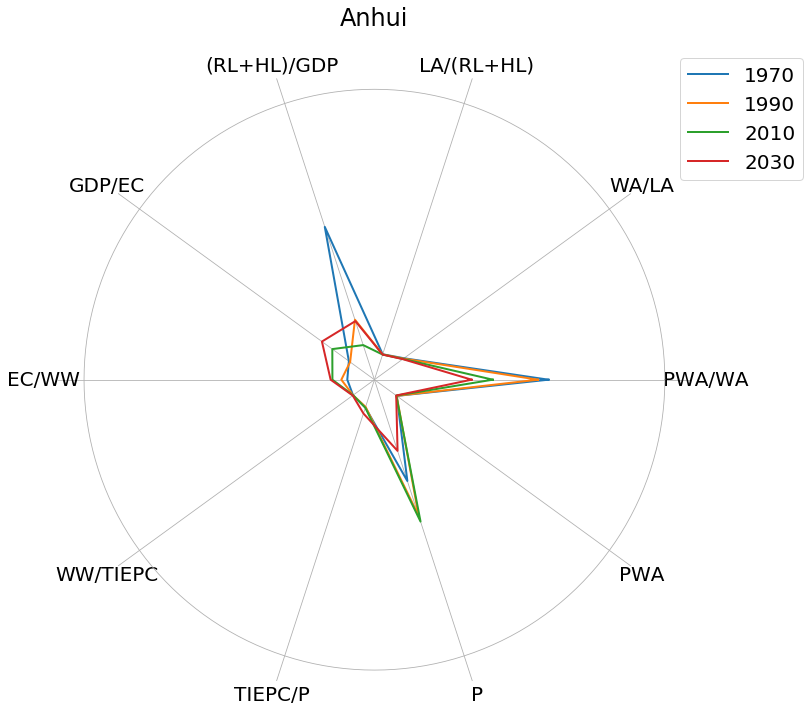

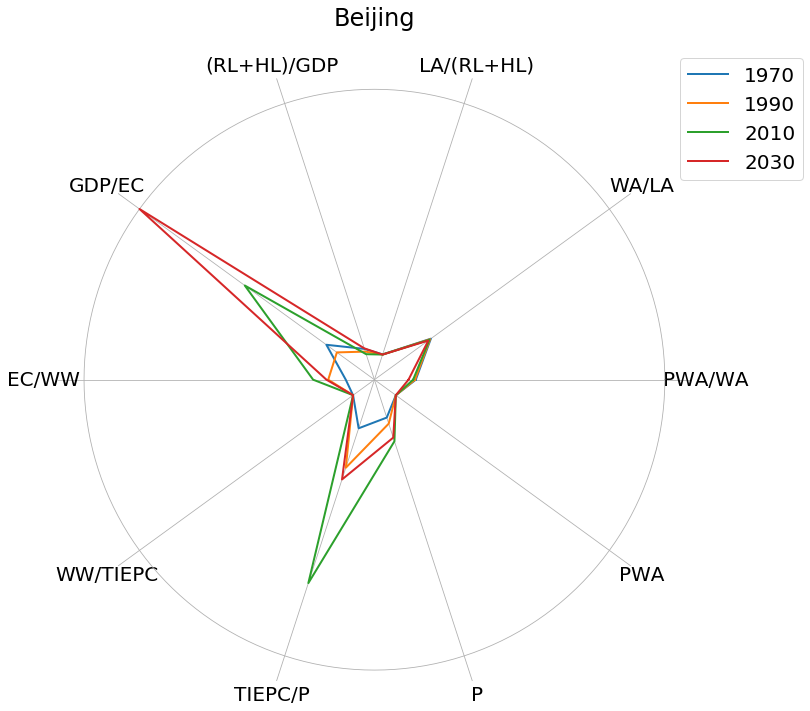

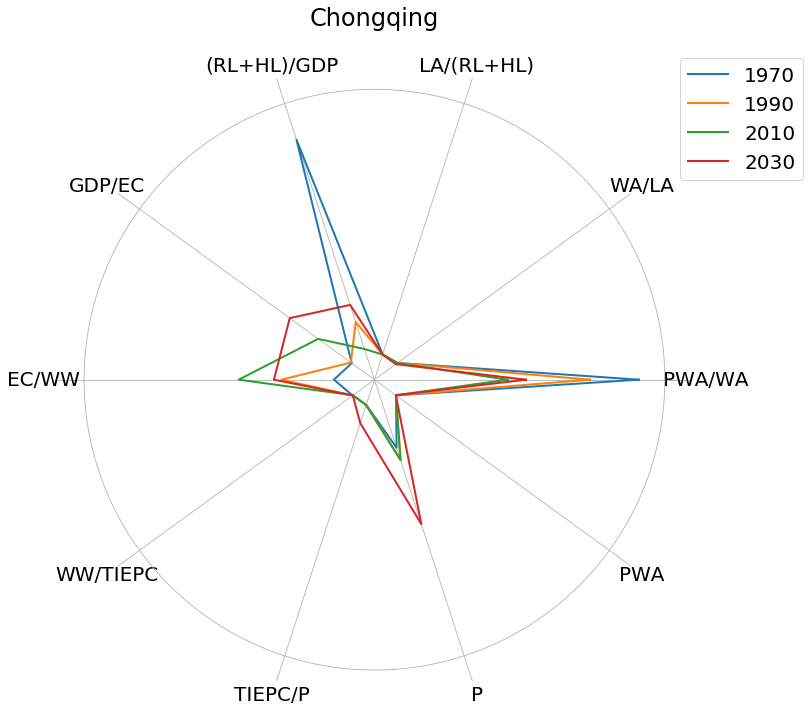

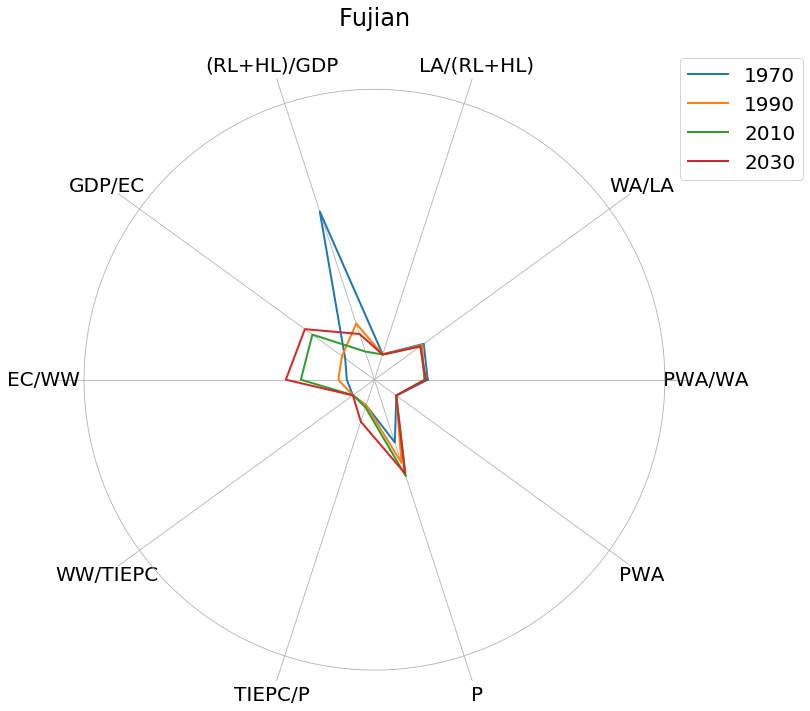

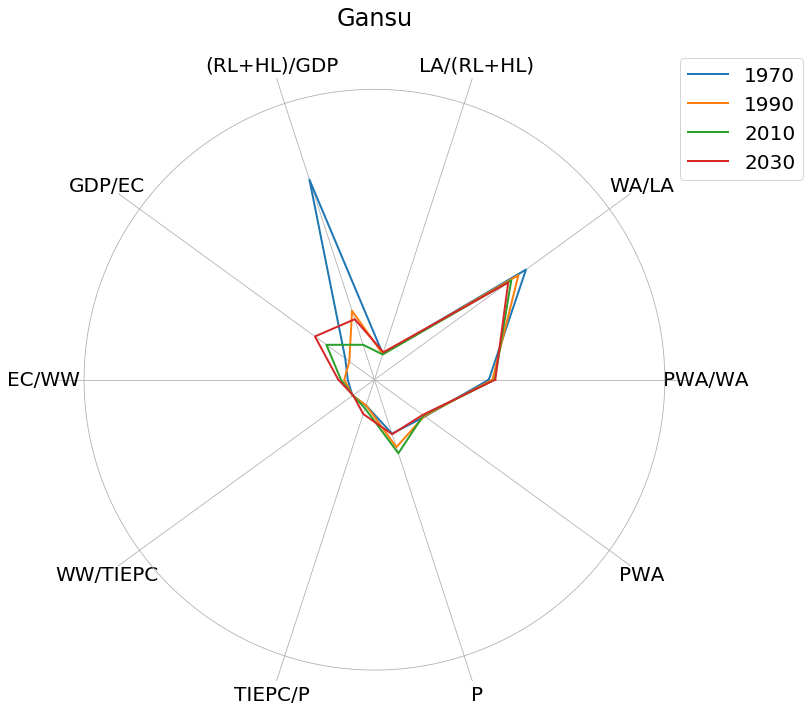

...

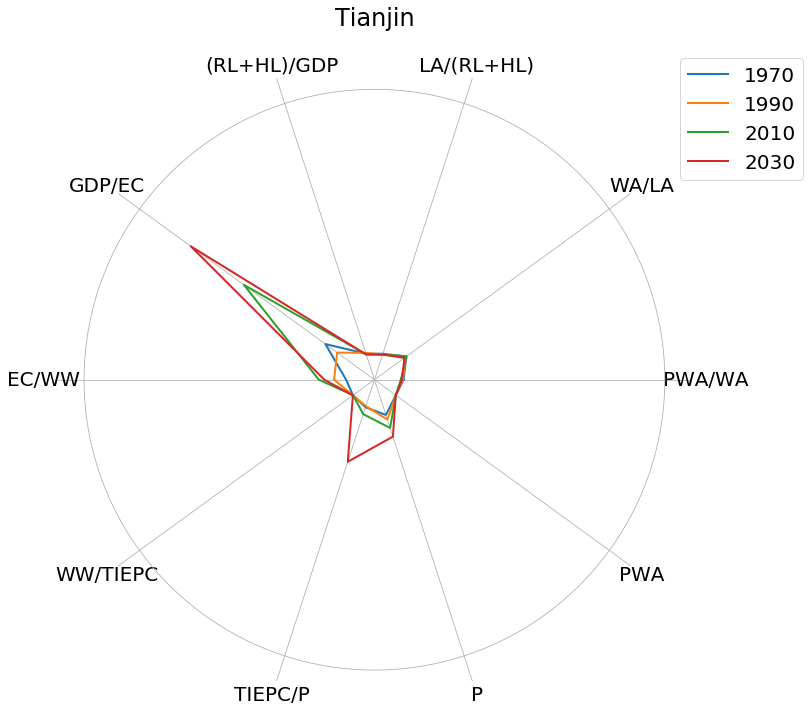

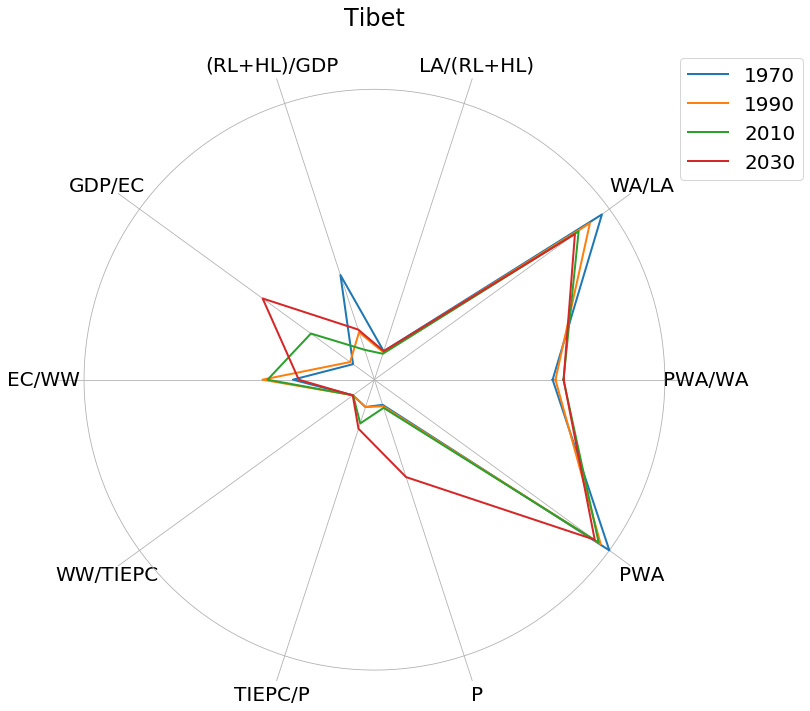

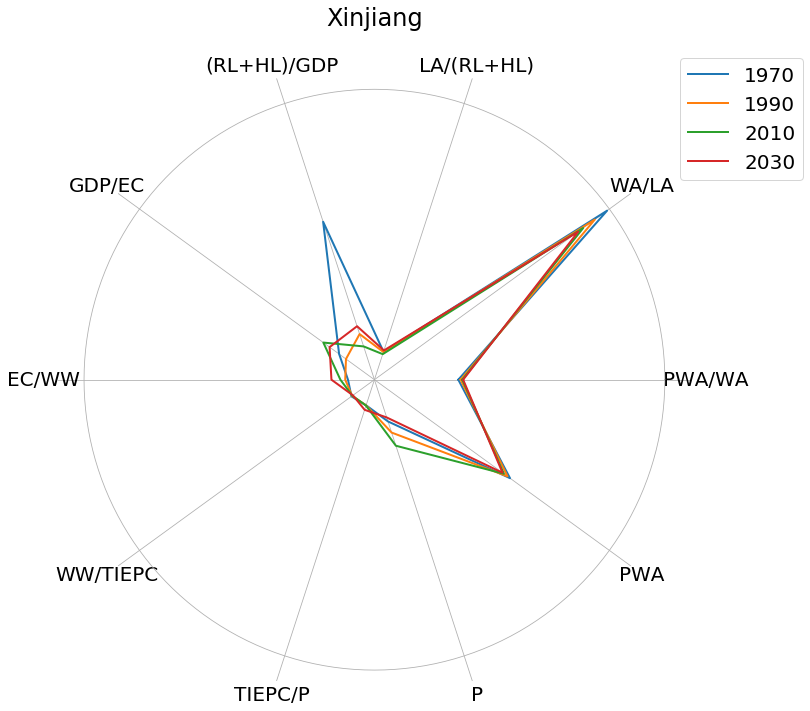

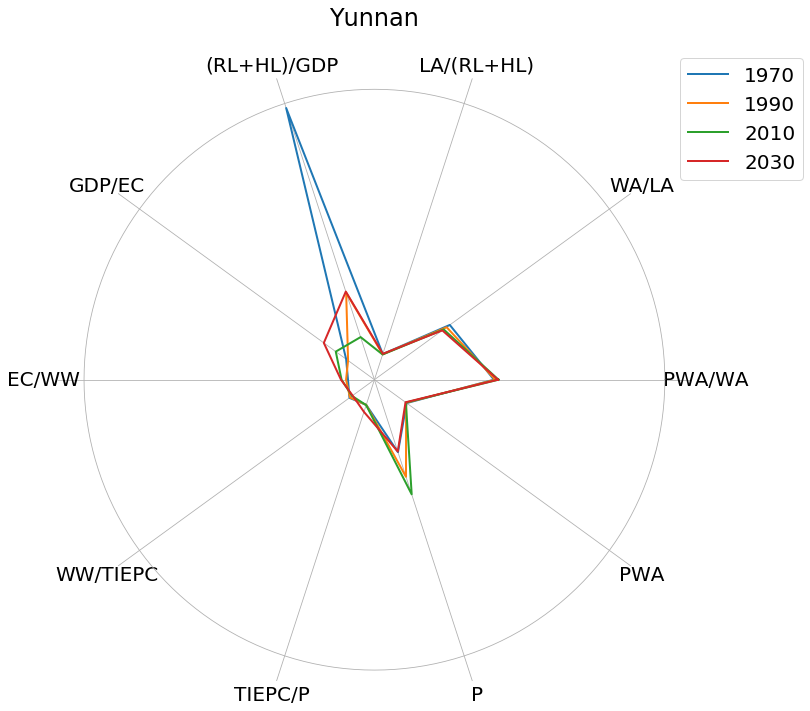

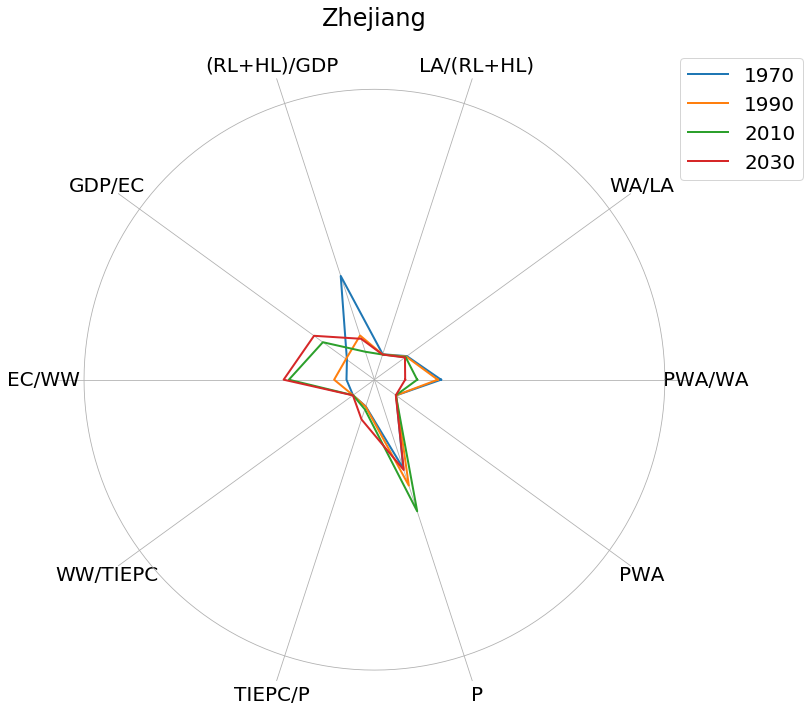

In [160]:
for num,el in enumerate(Provinces):
    Vivod3(num,el)